# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# Random Forest

<ol>
    <li><strong>Apply Random Forests & GBDT on these feature sets</strong>
        <ul>
            <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
        </ul>
    </li>
    <br>
    <li><strong>The hyper paramter tuning (Consider two hyperparameters: n_estimators & max_depth)</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li>          
        </ul>
    </li>
    <br>
    <li><strong>Feature importance</strong>
        <ul>
    <li>Get top 20 important features and represent them in a word cloud. Do this for BOW & TFIDF.</li>
        </ul>
    </li>
    <br>
    <li><strong>Feature engineering</strong>
        <ul>
    <li>To increase the performance of your model, you can also experiment with with feature engineering like :</li>
            <ul>
            <li>Taking length of reviews as another feature.</li>
            <li>Considering some features from review summary as well.</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='3d_plot.JPG' width=500px> with X-axis as <strong>n_estimators</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>(or)</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='heat_map.JPG' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points. Please visualize your confusion matrices using <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heatmaps.
    <img src='confusion_matrix.png' width=300px></li>
        </ul>
    </li>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

# <h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

## [A] Applying RF

# Import Required Packages

In [1]:
import os
from datetime import datetime
import pandas as pd
import numpy as np

# visualization related packages
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# data prerocessing related
from sklearn.preprocessing import StandardScaler

# import model related packages and visualization of trees
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import export_graphviz
import graphviz


# import model selection packages
from sklearn.model_selection import StratifiedKFold

# import model evaluation related packages
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import auc, roc_curve
from scipy import interp

# calibration related package
from sklearn.calibration import CalibratedClassifierCV

# visualization related packages
from wordcloud import WordCloud
from prettytable import PrettyTable

# for forming grid
from itertools import product

# UTILS functions

## Data Preprocessing related Functions

In [2]:
def preprocess_data(config_dict, scaling=True, dim_reduction=False):
    """
    This function does preprocessing of data such as column standardization and
    dimensionality reduction using Truncated SVD
    """
    
    # Read train, test data frames & truncate it as needed
    train_df = pd.read_csv(config_dict['train_csv_path'], index_col=False)
    train_df = train_df.iloc[0:config_dict['train_size']]
    test_df = pd.read_csv(config_dict['test_csv_path'], index_col=False)
    test_df = test_df.iloc[0:config_dict['test_size']]

    # print the statisics of train, test df
    print('Train df shape',train_df.shape)
    print('Class label distribution in train df:\n', train_df['Label'].value_counts())
    print('Test df shape',test_df.shape)
    print('Class label distribution in test df:\n', test_df['Label'].value_counts())

    # separate features and labels
    train_features = train_df.drop(['Label', 'Id'], axis=1)    
    train_labels = train_df['Label']
    test_features = test_df.drop(['Label', 'Id'], axis=1)
    test_labels = test_df['Label']
    
    # set feature names
    feature_name_list = train_features.columns.values.tolist()
    
    # If Scaling is opted scale the train, test data
    if scaling:
        standard_scaler = StandardScaler()
        standard_scaler.fit(train_features)
    
        train_features = pd.DataFrame(standard_scaler.transform(train_features), 
                                      columns=feature_name_list)
        test_features = pd.DataFrame(standard_scaler.transform(test_features),
                                     columns=feature_name_list)
                             
    print('Shape of ->  train features :%d,%d, test features: %d,%d'%(train_features.shape +  
                                                                      test_features.shape))
    print('Shape of -> train labels :%d, test labels: %d'%(train_labels.shape[0], 
                                                           test_labels.shape[0],))
    
    # if dim reduction is opted, reduce the dimension
    if dim_reduction:
        # create an SVD object
        truc_svd = TruncatedSVD(n_components=train_features.shape[1]-1, n_iter=8, algorithm='randomized')

        # fit to data
        truc_svd.fit(train_features)
        
        # get explained variance ratio of each component
        explained_var_ratios = truc_svd.explained_variance_ratio_
        
        # get cummulative ratio list for selecting the number of components
        cumulative_ratios = np.cumsum(explained_var_ratios)
        
        # plot the #components vs captured variance in the data
        plt.title('SVD Decomposition')
        plt.xlabel('Number of components')
        plt.ylabel('Cumulative Percentage Ratio')
        plt.plot(range(1, len(cumulative_ratios) + 1), cumulative_ratios)
        plt.show()

        # set a threshold for stopping selection of components.
        svd_thesh = 0.001
        # select the number of components as the first component for which the difference between cummulative ratio is
        #  very less (less than svd thresh) compared with the very next component
        selected_dim = list(filter(lambda x : x[1] < svd_thesh, enumerate(np.diff(cumulative_ratios))))[0][0]
        print('Num dimensions selected by SVD', selected_dim)
        print('Total variance captured:%f'%(cumulative_ratios[selected_dim]))

        # create an object for selecting the components
        truc_svd = TruncatedSVD(n_components=selected_dim, n_iter=8, algorithm='randomized')
        # refit with the desired number of components
        truc_svd.fit(train_features)

        # reduce the number of dimensions to selected number of components
        train_features = pd.DataFrame(truc_svd.transform(train_features))
        test_features = pd.DataFrame(truc_svd.transform(test_features))
        
        # get the shape of final data frame and print it
        size_tuple = train_features.shape + test_features.shape
        print('Shape of train df:(%d,%d), Test DF:(%d,%d)'%size_tuple)

    
    return (train_features, train_labels, test_features, test_labels,)

## Model Training and Evaluation related packages

In [3]:
def plot_roc_curves_single(fold_prediction_list, plot_title):
    """
    This function helps to plot the ROC curve for a set of predictions on different folds.
    """
    
    # set figure size
    plt.figure(figsize=(10,10))

    # reference points for X axis
    ref_points = np.linspace(0.0, 1.0, 100)

    # two lists for auc values and tpr rates
    auc_scores_list = list()
    tpr_list = list()
    
    # plot ROC curve for each fold
    for index, (actual_probs, predicted_probs,) in enumerate(fold_prediction_list):

        # compute ROC curve and get the AUC value for this fold
        fpr, tpr, thresholds = roc_curve(actual_probs, predicted_probs)
        # compute AUC
        auc_score = auc(fpr, tpr)

        # interpolation to approximate the curve
        tp_rates = interp(ref_points, fpr, tpr)
        tp_rates[0] = 0.0 # for setting the bottom left point

        # for plotting the individual fold and finding the average
        auc_scores_list.append(auc_score)
        tpr_list.append(tp_rates)

        # plot this fold info into a fig
        plt.plot(fpr, tpr, alpha=0.3, lw=1, label='Test AUC for fold %d : %f'%(index, auc_score))

    # Plot the random classifier
    plt.plot([0,1],[0,1], alpha=0.8, linestyle='--', color='red', label='Random Guess', lw=2)

    # Plot the mean performance
    mean_tpr = np.mean(tpr_list, axis=0)
    std_tprs = np.std(tpr_list, axis=0)
    # mean value of AUC and its standard deviation
    mean_auc = auc(ref_points, mean_tpr)
    std_auc = np.std(auc_scores_list)

    plt.plot(ref_points, mean_tpr, linestyle='-', color='g', lw=2, 
             alpha=0.8, label='Test Mean AUC %f $\pm$ %f'%(mean_auc,std_auc))


    # Find upper and lower bounds for shading the region around TPRs
    tprs_lower_region = np.maximum(mean_tpr - std_tprs, 0)
    tprs_upper_region = np.minimum(mean_tpr + std_tprs, 1)

    # Fill the region between upper and lower in gray color
    plt.fill_between(ref_points, tprs_lower_region, tprs_upper_region, color='gray', alpha=0.2, 
                    label='Test Around the mean TPRs')

    # arange the plot
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rates')
    plt.ylabel('True Positive Rates')
    plt.title('ROC Curve - ' + plot_title)
    plt.legend(loc='lower right')
    plt.show()
    
    return mean_auc

In [4]:
def plot_roc_curves_pair(train_fold_prediction_list, validation_fold_prediction_list, plot_title):
    """
    This function helps to plot the ROC curve for a set of predictions on different folds.
    """
    
    # set figure size
    plt.figure(figsize=(10,10))

    # reference points for X axis
    ref_points = np.linspace(0.0, 1.0, 100)

    
    # -------------------- 1 FOR TRAIN --------------------------------------------
    # two lists for auc values and tpr rates
    auc_scores_list = list()
    tpr_list = list()
    
    # plot ROC curve for each fold
    for index, (actual_probs, predicted_probs,) in enumerate(train_fold_prediction_list):

        # compute ROC curve and get the AUC value for this fold
        fpr, tpr, thresholds = roc_curve(actual_probs, predicted_probs)
        # compute AUC
        auc_score = auc(fpr, tpr)

        # interpolation to approximate the curve
        tp_rates = interp(ref_points, fpr, tpr)
        tp_rates[0] = 0.0 # for setting the bottom left point

        # for plotting the individual fold and finding the average
        auc_scores_list.append(auc_score)
        tpr_list.append(tp_rates)

        # plot this fold info into a fig
        plt.plot(fpr, tpr, alpha=0.3, lw=1, label='Train AUC for fold %d : %f'%(index, auc_score))

    # Plot the mean performance
    mean_tpr = np.mean(tpr_list, axis=0)
    std_tprs = np.std(tpr_list, axis=0)
    # mean value of AUC and its standard deviation
    mean_auc = auc(ref_points, mean_tpr)
    std_auc = np.std(auc_scores_list)

    plt.plot(ref_points, mean_tpr, linestyle='-', color='b', lw=2, 
             alpha=0.8, label='Train Mean AUC %f $\pm$ %f'%(mean_auc,std_auc))


    # Find upper and lower bounds for shading the region around TPRs
    tprs_lower_region = np.maximum(mean_tpr - std_tprs, 0)
    tprs_upper_region = np.minimum(mean_tpr + std_tprs, 1)

    # Fill the region between upper and lower in gray color
    plt.fill_between(ref_points, tprs_lower_region, tprs_upper_region, color='b', alpha=0.2, 
                    label='Train Around the mean TPRs')
    
    # train mean auc
    train_mean_auc = mean_auc
    
    
    # -------------------- 1 FOR VALIDATION --------------------------------------------
    # two lists for auc values and tpr rates
    auc_scores_list = list()
    tpr_list = list()
    
    # plot ROC curve for each fold
    for index, (actual_probs, predicted_probs,) in enumerate(validation_fold_prediction_list):

        # compute ROC curve and get the AUC value for this fold
        fpr, tpr, thresholds = roc_curve(actual_probs, predicted_probs)
        # compute AUC
        auc_score = auc(fpr, tpr)

        # interpolation to approximate the curve
        tp_rates = interp(ref_points, fpr, tpr)
        tp_rates[0] = 0.0 # for setting the bottom left point

        # for plotting the individual fold and finding the average
        auc_scores_list.append(auc_score)
        tpr_list.append(tp_rates)

        # plot this fold info into a fig
        plt.plot(fpr, tpr, alpha=0.3, lw=1, label='Val AUC for fold %d : %f'%(index, auc_score))

    # Plot the mean performance
    mean_tpr = np.mean(tpr_list, axis=0)
    std_tprs = np.std(tpr_list, axis=0)
    # mean value of AUC and its standard deviation
    mean_auc = auc(ref_points, mean_tpr)
    std_auc = np.std(auc_scores_list)
    
    
    # val mean auc
    val_mean_auc = mean_auc

    plt.plot(ref_points, mean_tpr, linestyle='-', color='g', lw=2, 
             alpha=0.8, label='Val Mean AUC %f $\pm$ %f'%(mean_auc,std_auc))


    # Find upper and lower bounds for shading the region around TPRs
    tprs_lower_region = np.maximum(mean_tpr - std_tprs, 0)
    tprs_upper_region = np.minimum(mean_tpr + std_tprs, 1)

    # Fill the region between upper and lower in gray color
    plt.fill_between(ref_points, tprs_lower_region, tprs_upper_region, color='g', alpha=0.2, 
                    label='Val Around the mean TPRs')
    
    # Plot the random classifier
    plt.plot([0,1],[0,1], alpha=0.8, linestyle='--', color='red', label='Random Guess', lw=2)

    # arange the plot
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rates')
    plt.ylabel('True Positive Rates')
    plt.title('ROC - ' + plot_title)
    plt.legend(loc='lower right')
    plt.show()
    
    return (train_mean_auc, val_mean_auc)

In [5]:
def get_confusion_matrix(actual_list, predicted_list, cm_title):
    """
    This function plots the confusion matrix given ground truth and predicted
    """

    conf_matrix = confusion_matrix(actual_list, predicted_list)
    col_names = ['Negative', 'Positive']
    conf_df = pd.DataFrame(conf_matrix,columns=col_names)
    conf_df.index = col_names

    plt.figure(figsize = (5,5))

    plt.title(cm_title)
    sns.set(font_scale=1.4)#for label size
    sns.heatmap(conf_df, annot=True, annot_kws={"size": 16}, fmt='g')

    plt.show()

In [6]:
def create_hyperparam_heatmap(hyper_param_score_list, hamp_title):
    """
    This function accepts a list containing the hyper parameters ('max_depth', 'n_estimators') and 
    the corresponding score value, such as AUC, FScore etc and plot the heatmap.
    """
    
    hyp_score_list = [item[1] for item in hyper_param_score_list]
    coord_list = [item[0] for item in hyper_param_score_list]
    hyp_df = pd.DataFrame(coord_list, columns=['max_depth', 'n_estimators'])
    hyp_df['AUC'] = hyp_score_list
    
    # pivot the table for heatmap representation
    pivoted_hyp = pd.pivot_table(hyp_df, index='max_depth', columns='n_estimators', 
                                       values='AUC', fill_value=0)
    sns.heatmap(data=pivoted_hyp, annot=True)
    plt.title(hamp_title)
    plt.show()

In [7]:
def find_best_hyperparameter(config_dict, train_features, train_labels):
    """
    This function helps to find the best hyper parameters (alpha) for RF or XGB algorithm.
    All set of hyper param values using which the model to be evaluated can be passed to the
    list hyperparam_list.
    """
    print('='*100)

    stratified_partition = StratifiedKFold(n_splits=2)
    
    # read some config settings
    hyperparam_list = config_dict['hyperparam_list']
    implementation = config_dict['implementation']
    
    # declare a hyper param list
    hyper_param_score_list = list()

    for hyp_val in hyperparam_list:

        # declare three lists for holding prediction informations
        # for train set performance
        train_actual_labels_list = list()
        train_predicted_probs_list = list()
        train_predicted_labels_list = list()
        
        # for validation set performance
        val_actual_labels_list = list()
        val_predicted_probs_list = list()
        val_predicted_labels_list = list()
        
        # Model defined here
        if implementation == 'rf':
            classifier = RandomForestClassifier(max_depth=hyp_val[0], n_estimators=hyp_val[1])
            # Declare a calibrated classifer
            calib_classifier = CalibratedClassifierCV(base_estimator=classifier,
                                                      method='isotonic',
                                                      cv='prefit')
        else:
            classifier = XGBClassifier(max_depth=hyp_val[0], n_estimators=hyp_val[1])
        
        
    
        # Train the model and evaluate it on the current fold data
        for train_indices, val_indices in stratified_partition.split(train_features, train_labels):

            # A) train the model suing StratifiedKFold method
            
            # get the train features, train labels for this fold
            train_feat_data = train_features.iloc[train_indices, :]
            train_label_data = train_labels[train_indices]
            
            # train the classifier
            classifier.fit(train_feat_data, train_label_data)
            
            # For random forest we need to calibrate
            if implementation == 'rf':
                calib_classifier.fit(train_feat_data, train_label_data)
                train_eval_y_probs = calib_classifier.predict_proba(train_feat_data)[:, 1]
            else:
                train_eval_y_probs = classifier.predict_proba(train_feat_data)[:, 1]

            # estimate the training metrics on (train fold)
            train_eval_y_value = classifier.predict(train_feat_data)
            
            # save the results for ROC plot
            train_actual_labels_list.append(train_label_data)
            train_predicted_probs_list.append(train_eval_y_probs)
            train_predicted_labels_list.append(train_eval_y_value) 


            # B) predict the labels and probability for this fold (validation fold)
            
            # get the validation features, validation labels for this fold
            validation_feat_data = train_features.iloc[val_indices, :]
            validation_label_data = train_labels[val_indices]
            
            # evaluate the classifier on validation set
            val_actual_labels_list.append(validation_label_data)
            
            # predict the probability for validation data
            if implementation == 'rf':
                # validation step
                val_eval_y_probs = calib_classifier.predict_proba(validation_feat_data)[:, 1]
            else:
                val_eval_y_probs = classifier.predict_proba(validation_feat_data)[:, 1]
            
            # predict the output for validation
            val_eval_y_value = classifier.predict(validation_feat_data)
           
            # save the results for ROC plot
            val_predicted_probs_list.append(val_eval_y_probs)
            val_predicted_labels_list.append(val_eval_y_value)
            
            
        # plot the results to select best hyper params
        
        # train data plot
        train_fold_prediction_list = list(zip(train_actual_labels_list, train_predicted_probs_list))
        
        # plot the roc curve for train data
        if len(hyp_val) == 2:
            
            # get input data for plotting train and validation
            train_fold_prediction_list = list(zip(train_actual_labels_list, train_predicted_probs_list))
            val_fold_prediction_list = list(zip(val_actual_labels_list, val_predicted_probs_list))

            # validation data plot
            mean_aucs = plot_roc_curves_pair(train_fold_prediction_list, val_fold_prediction_list, 
                'ROC Plot: Train & Validation of Ensemble (max_depth:%d, num_estimators:%d)'%hyp_val)
        
            # update the list with the scores for this hyperparam for both tain, validation aucs
            hyper_param_score_list.append((hyp_val, mean_aucs[0], mean_aucs[1]))
        else:
            print('Invalid hyper param configs')
        
    print('='*100)
        
    return hyper_param_score_list

In [8]:
def train_and_validate_model(config_dict, train_features, train_labels):
    """
    This function train a model, validate it using cross validation and return the best model
    obtained during cross validation.
    """
    
    # get model is RF or XGB
    implementation = config_dict['implementation']
    
    # find best hyperparameter by stratified cross validation
    hyper_param_scores_list = find_best_hyperparameter(config_dict, train_features, train_labels)
    
    # extract individual fields
    depth_value_list = [item[0][0] for item in hyper_param_scores_list]
    num_estimators_list = [item[0][1] for item in hyper_param_scores_list]
    tr_auc_list = [item[1] for item in hyper_param_scores_list]
    val_auc_list = [item[2] for item in hyper_param_scores_list]
    
    # print k vs auc
    print('+'*100)
    print('\n\n The depth vs AUC score plot')
    plt.plot(depth_value_list, tr_auc_list, label='Train AUC')
    plt.plot(depth_value_list, val_auc_list, label='Validation AUC')
    plt.xlabel('depth')
    plt.ylabel('AUC Scores')
    plt.title('depth vs AUC')
    plt.legend()
    plt.show()
    print('+'*100)
    
    print('+'*100)
    print('\n\n The num_estimators vs AUC score plot')
    plt.plot(num_estimators_list, tr_auc_list, label='Train AUC')
    plt.plot(num_estimators_list, val_auc_list, label='Validation AUC')
    plt.xlabel('num_estimatores')
    plt.ylabel('AUC Scores')
    plt.title('num_estimators vs AUC')
    plt.legend()
    plt.show()
    print('+'*100)
    
    
    # heatmap plot for selecting the best hyper params
    hyper_param_scores_list_train = [(item[0], item[1]) for item in hyper_param_scores_list]
    hyper_param_scores_list_validation = [(item[0], item[2]) for item in hyper_param_scores_list]
    
    # plot heatmap for train and validation
    create_hyperparam_heatmap(hyper_param_scores_list_train, 'Hyper param Heatmap DT-Train')
    create_hyperparam_heatmap(hyper_param_scores_list_validation, 'Hyper param Heatmap DT-Validation')
    
    
    #Set the best Hyper param based on above plots
    best_hyper_param = min(hyper_param_scores_list, key=lambda x: abs(x[1] - x[2]) + (1 / (x[1]+0.001) ))[0]
    print('Best hyperparam value: ', best_hyper_param)
    
    # decalre the optional calib classifier as None
    calib_classifier = None
    
    # Final Model defined here
    if implementation == 'rf':
        classifier = RandomForestClassifier(max_depth=best_hyper_param[0], 
                                               n_estimators=best_hyper_param[1])
        # Declare a calibrated classifer
        calib_classifier = CalibratedClassifierCV(base_estimator=classifier,
                                              method='isotonic',
                                              cv='prefit')
    else:
        classifier = XGBClassifier(max_depth=best_hyper_param[0], 
                                   n_estimators=best_hyper_param[1])

    # train the classifier
    classifier.fit(train_features, train_labels)
    
    if implementation == 'rf':
        calib_classifier.fit(train_features, train_labels)
        train_eval_y_probs = calib_classifier.predict_proba(train_features)[:, 1]
    else:
        train_eval_y_probs = classifier.predict_proba(train_features)[:, 1]

    # estimate the training metrics on (train fold)
    train_eval_y_value = classifier.predict(train_features)
    train_info_list = list(zip([train_labels], [train_eval_y_probs]))
    
    
    # get train auc value
    train_auc_val = plot_roc_curves_single(train_info_list, 
                                    'Final Model DT (depth:%d, n_estimators:%d)'%best_hyper_param)
    
    
    # print the confusion matrix
    get_confusion_matrix(train_labels, train_eval_y_value, 'Train Confusion Matrix')
    
    # compute precision and other matric
    all_metrics = precision_recall_fscore_support(train_labels, train_eval_y_value)
    all_metrics_df = pd.DataFrame(list(all_metrics), columns=['Negative', 'Positive'])
    all_metrics_df.index = ['Precision', 'Recall', 'Fscore', 'Support']
    # convert fscore to percentage
    fscores = all_metrics[2] * 100.0
    
    print(all_metrics_df)
    
    # return the final model 
    return (classifier, calib_classifier,)

In [9]:
def test_and_evaluate_model(config_dict, model, test_features, test_labels):
    """
    This function test and evaluate the performance on unseen data.
    """
    
    # separate out models
    classifier = model[0]
    calib_classifier = model[1]
    
    # get type of model
    implementation = config_dict['implementation']
    
    # evaluate final model on test dataset
    if implementation == 'xgb':
        test_eval_y_probs = classifier.predict_proba(test_features)[:, 1]
    else:
        test_eval_y_probs = calib_classifier.predict_proba(test_features)[:, 1]
        
    test_eval_y_value = classifier.predict(test_features)
    test_info_list = list(zip([test_labels], [test_eval_y_probs]))
    
    # test auc value
    best_hyp = (classifier.max_depth, classifier.n_estimators,)
    test_auc_val = plot_roc_curves_single(test_info_list, 
                                   'Final Model DT (depth:%d, n_estimators:%d)'%best_hyp)
        
    print('Test auc score ', test_auc_val)
    
    # print the confusion matrix
    get_confusion_matrix(test_labels, test_eval_y_value, 'Test Confusion Matrix')
    
    # compute precision and other matric
    all_metrics = precision_recall_fscore_support(test_labels, test_eval_y_value)
    all_metrics_df = pd.DataFrame(list(all_metrics), columns=['Negative', 'Positive'])
    all_metrics_df.index = ['Precision', 'Recall', 'Fscore', 'Support']
    # convert fscore to percentage
    fscores = all_metrics[2] * 100.0
    
    # print all the metrics
    print(all_metrics_df)

    # create an entry for pretty table using all the metrics
    
    # get the table entry
    ptabe_entry = [best_hyp] + [ '%.4f'%item for item in ([test_auc_val] + list(fscores))]
    
    print('Results Summary: \n', list(zip(['Hyper Param', 'AUC', 'f-score(-ve)', 'f-score(+ve)'], 
                                          ptabe_entry)))
    
    return ptabe_entry

### [A.1] Applying Random Forests on BOW,<font color='red'> SET 1</font>

In [10]:
# form two lists
depth_list = [3, 5, 10, 20, 50] # depends on size of dataset
n_estimators_list = [20, 60, 120, 300, 500] # depends on size of dataset

# declare a configuartion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/BOW/train_bow_bigram.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/BOW/test_bow_bigram.csv',
    'train_size' : 50000,
    'test_size' : 20000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'rf' # 'xgb' or 'rf'
}

Train df shape (50000, 503)
Class label distribution in train df:
 0    25029
1    24971
Name: Label, dtype: int64
Test df shape (20000, 503)
Class label distribution in test df:
 1    16520
0     3480
Name: Label, dtype: int64
Shape of ->  train features :50000,501, test features: 20000,501
Shape of -> train labels :50000, test labels: 20000


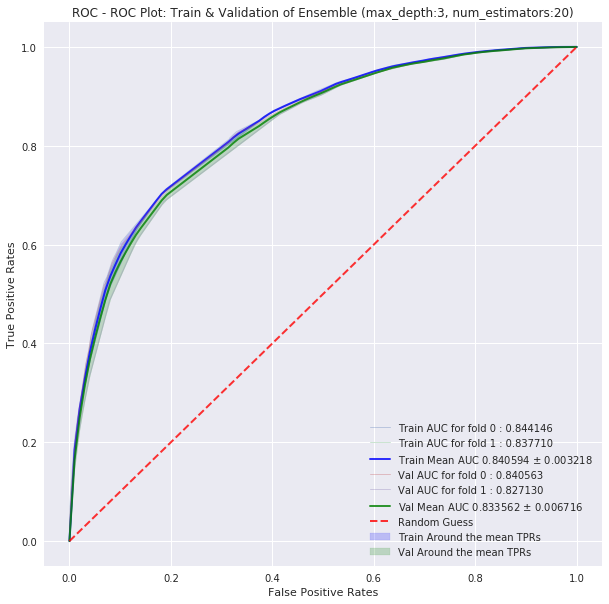

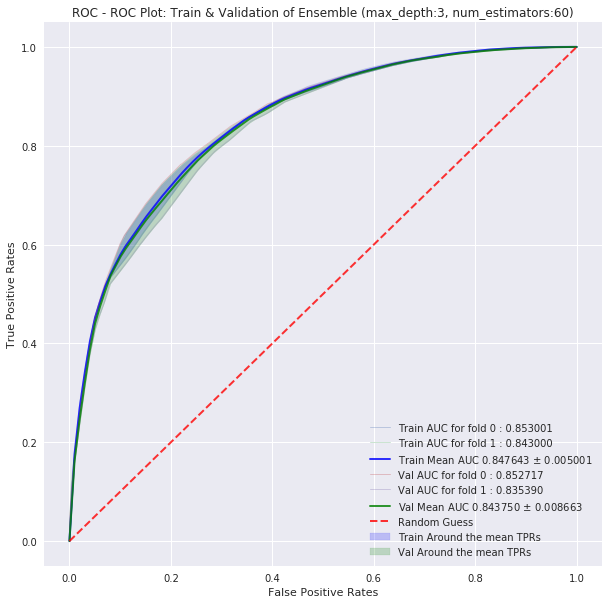

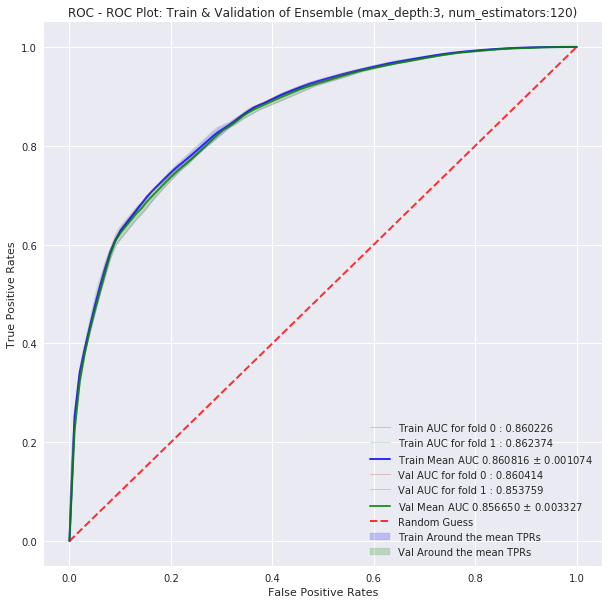

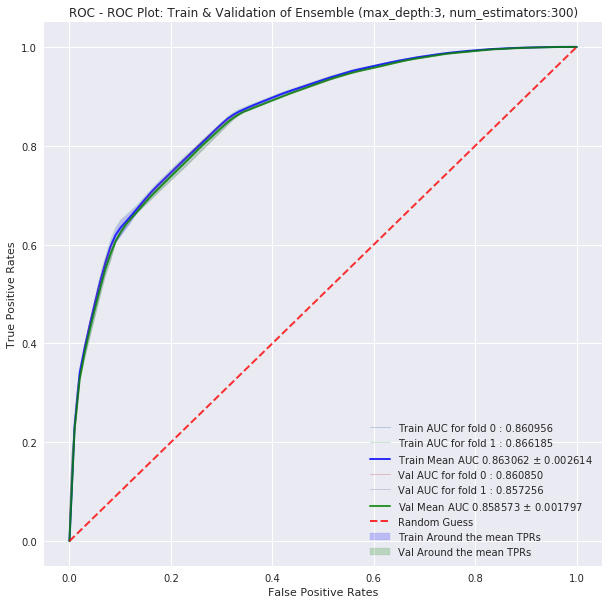

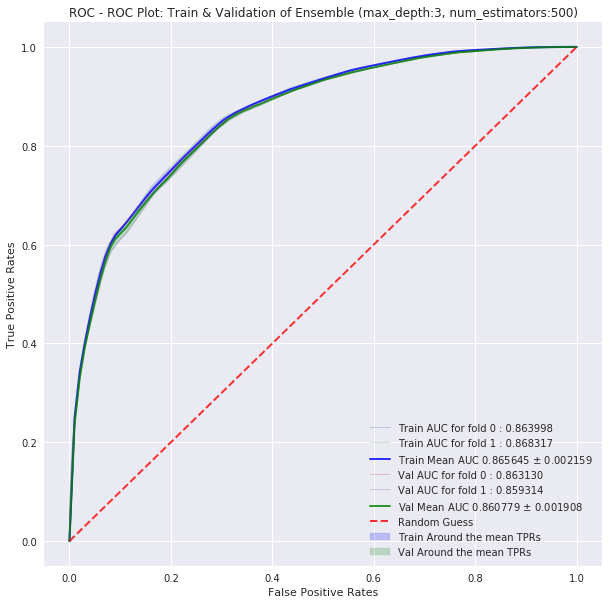

...

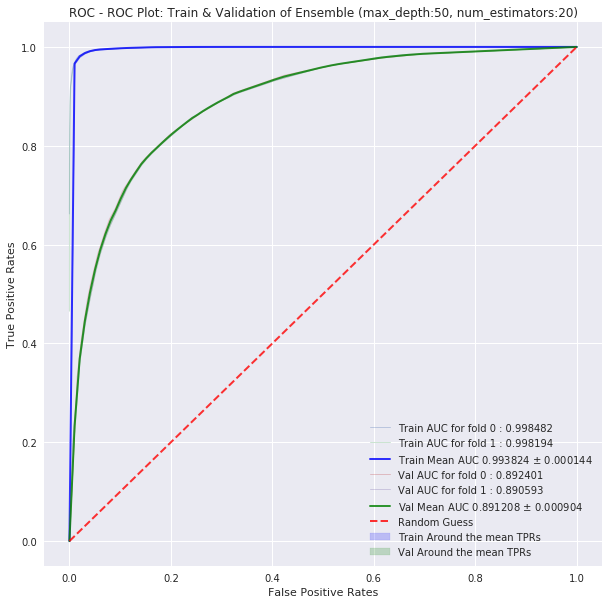

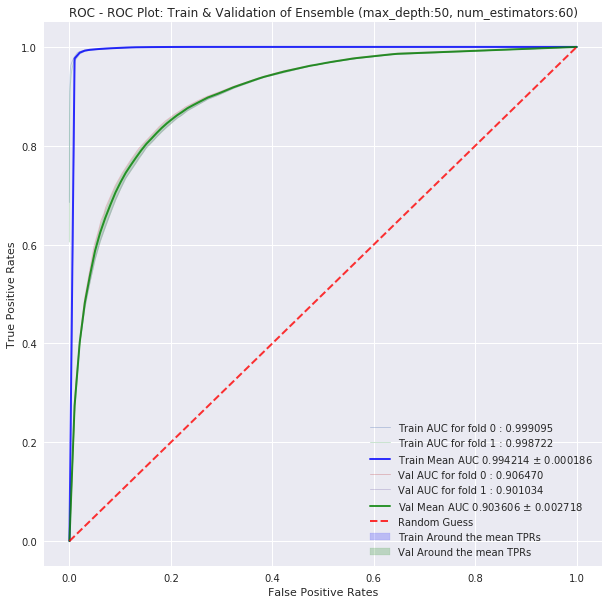

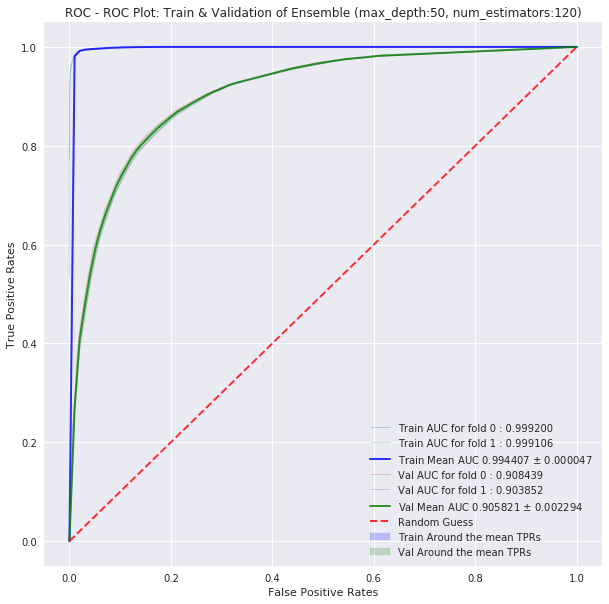

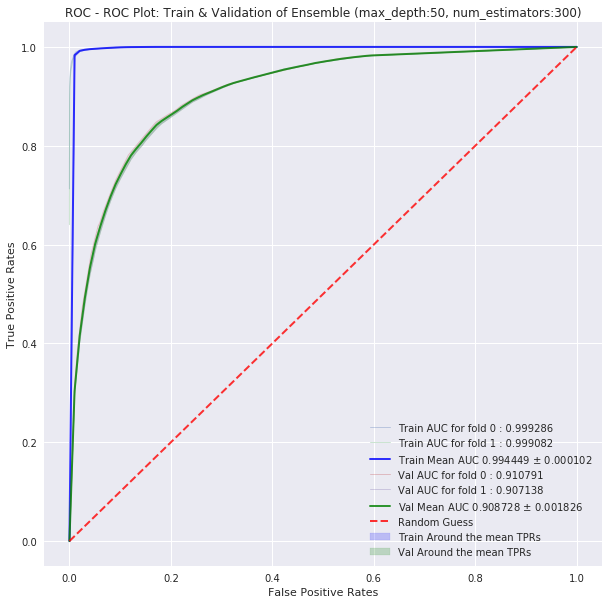

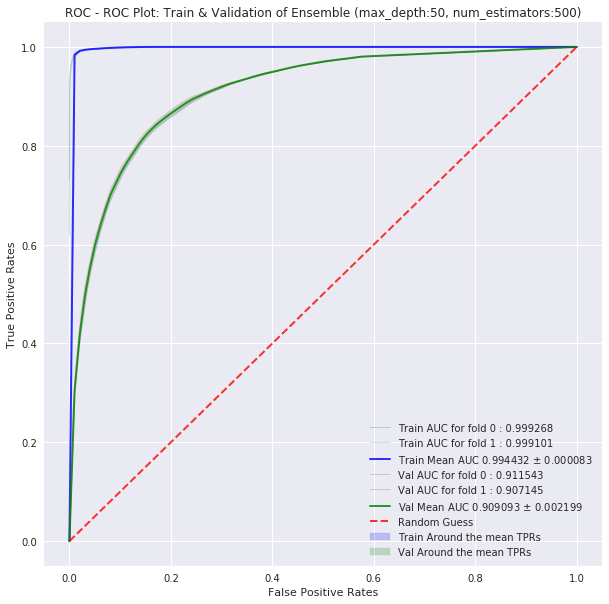

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


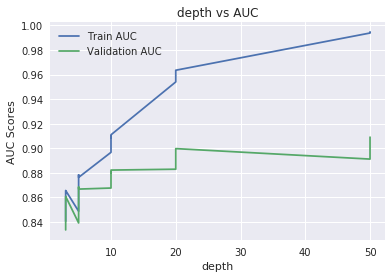

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


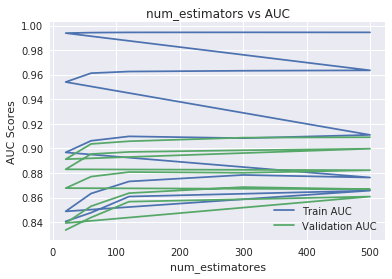

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


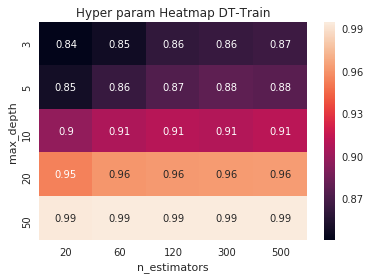

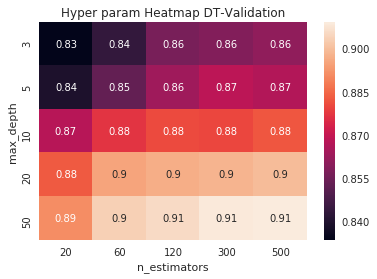

Best hyperparam value:  (50, 500)


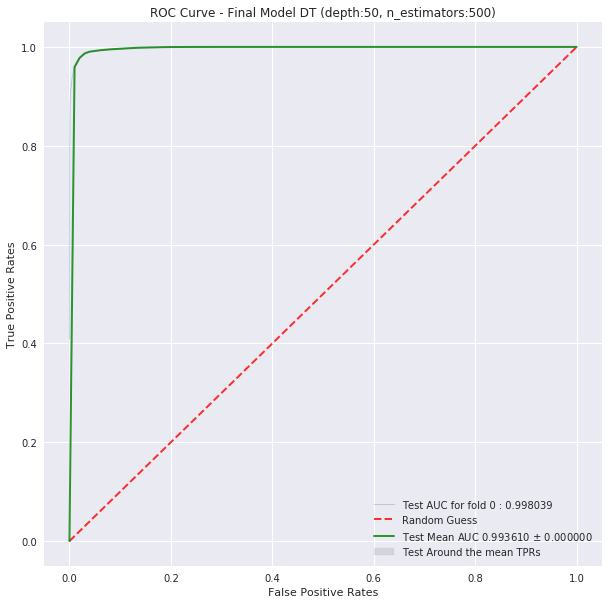

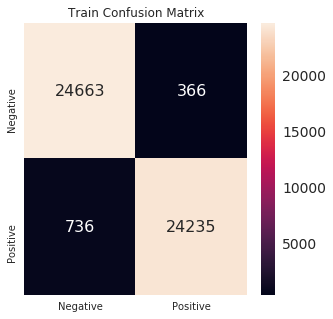

               Negative      Positive
Precision      0.971022      0.985123
Recall         0.985377      0.970526
Fscore         0.978147      0.977770
Support    25029.000000  24971.000000


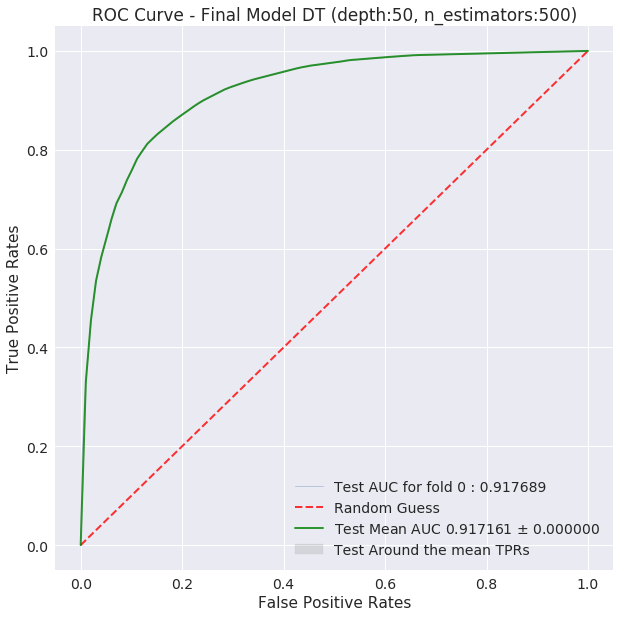

Test auc score  0.9171612638262937


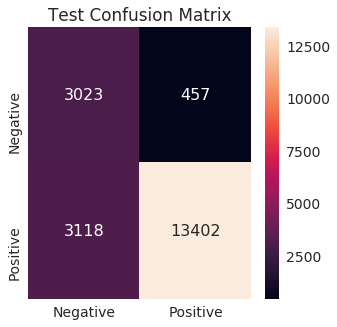

              Negative      Positive
Precision     0.492265      0.967025
Recall        0.868678      0.811259
Fscore        0.628417      0.882320
Support    3480.000000  16520.000000
Results Summary: 
 [('Hyper Param', (50, 500)), ('AUC', '0.9172'), ('f-score(-ve)', '62.8417'), ('f-score(+ve)', '88.2320')]


In [11]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# create a list containing all the features
feature_name_list = train_features.columns.values.tolist()

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_a1 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

### [A.2] Wordcloud of top 20 important features from<font color='red'> SET 1</font>

In [12]:
# get feature and its importance as tuple
feature_imp_info = list(zip(feature_name_list, model[0].feature_importances_))

# filter only those features which have a value greater than zero
feature_imp_dict = dict(list(filter(lambda x: x[1] > 0.0, feature_imp_info)))

# create word cloud object for displaying the output
wc = WordCloud(background_color='white', width=800, height=800)
wc_output = wc.generate_from_frequencies(feature_imp_dict)

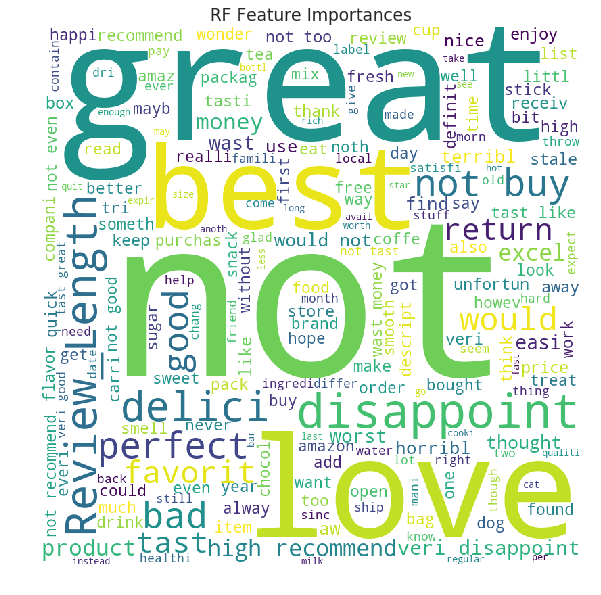

In [13]:
plt.figure(figsize=(8,8))
plt.imshow(wc_output)
plt.axis('off')
plt.tight_layout(pad=0.0)
plt.title('RF Feature Importances')
plt.show()

## Observation

%%HTML
<ul>
<li> best hyper param identified is max_depth = 50, and n_estimators=500 </li>
<li> Review length is identified as one of the important feature </li>
<li> Positive words such as 'great', 'best' & negative words such as 'disappoint', 'not buy'
     are recognized as important features by random forest </li>
</ul>

### [A.3] Applying Random Forests on TFIDF,<font color='red'> SET 2</font>

In [14]:
# form two lists
depth_list = [3, 5, 10, 20, 50] # depends on size of dataset
n_estimators_list = [20, 60, 120, 300, 500] # depends on size of dataset

# create a configuartion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF/train_bigram_tfidf.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF/test_bigram_tfidf.csv',
    'train_size' : 50000,
    'test_size' : 20000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'rf' # 'xgb' or 'rf'
}

Train df shape (50000, 503)
Class label distribution in train df:
 0    25029
1    24971
Name: Label, dtype: int64
Test df shape (20000, 503)
Class label distribution in test df:
 1    16520
0     3480
Name: Label, dtype: int64
Shape of ->  train features :50000,501, test features: 20000,501
Shape of -> train labels :50000, test labels: 20000


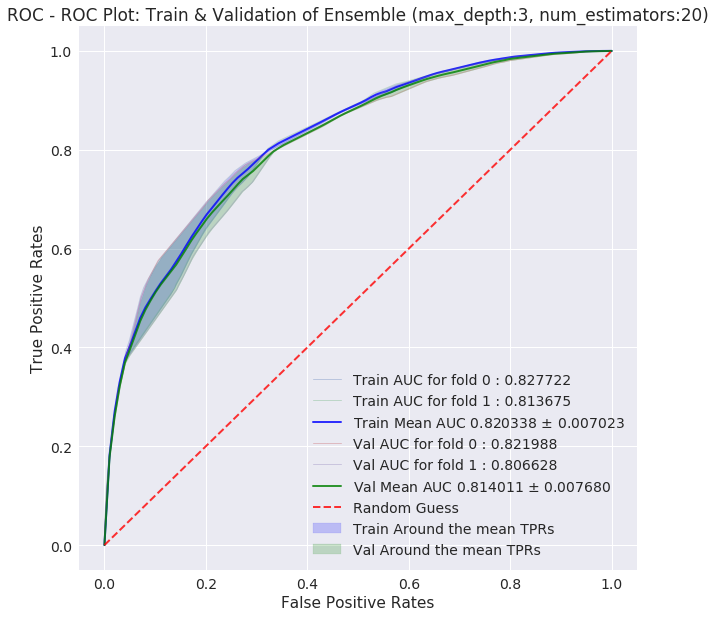

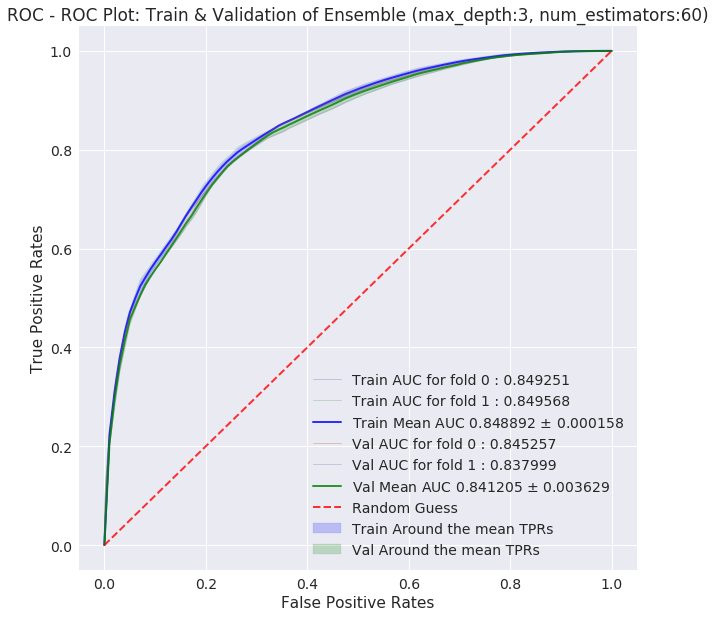

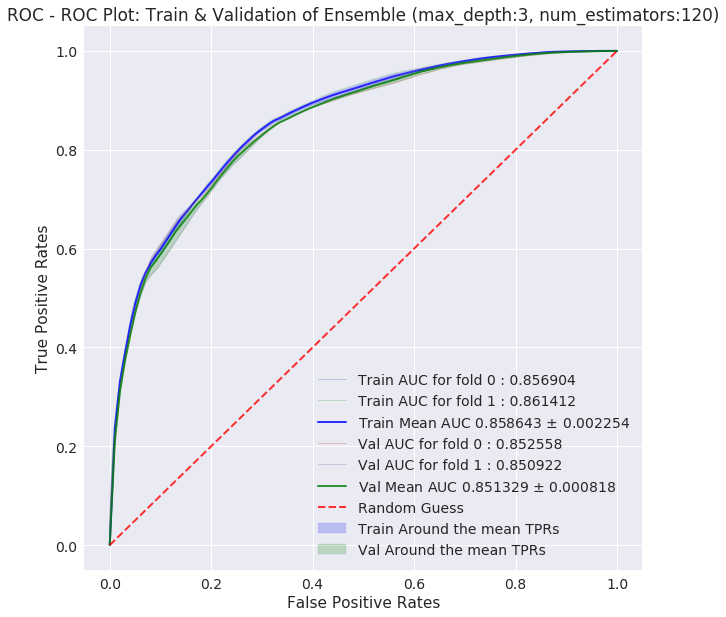

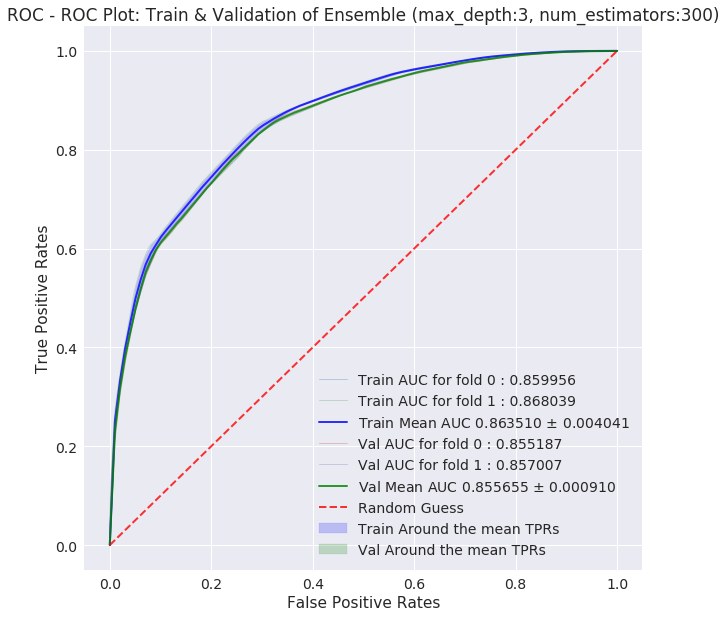

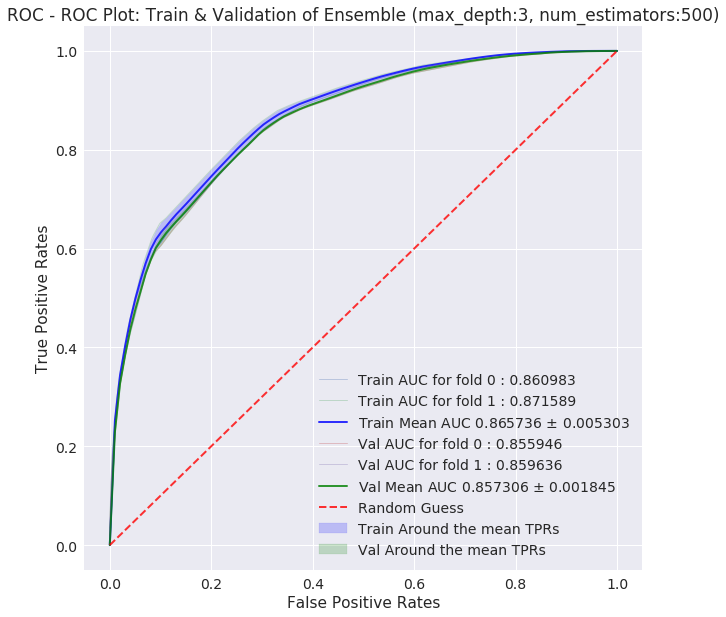

...

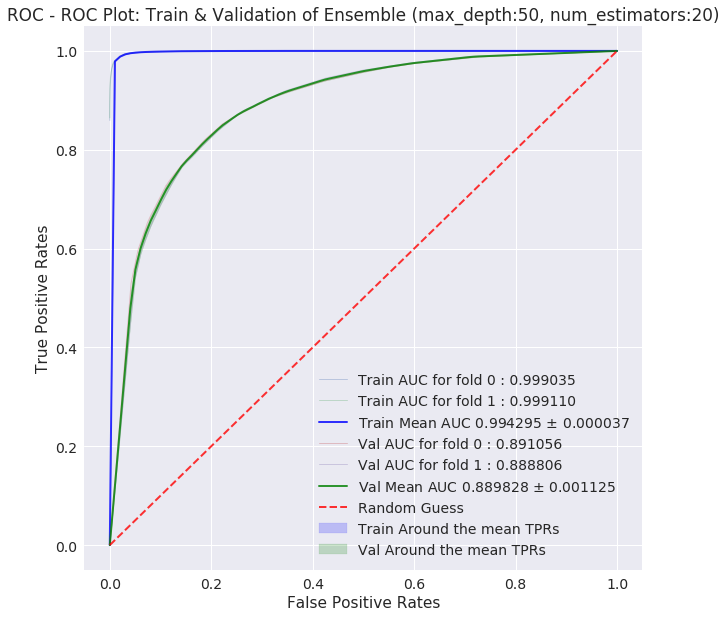

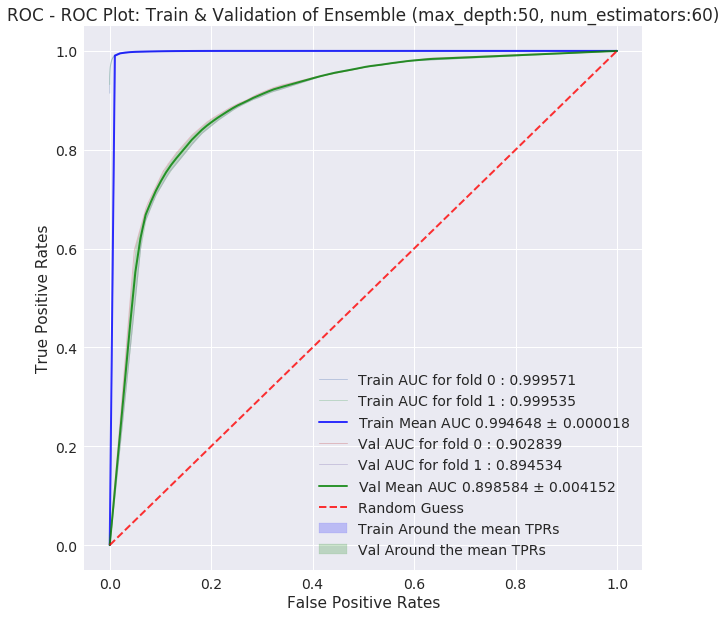

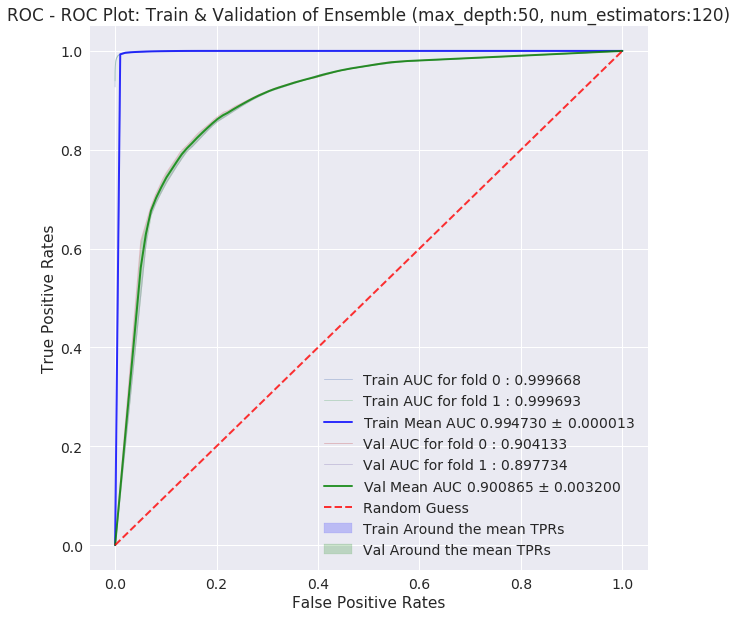

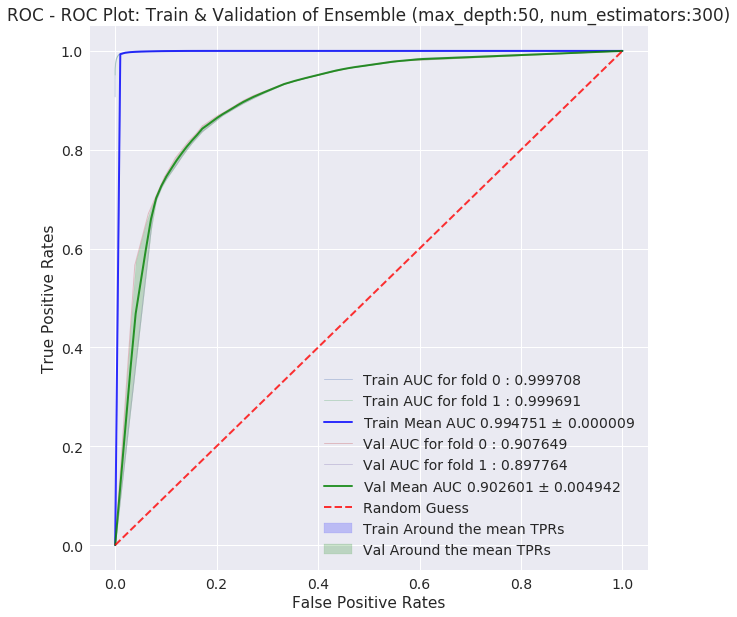

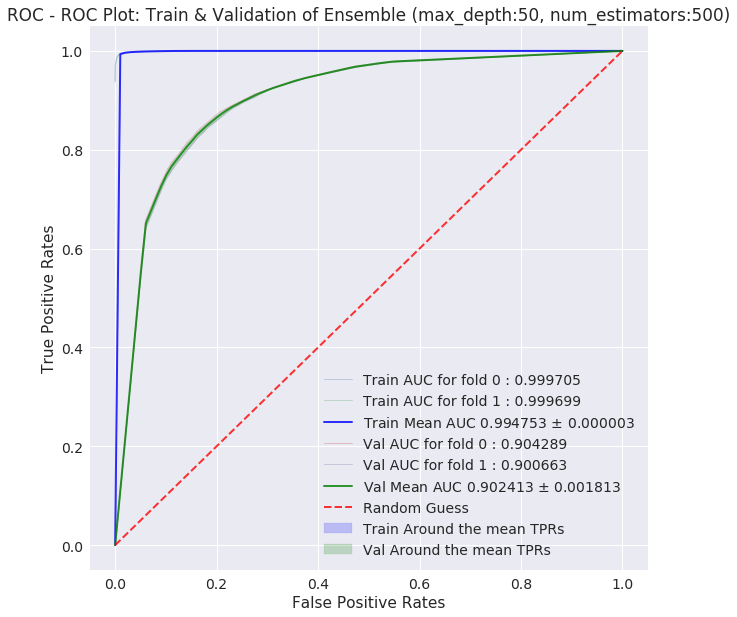

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


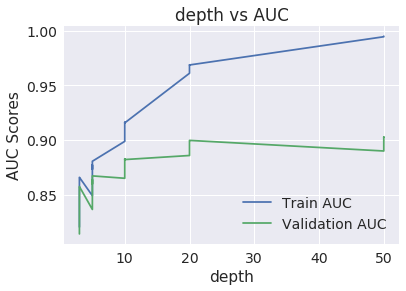

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


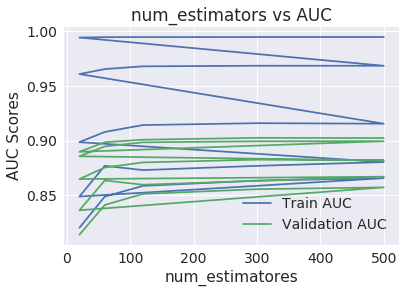

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


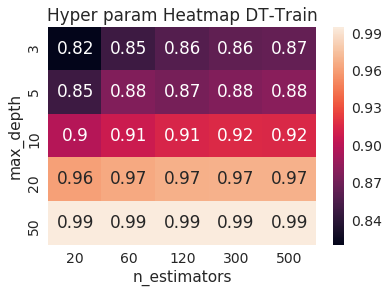

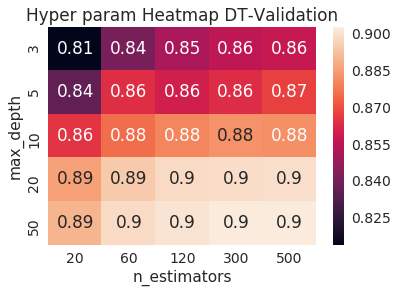

Best hyperparam value:  (50, 300)


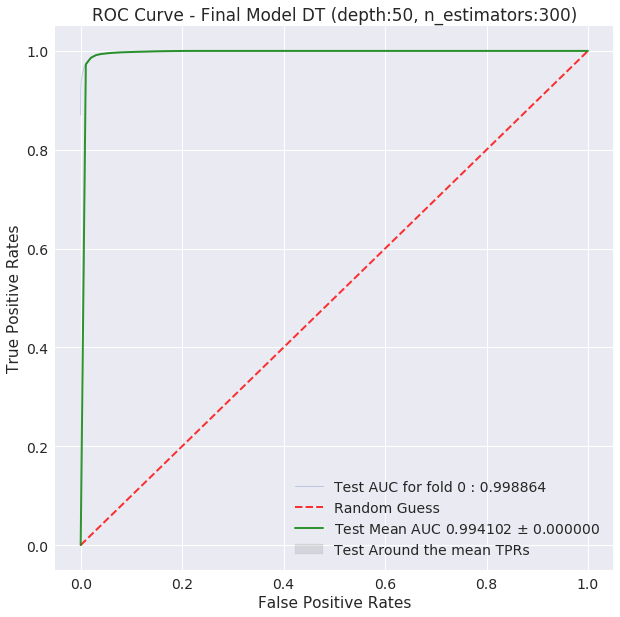

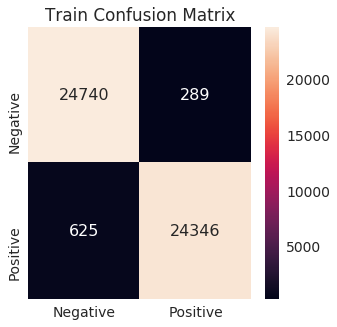

               Negative      Positive
Precision      0.975360      0.988269
Recall         0.988453      0.974971
Fscore         0.981863      0.981575
Support    25029.000000  24971.000000


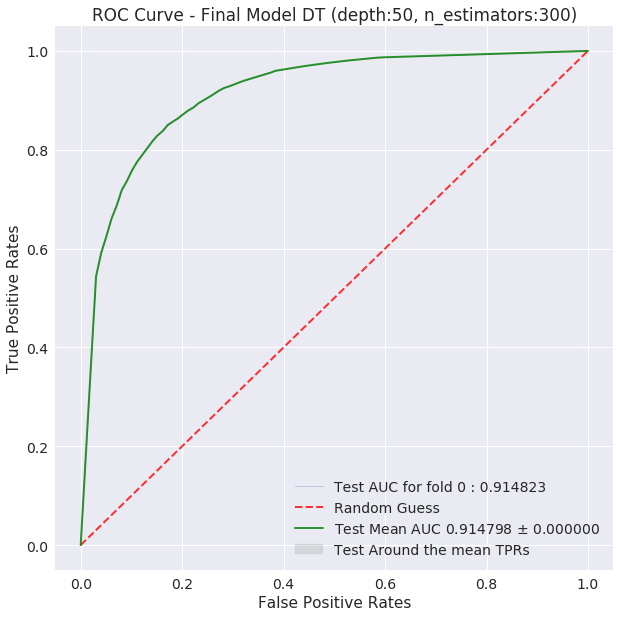

Test auc score  0.9147983054415931


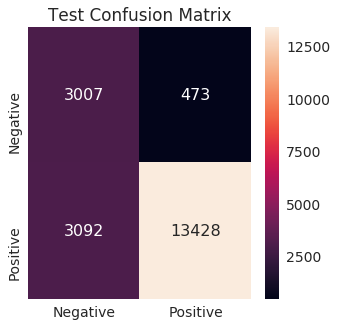

              Negative      Positive
Precision     0.493032      0.965974
Recall        0.864080      0.812833
Fscore        0.627832      0.882811
Support    3480.000000  16520.000000
Results Summary: 
 [('Hyper Param', (50, 300)), ('AUC', '0.9148'), ('f-score(-ve)', '62.7832'), ('f-score(+ve)', '88.2811')]


In [15]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# create a list containing all the features
feature_name_list = train_features.columns.values.tolist()

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_a2 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

### [A.4] Wordcloud of top 20 important features from<font color='red'> SET 2</font>

In [16]:
# get feature and its importance as tuple
feature_imp_info = list(zip(feature_name_list, model[0].feature_importances_))

# filter only those features which have a value greater than zero
feature_imp_dict = dict(list(filter(lambda x: x[1] > 0.0, feature_imp_info)))

# create word cloud object for displaying the output
wc = WordCloud(background_color='white', width=800, height=800)
wc_output = wc.generate_from_frequencies(feature_imp_dict)

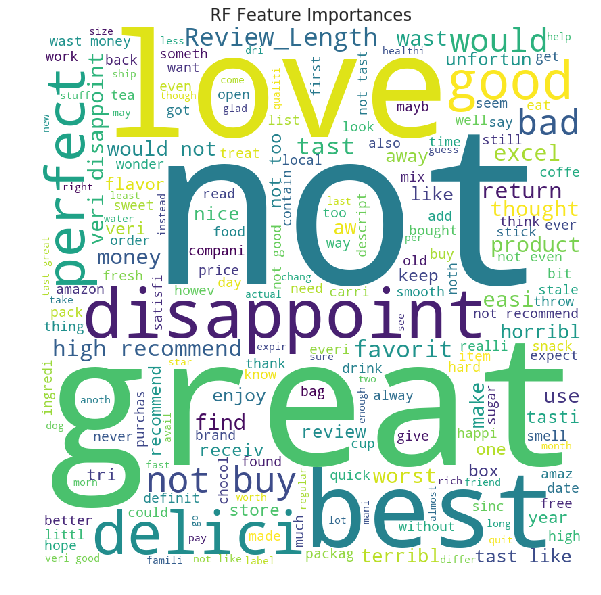

In [17]:
plt.figure(figsize=(8,8))
plt.imshow(wc_output)
plt.axis('off')
plt.tight_layout(pad=0.0)
plt.title('RF Feature Importances')
plt.show()

## Observation

%%HTML
<ul>
<li> best hyper param identified is max_depth = 50, and n_estimators=300 </li>
<li> Review length is identified as one of the important feature </li>
<li> Positive words such as 'great', 'best' & negative words such as 'disappoint', 'bad'
     are recognized as important features by random forest </li>
</ul>

### [A.5] Applying Random Forests on AVG W2V,<font color='red'> SET 3</font>

In [18]:
# form two lists
depth_list = [3, 5, 10, 20, 50] # depends on size of dataset
n_estimators_list = [20, 60, 120, 300, 500] # depends on size of dataset

# create a configuartion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/AVG_W2V/train_avg_w2v.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/AVG_W2V/test_avg_w2v.csv',
    'train_size' : 50000,
    'test_size' : 20000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'rf' # 'xgb' or 'rf'
}

Train df shape (50000, 52)
Class label distribution in train df:
 0    25029
1    24971
Name: Label, dtype: int64
Test df shape (20000, 52)
Class label distribution in test df:
 1    16520
0     3480
Name: Label, dtype: int64
Shape of ->  train features :50000,50, test features: 20000,50
Shape of -> train labels :50000, test labels: 20000


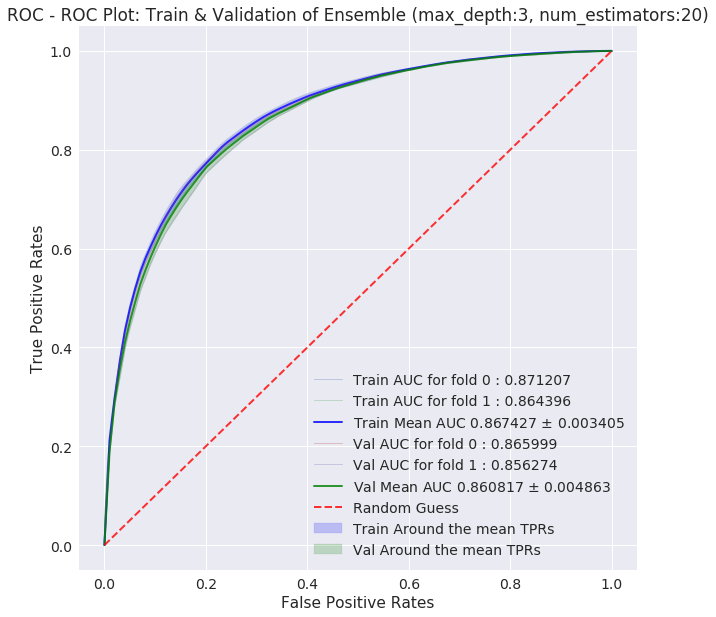

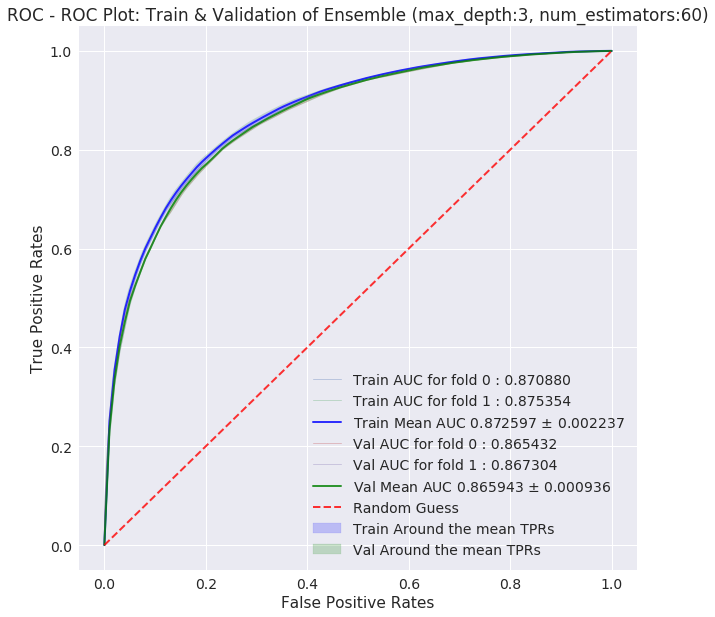

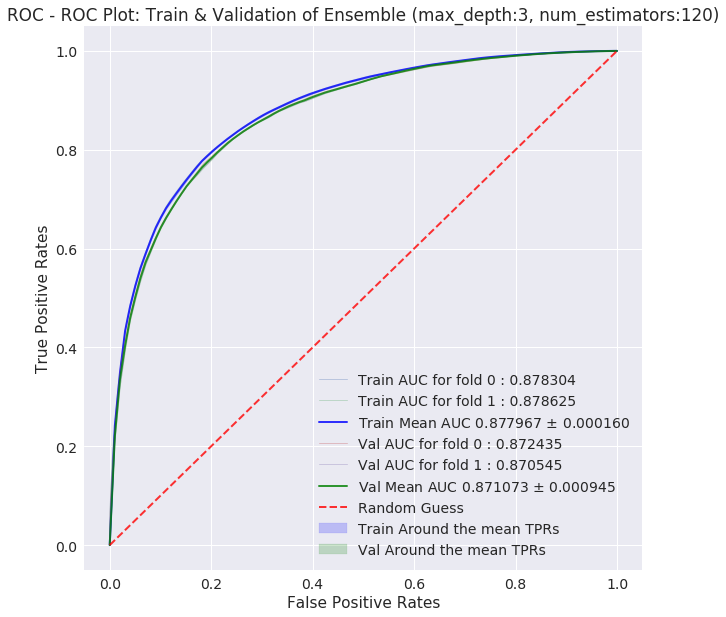

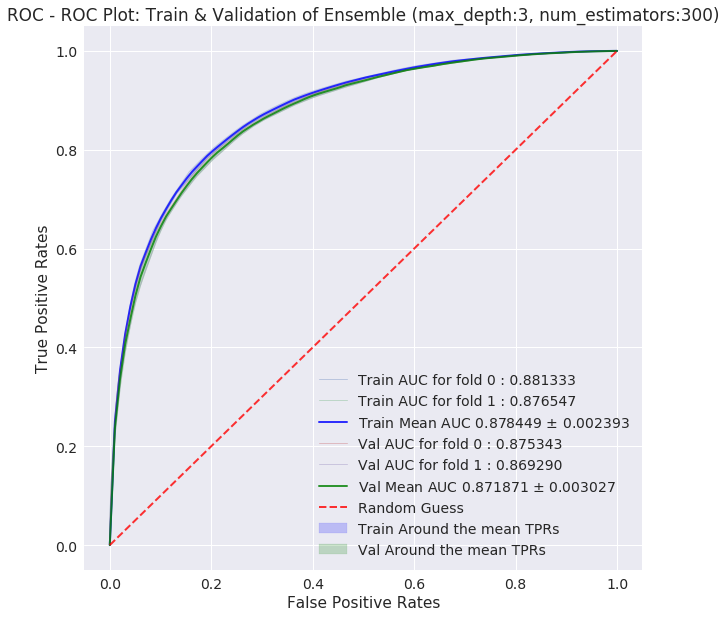

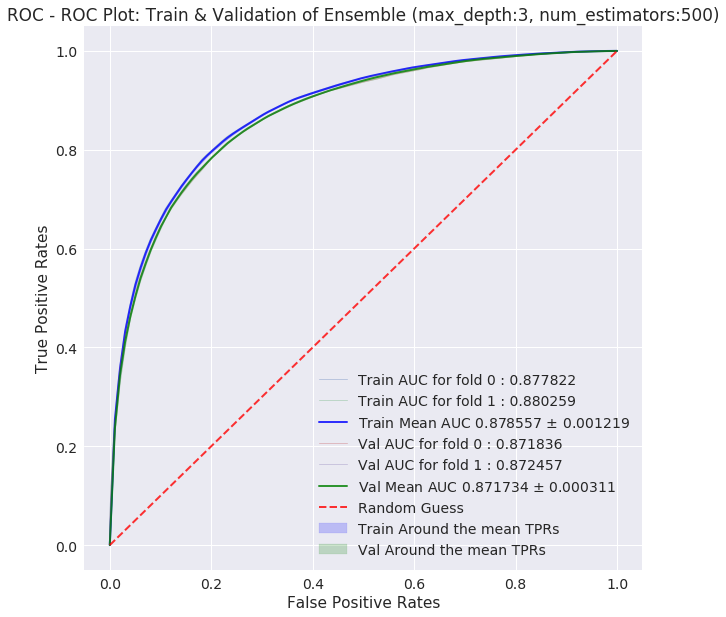

...

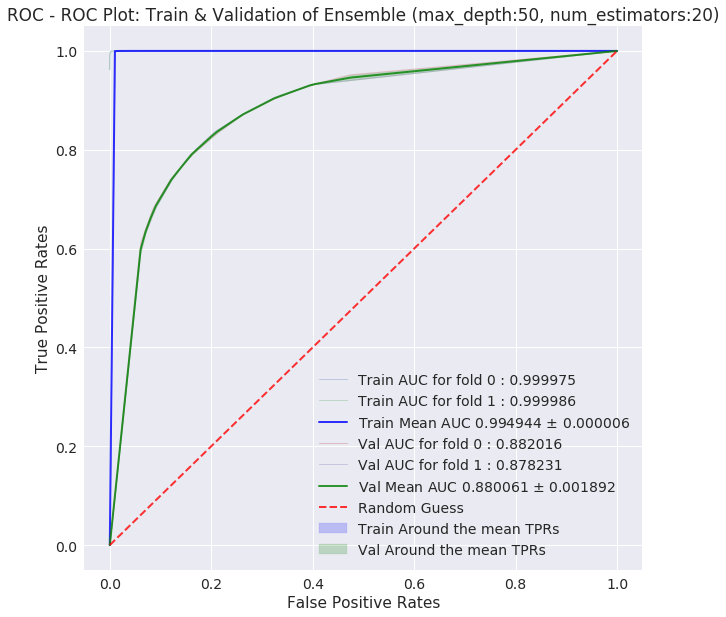

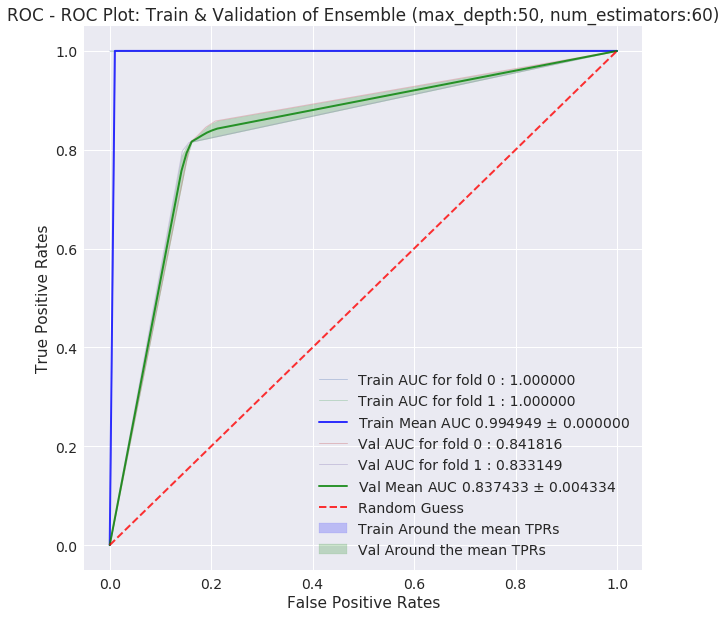

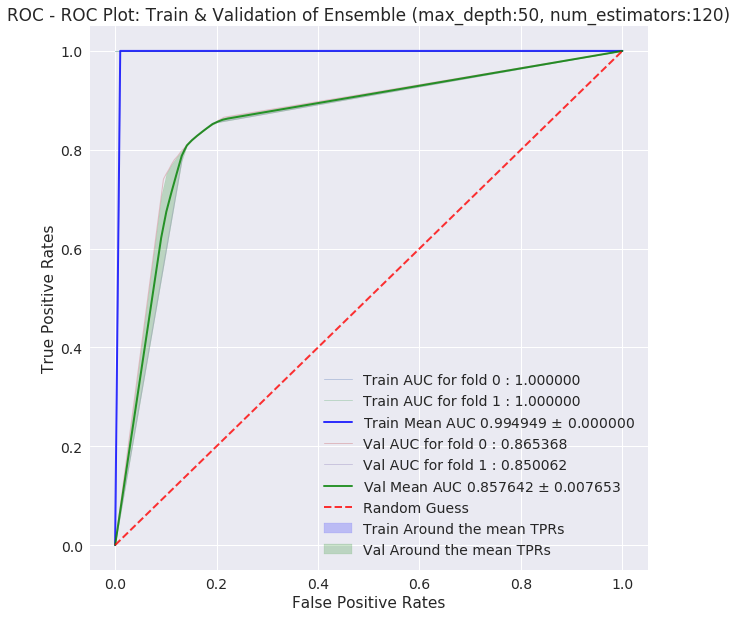

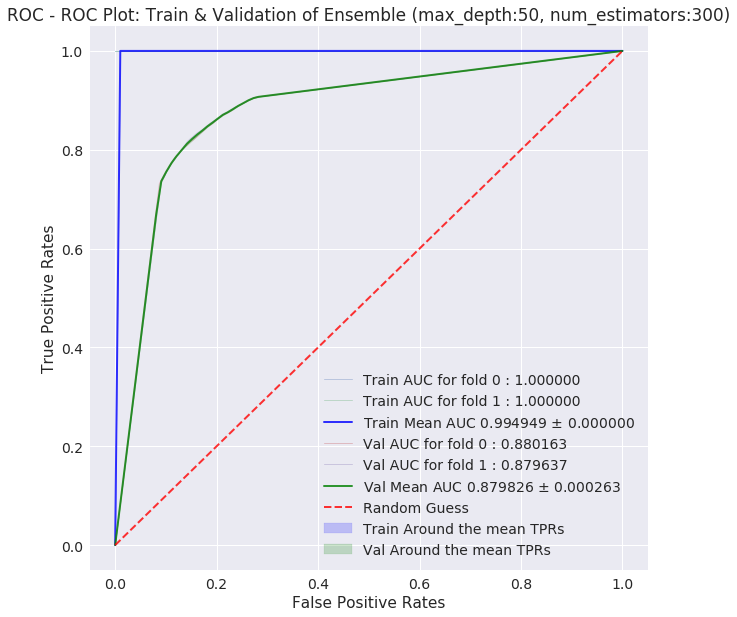

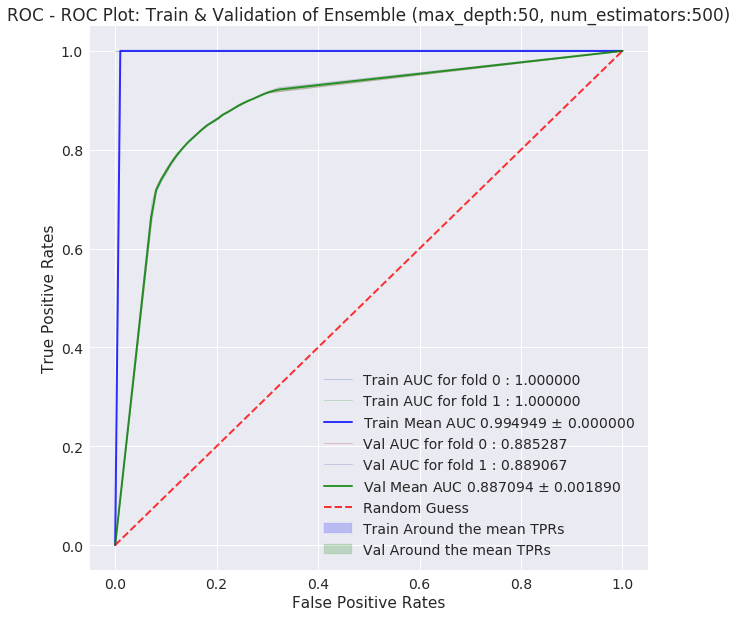

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


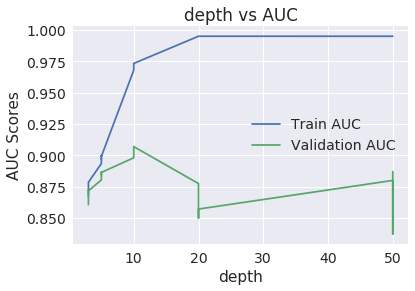

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


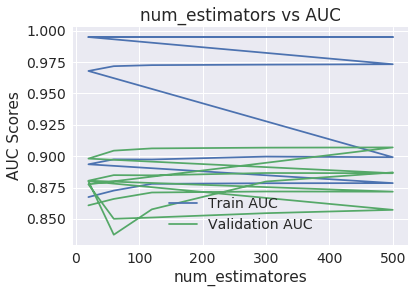

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


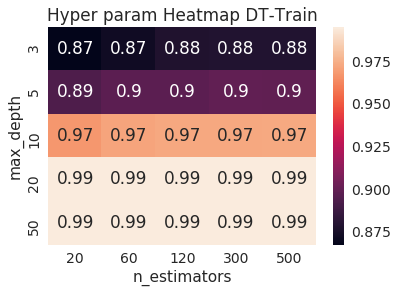

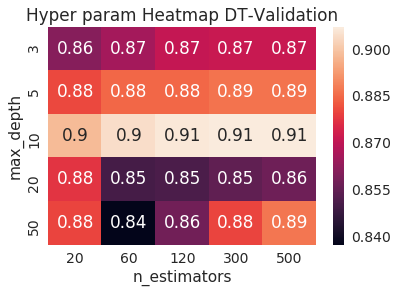

Best hyperparam value:  (10, 500)


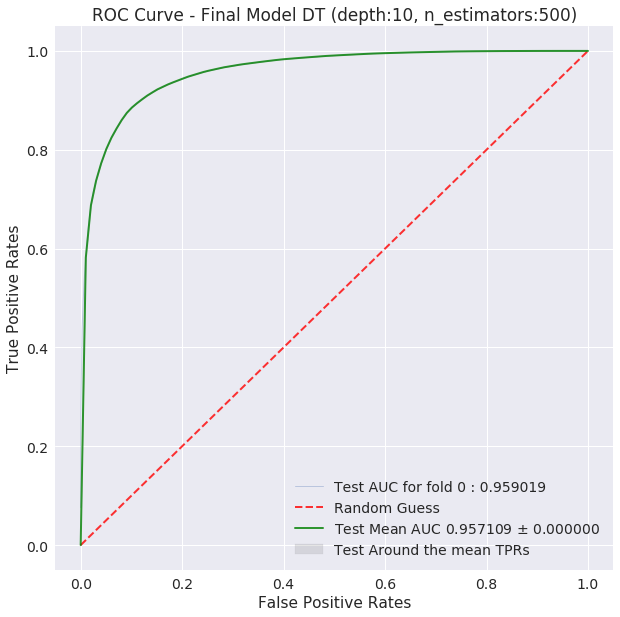

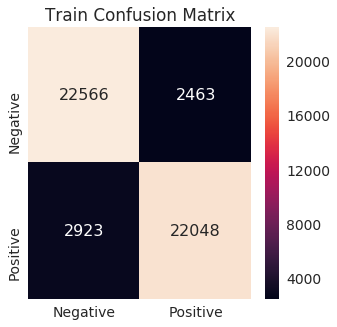

               Negative      Positive
Precision      0.885323      0.899515
Recall         0.901594      0.882944
Fscore         0.893385      0.891152
Support    25029.000000  24971.000000


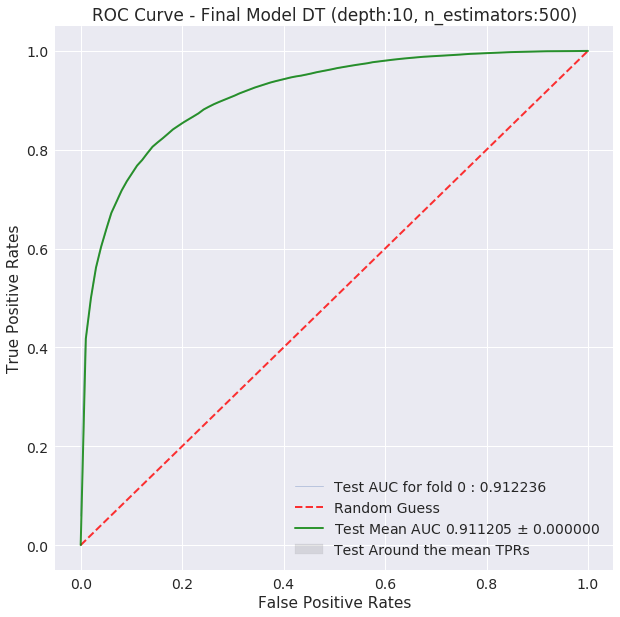

Test auc score  0.9112048229359623


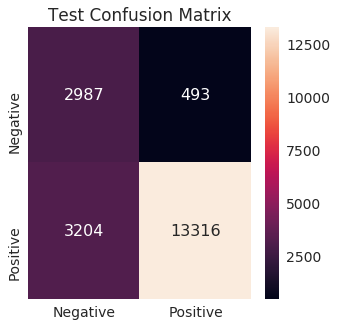

              Negative      Positive
Precision     0.482475      0.964299
Recall        0.858333      0.806053
Fscore        0.617723      0.878103
Support    3480.000000  16520.000000
Results Summary: 
 [('Hyper Param', (10, 500)), ('AUC', '0.9112'), ('f-score(-ve)', '61.7723'), ('f-score(+ve)', '87.8103')]


In [19]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_a3 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

%%HTML
<ul>
<li> best hyper param identified is max_depth = 10, and n_estimators=500 </li>
</ul>

### [A.6] Applying Random Forests on TFIDF W2V,<font color='red'> SET 4</font>

In [20]:
# form two lists
depth_list = [3, 5, 10, 20, 50] # depends on size of dataset
n_estimators_list = [20, 60, 120, 300, 500] # depends on size of dataset

# create a configuarion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF_W2V/train_tf_w2v.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF_W2V/test_tf_w2v.csv',
    'train_size' : 50000,
    'test_size' : 20000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'rf' # 'xgb' or 'rf'
}

Train df shape (50000, 52)
Class label distribution in train df:
 0    25029
1    24971
Name: Label, dtype: int64
Test df shape (20000, 52)
Class label distribution in test df:
 1    16520
0     3480
Name: Label, dtype: int64
Shape of ->  train features :50000,50, test features: 20000,50
Shape of -> train labels :50000, test labels: 20000


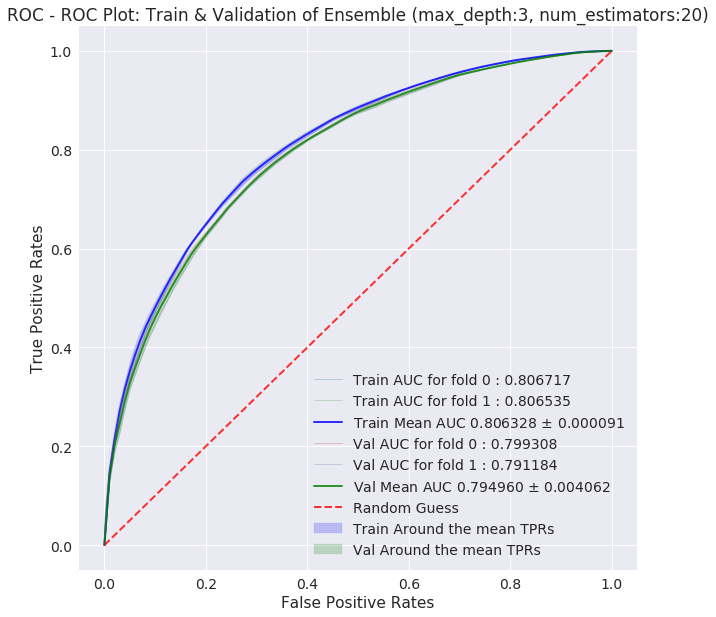

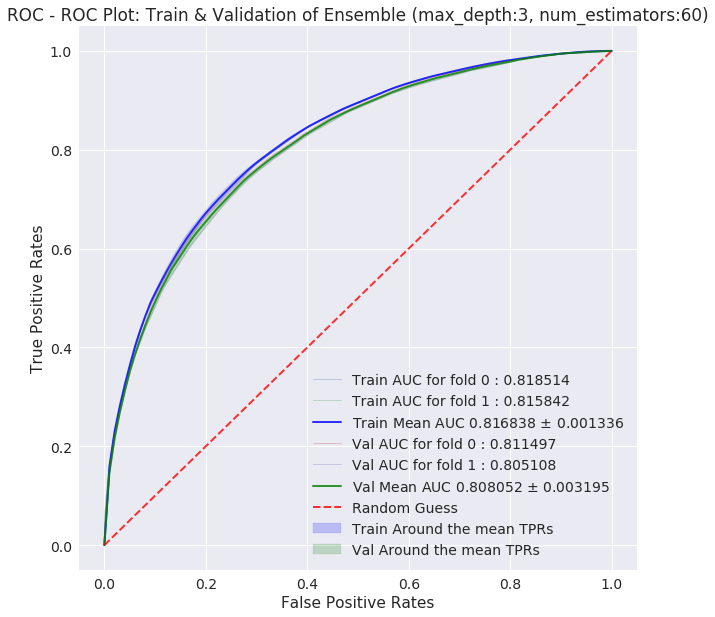

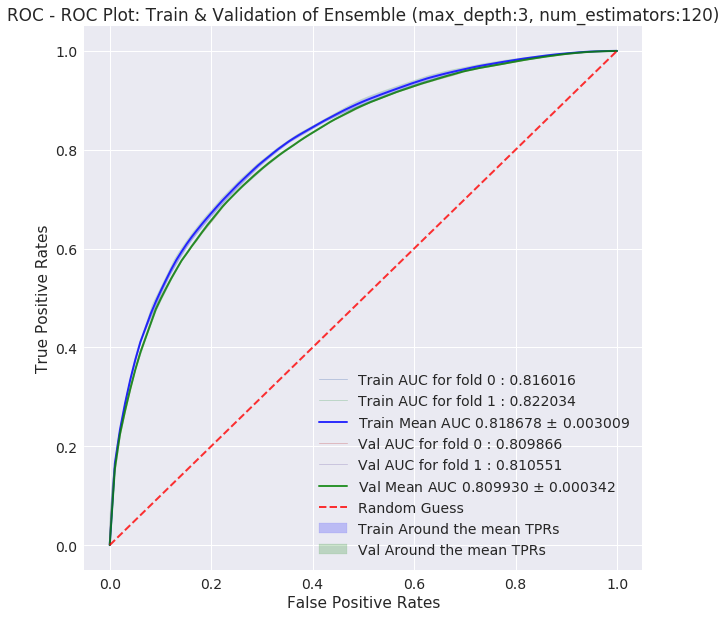

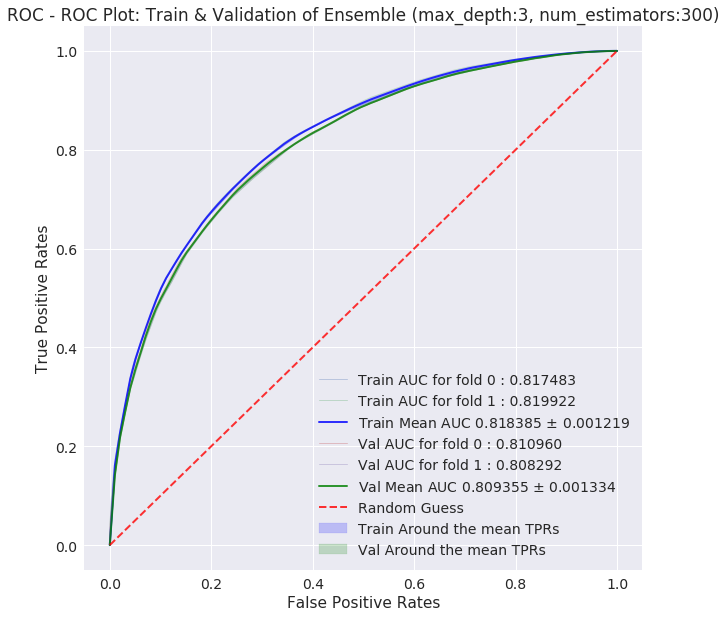

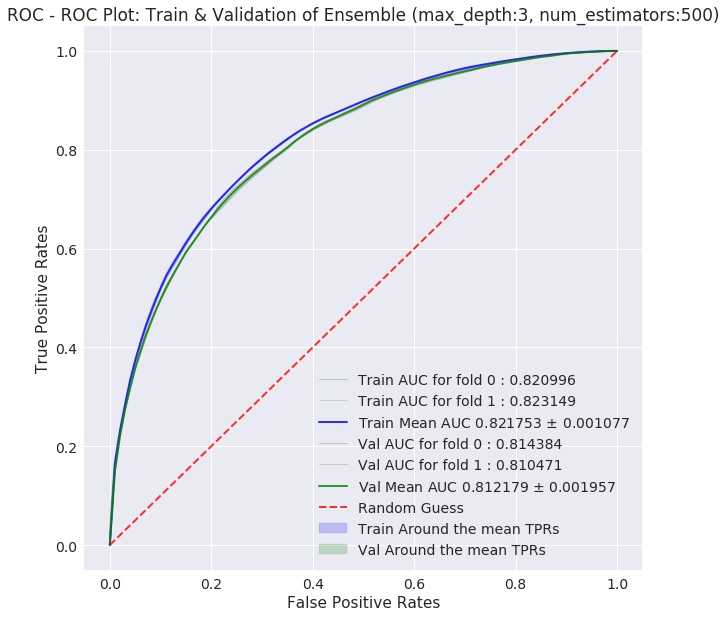

...

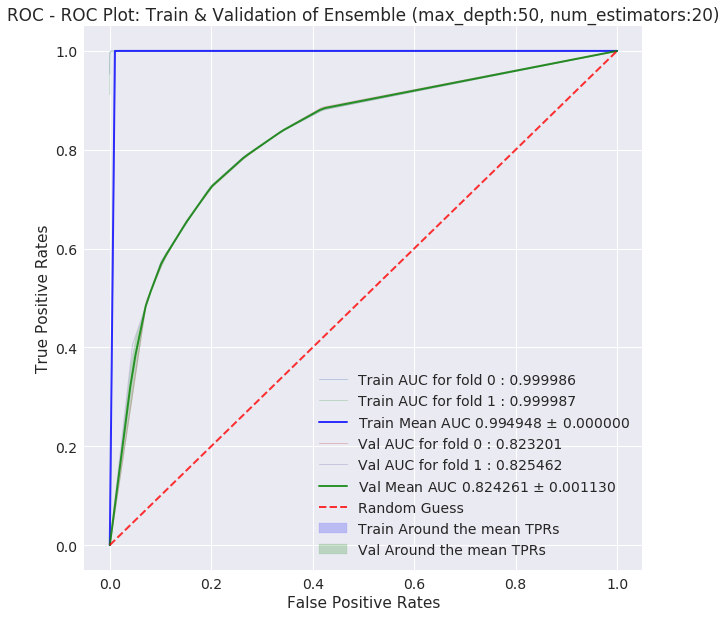

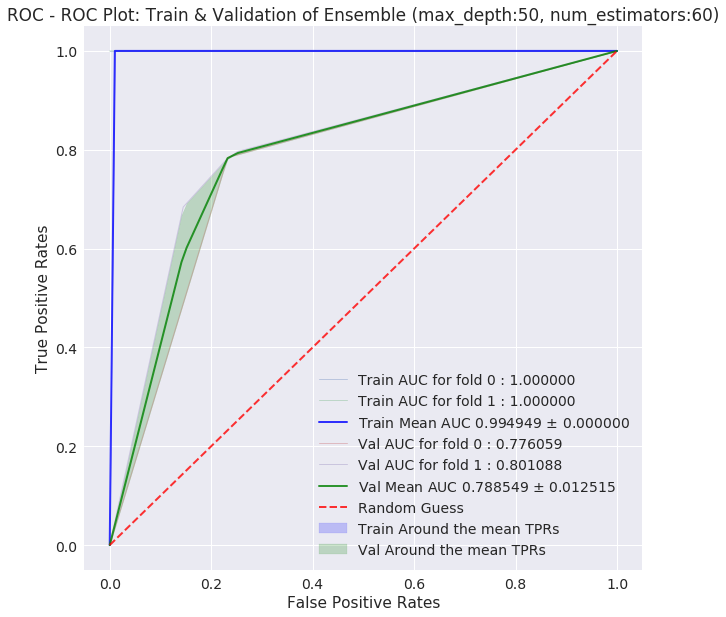

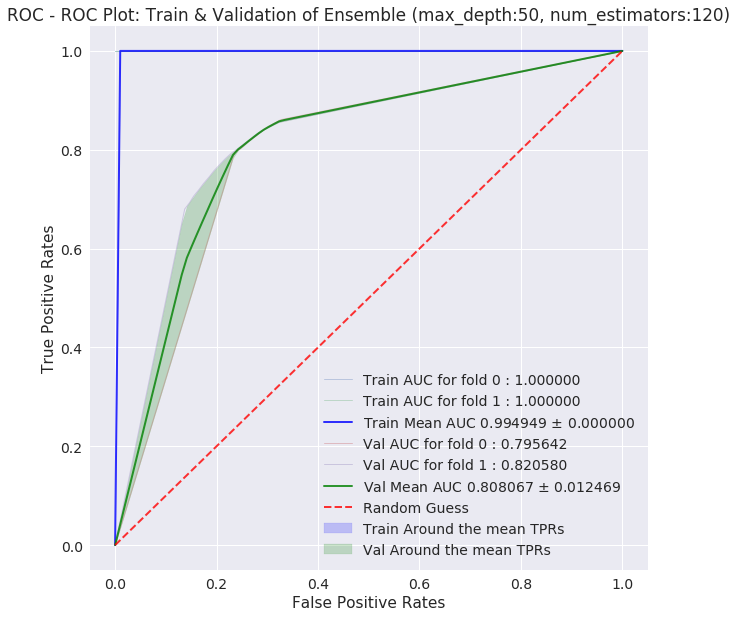

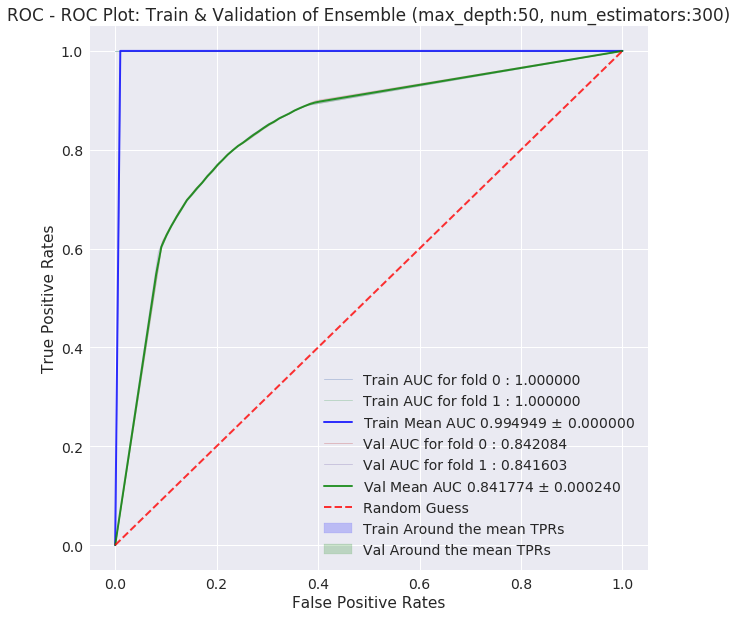

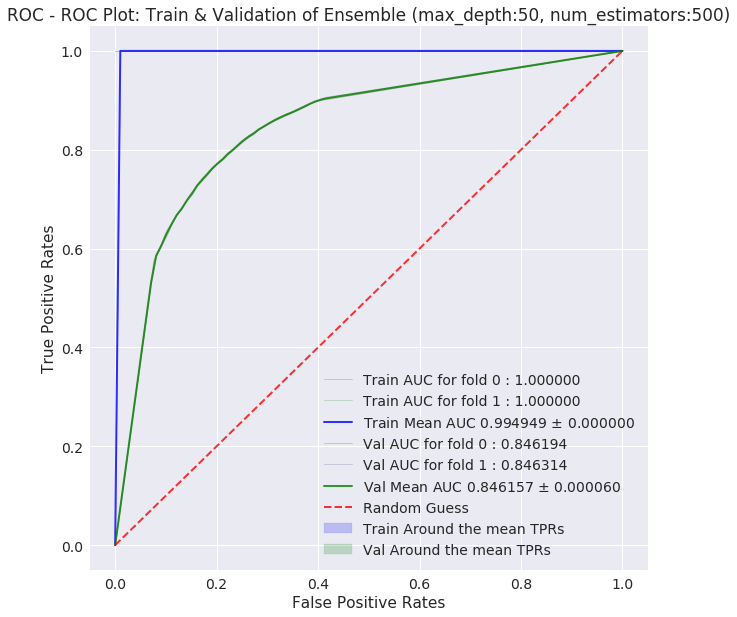

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


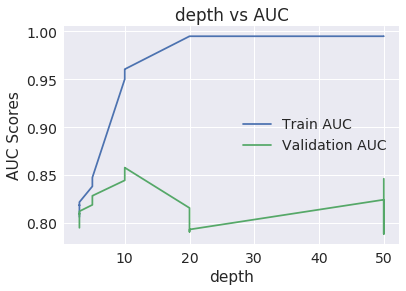

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


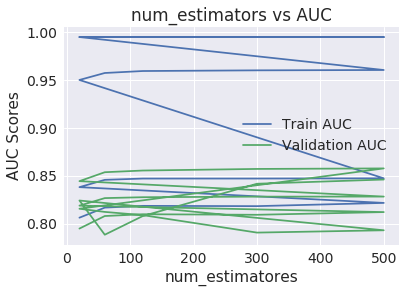

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


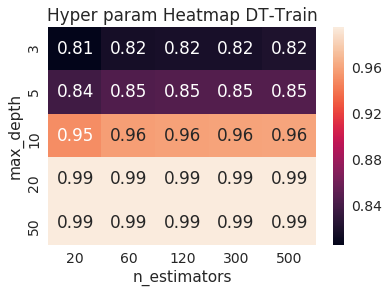

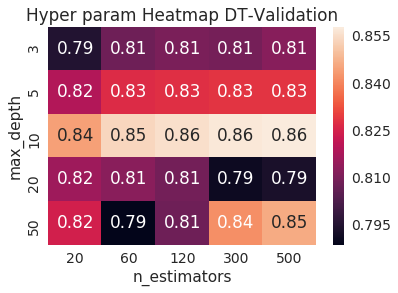

Best hyperparam value:  (10, 500)


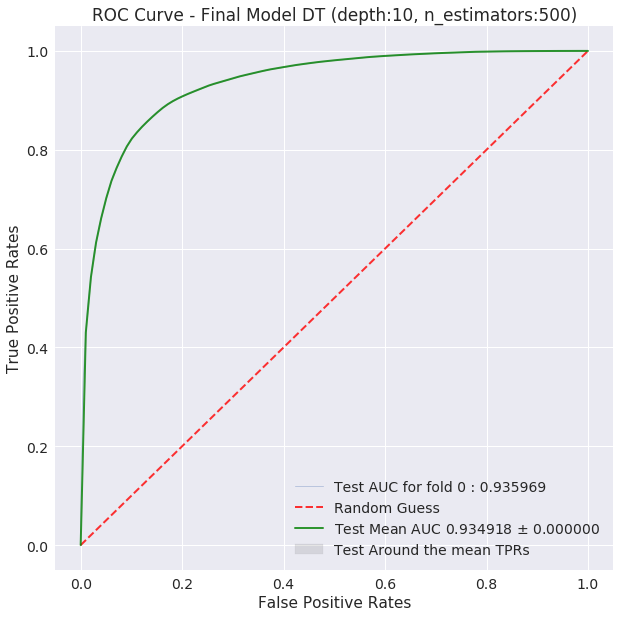

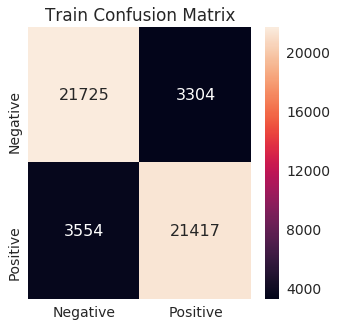

               Negative      Positive
Precision      0.859409      0.866348
Recall         0.867993      0.857675
Fscore         0.863680      0.861990
Support    25029.000000  24971.000000


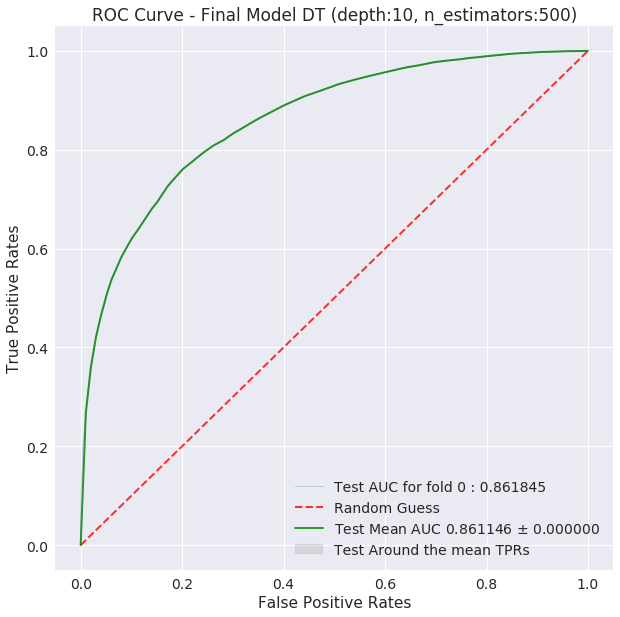

Test auc score  0.8611460084466451


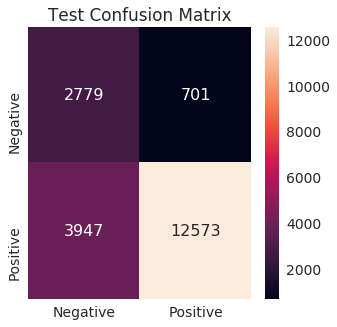

              Negative      Positive
Precision     0.413173      0.947190
Recall        0.798563      0.761077
Fscore        0.544582      0.843995
Support    3480.000000  16520.000000
Results Summary: 
 [('Hyper Param', (10, 500)), ('AUC', '0.8611'), ('f-score(-ve)', '54.4582'), ('f-score(+ve)', '84.3995')]


In [21]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_a4 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

%%HTML
<ul>
<li> best hyper param identified is max_depth = 10, and n_estimators=500 </li>
</ul>

## [B] Applying GBDT using XGBOOST

In [22]:
# In this work, Hyper parameter tuning is done only on the max_depth and n_estimators parameters. The reson for
# restricting to two are, adding more parameters will increase the training time exponentially for 
# large dataset size. The other parameter values are left to its default values.

### [B.1] Applying XGBOOST on BOW,<font color='red'> SET 1</font>

In [23]:
# form two lists
depth_list = [2, 5, 20, 50] # depends on size of dataset
n_estimators_list = [40, 70, 120, 200] # depends on size of dataset

# create a configuartion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/BOW/train_bow_bigram.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/BOW/test_bow_bigram.csv',
    'train_size' : 40000,
    'test_size' : 15000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'xgb' # 'xgb' or 'rf'
}

Train df shape (40000, 503)
Class label distribution in train df:
 0    20024
1    19976
Name: Label, dtype: int64
Test df shape (15000, 503)
Class label distribution in test df:
 1    12386
0     2614
Name: Label, dtype: int64
Shape of ->  train features :40000,501, test features: 15000,501
Shape of -> train labels :40000, test labels: 15000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

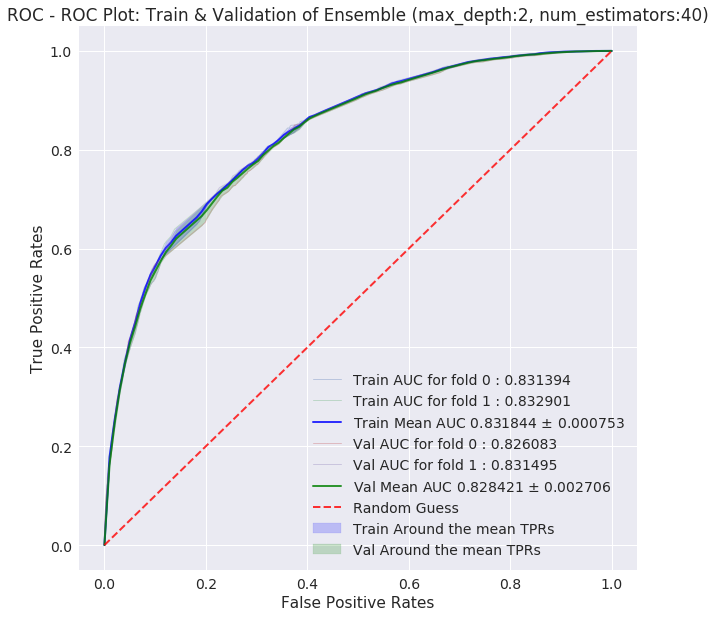

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

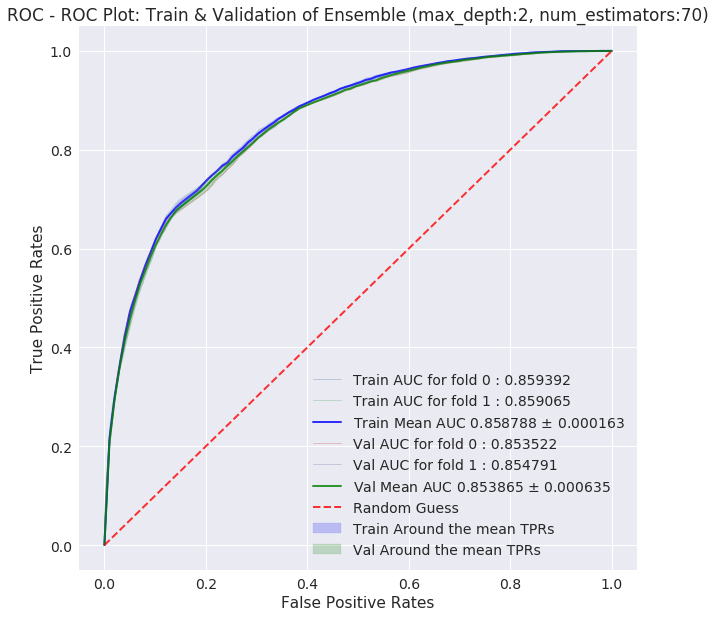

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

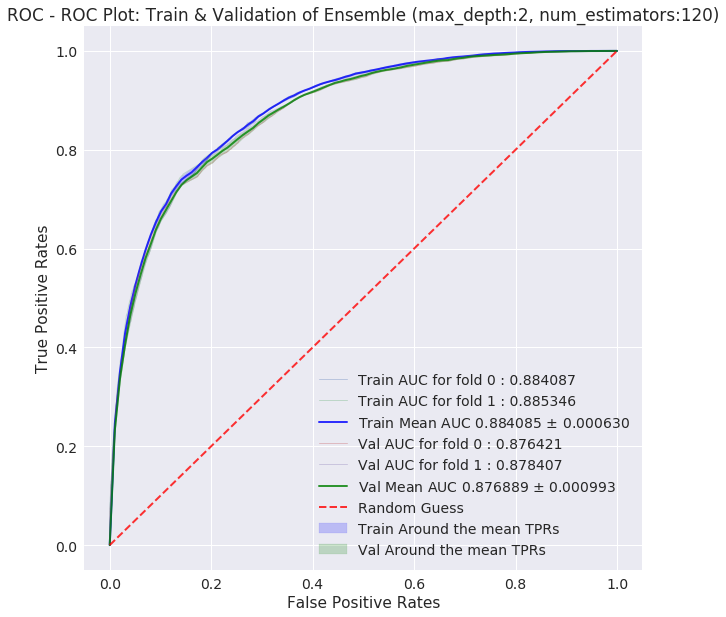

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

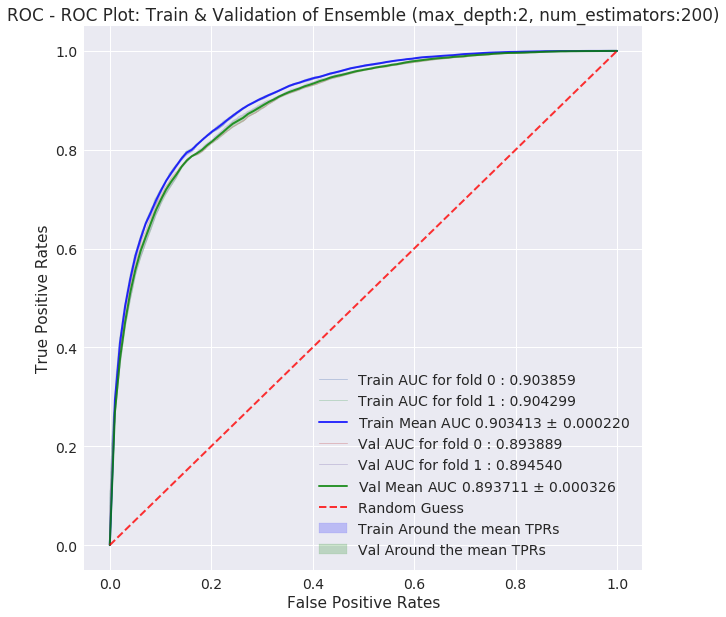

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

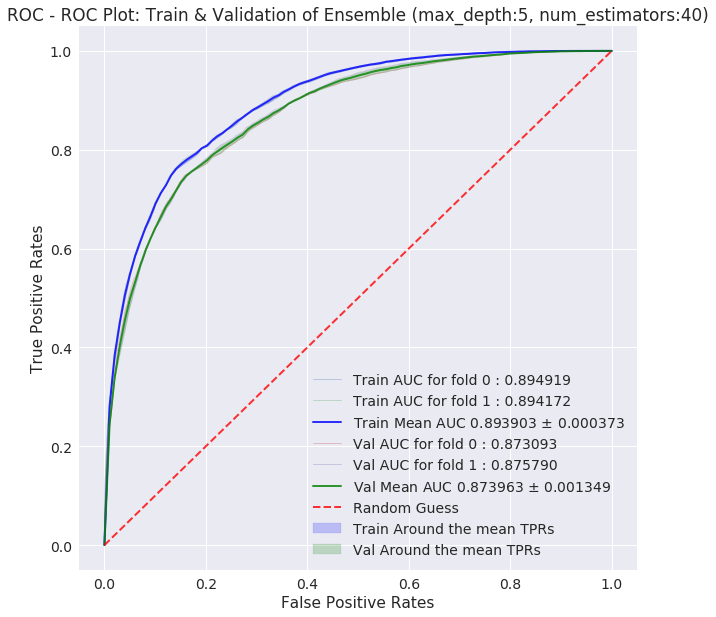

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

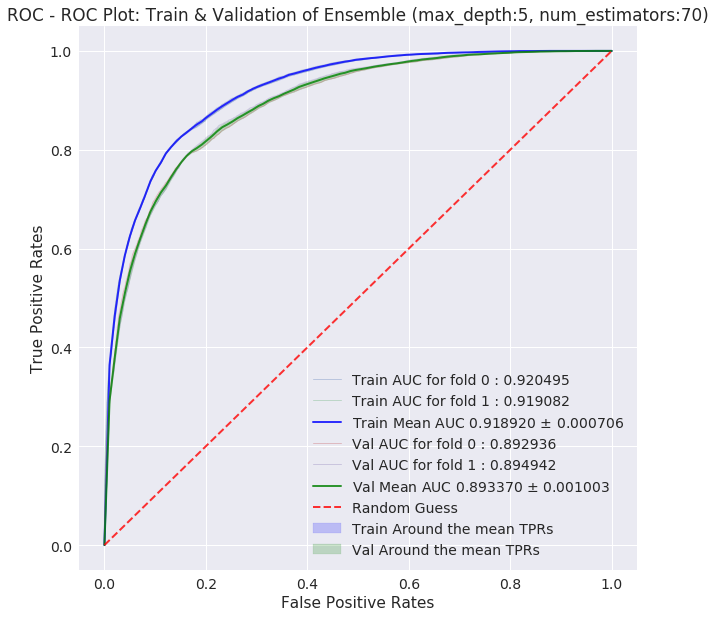

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

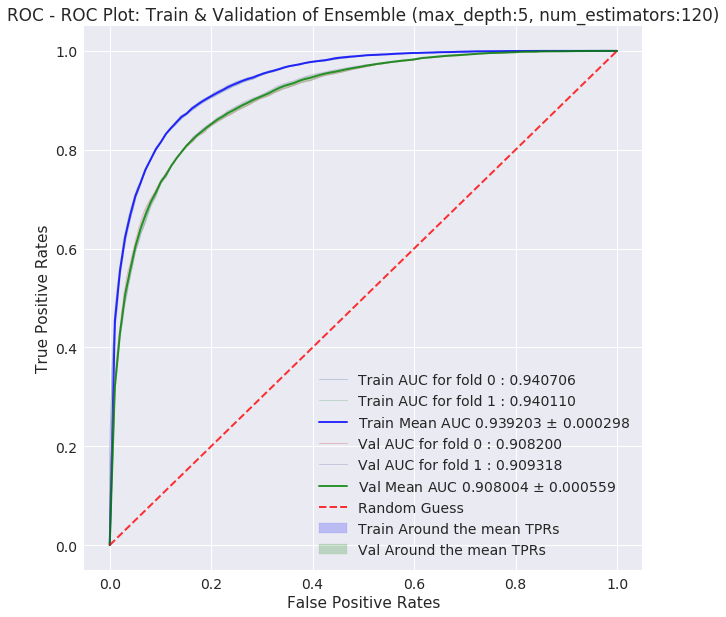

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

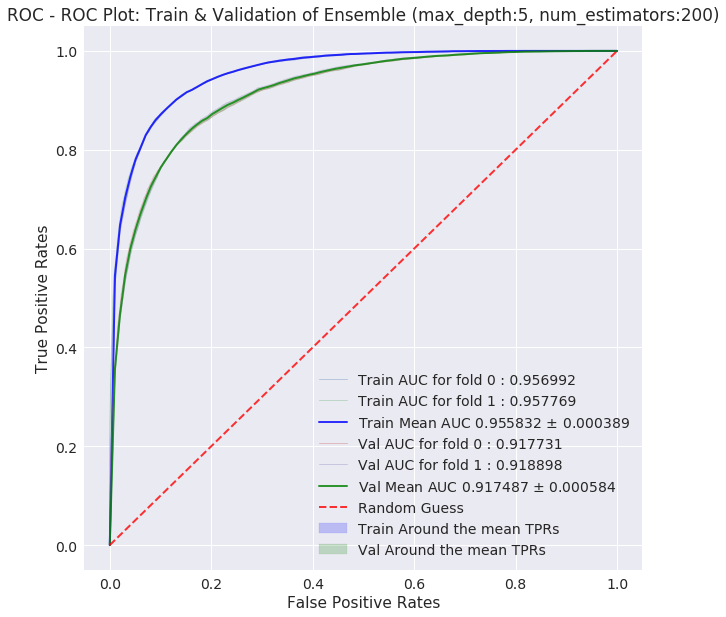

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

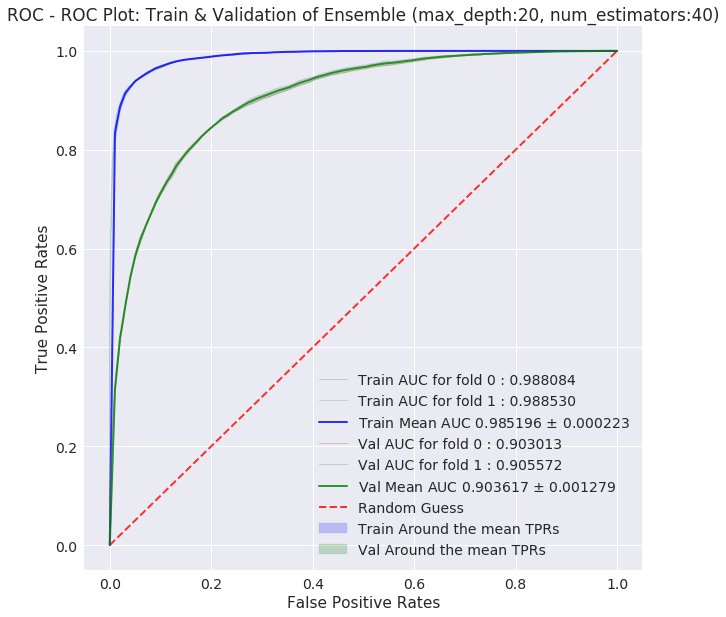

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

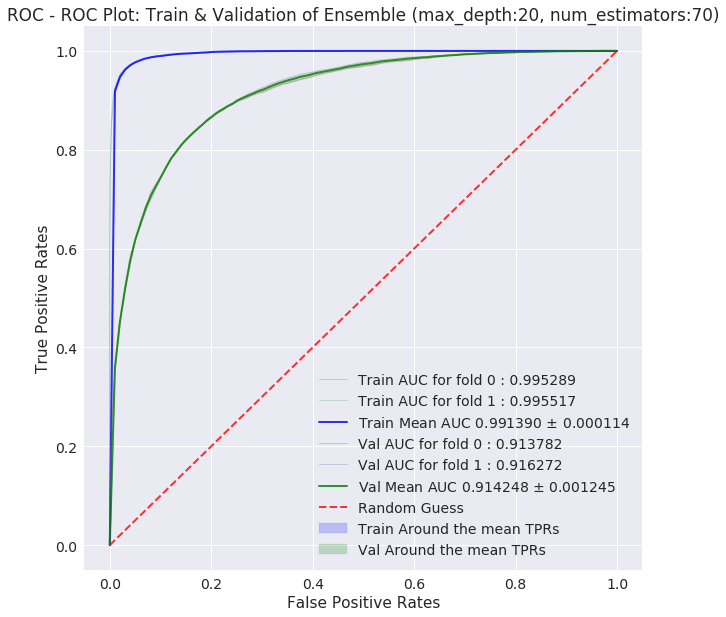

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

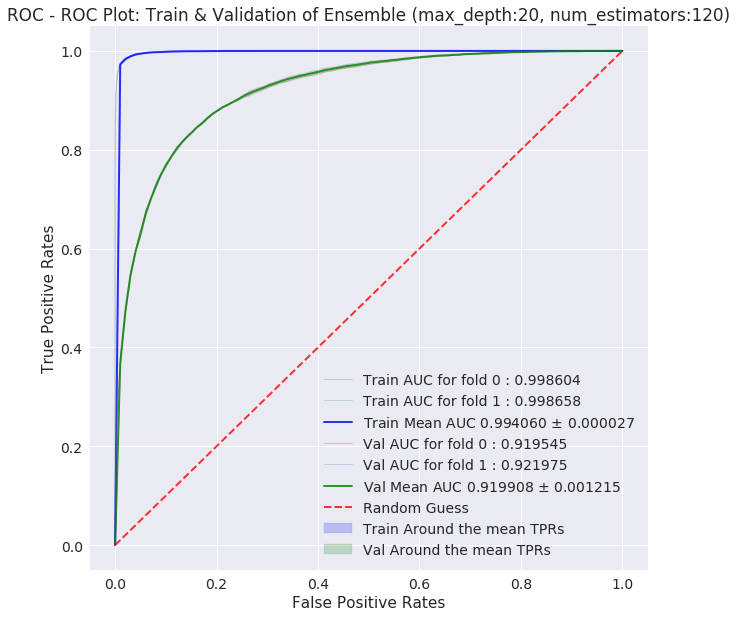

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

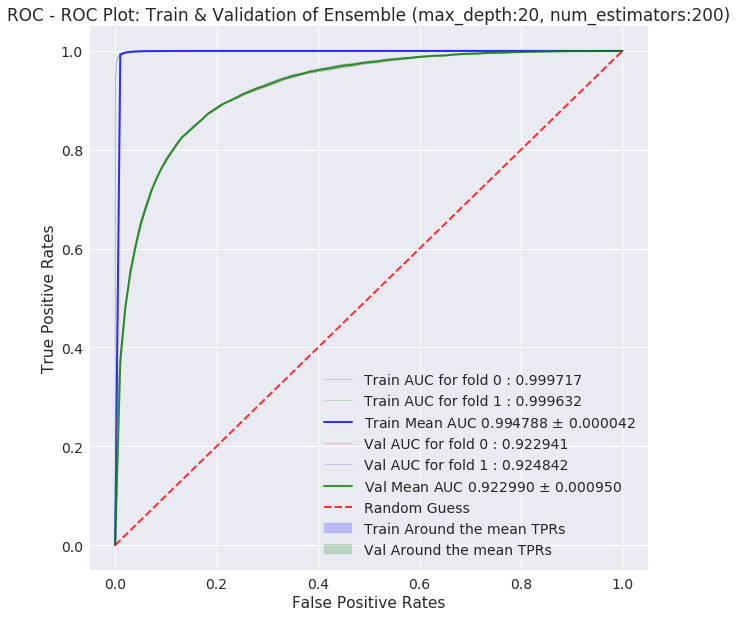

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

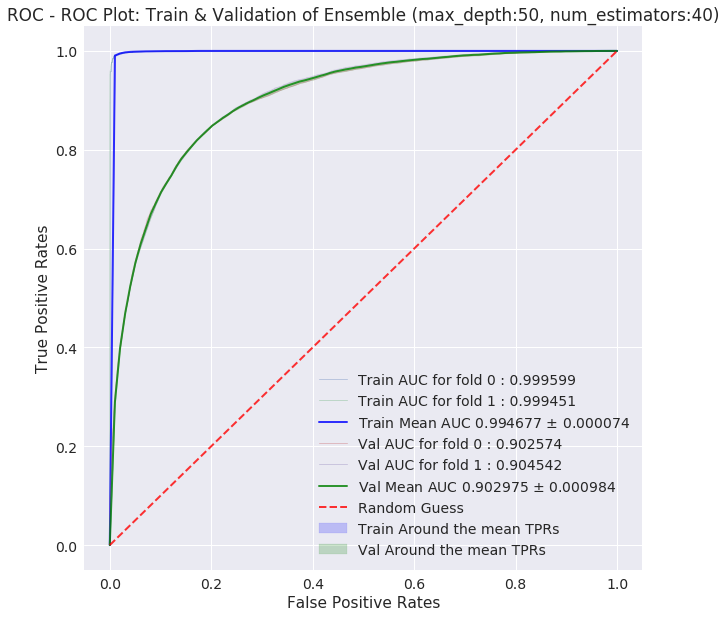

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

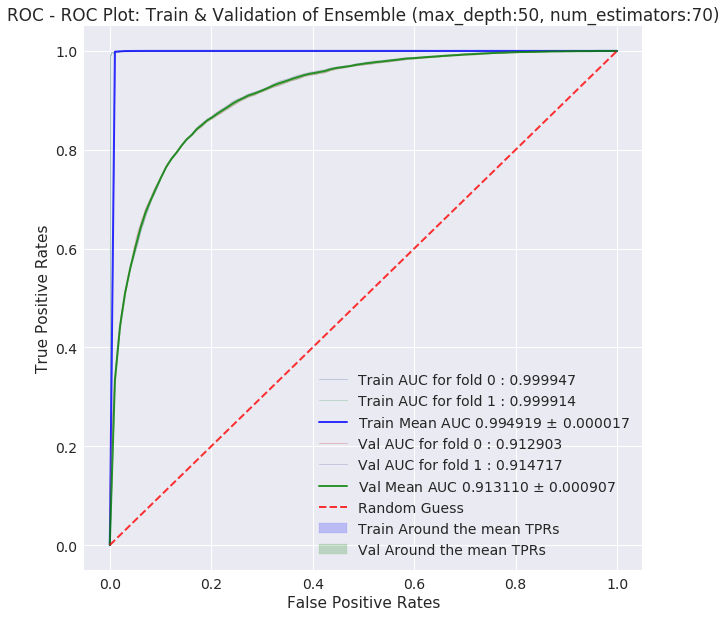

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

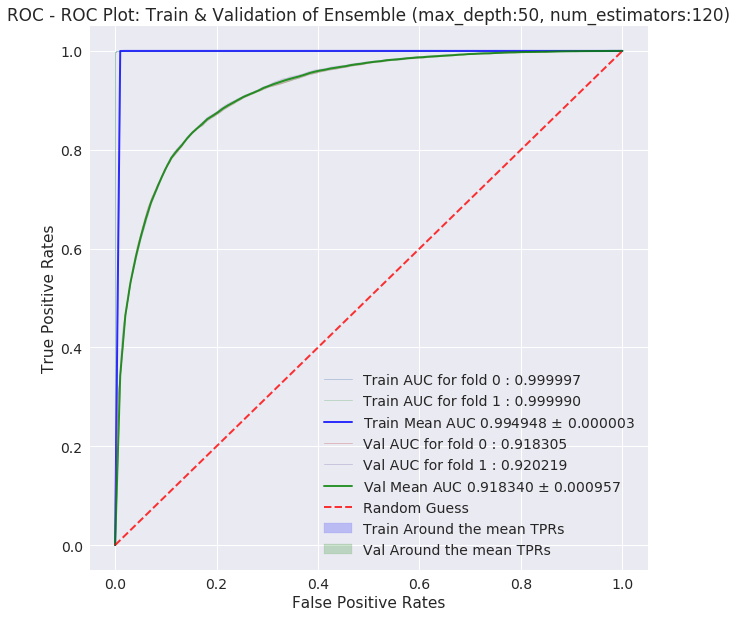

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

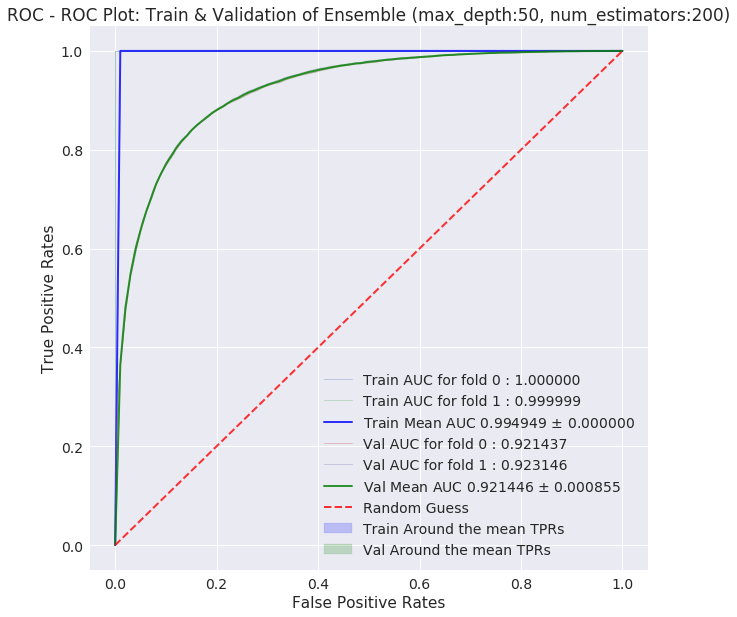

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


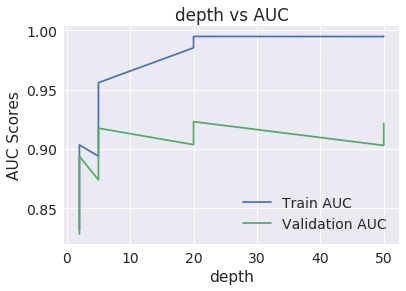

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


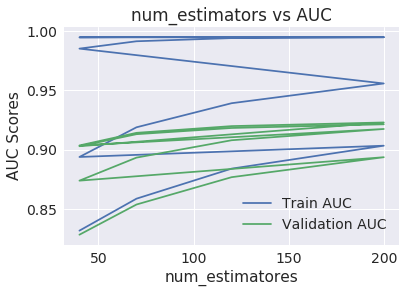

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


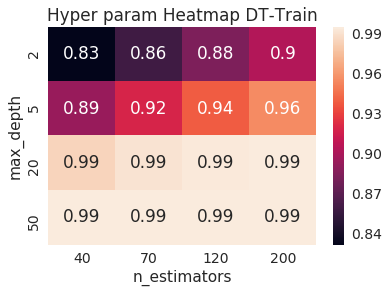

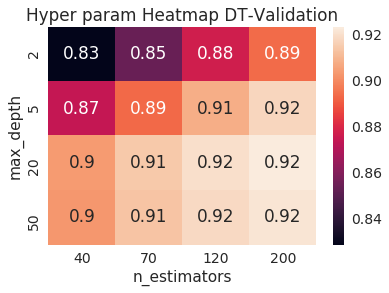

Best hyperparam value:  (20, 200)


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


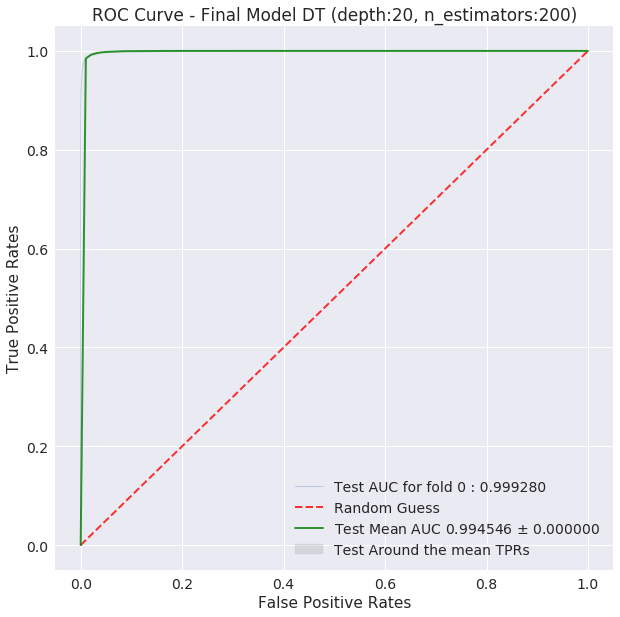

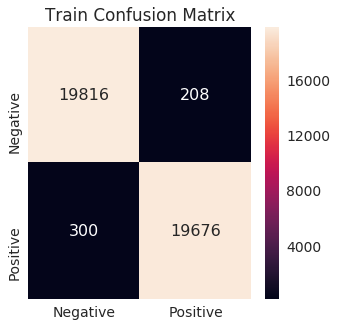

               Negative      Positive
Precision      0.985086      0.989539
Recall         0.989612      0.984982
Fscore         0.987344      0.987255
Support    20024.000000  19976.000000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


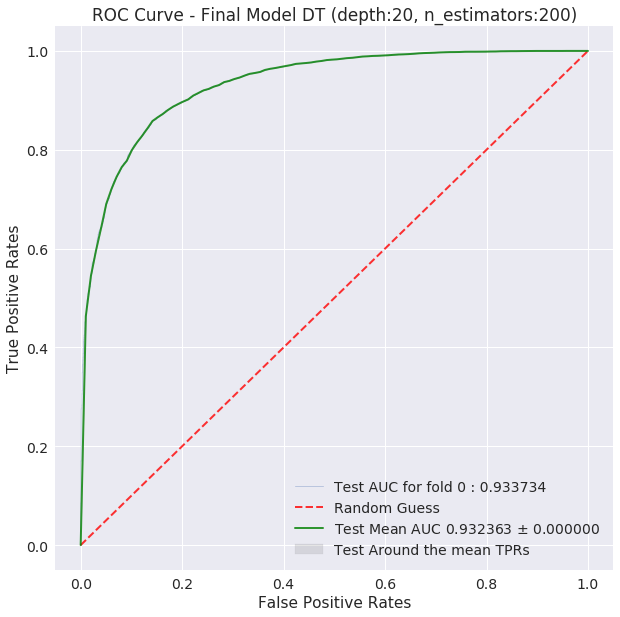

Test auc score  0.932363355825329


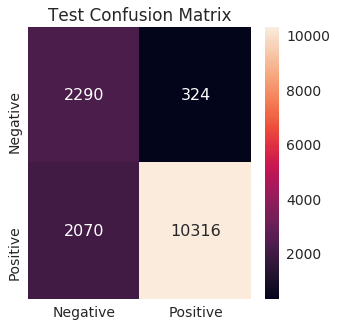

              Negative      Positive
Precision     0.525229      0.969549
Recall        0.876052      0.832876
Fscore        0.656725      0.896031
Support    2614.000000  12386.000000
Results Summary: 
 [('Hyper Param', (20, 200)), ('AUC', '0.9324'), ('f-score(-ve)', '65.6725'), ('f-score(+ve)', '89.6031')]


In [24]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_b1 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

### [B.2] Applying XGBOOST on TFIDF,<font color='red'> SET 2</font>

In [25]:
# form two lists
depth_list = [2, 5, 20, 50] # depends on size of dataset
n_estimators_listt = [40, 70, 120, 200] # depends on size of dataset

# create a configuartion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF/train_bigram_tfidf.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF/test_bigram_tfidf.csv',
    'train_size' : 40000,
    'test_size' : 15000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'xgb' # 'xgb' or 'rf'
}

Train df shape (40000, 503)
Class label distribution in train df:
 0    20024
1    19976
Name: Label, dtype: int64
Test df shape (15000, 503)
Class label distribution in test df:
 1    12386
0     2614
Name: Label, dtype: int64
Shape of ->  train features :40000,501, test features: 15000,501
Shape of -> train labels :40000, test labels: 15000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

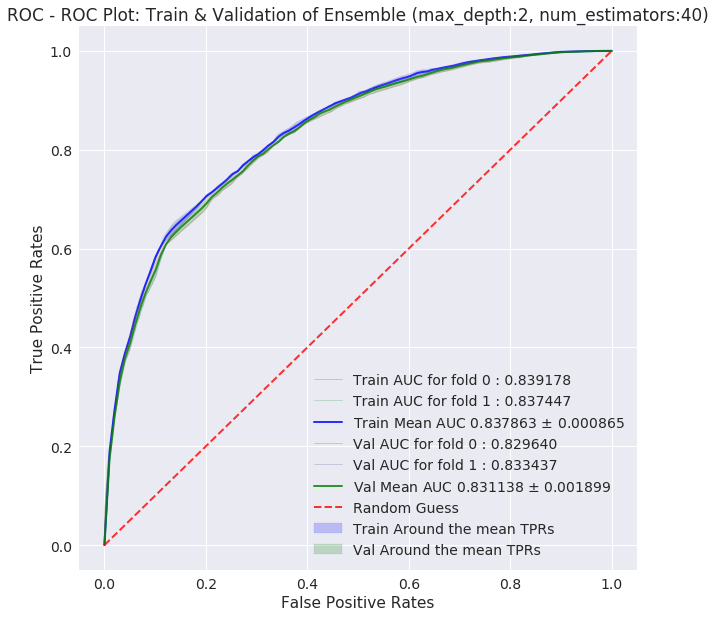

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

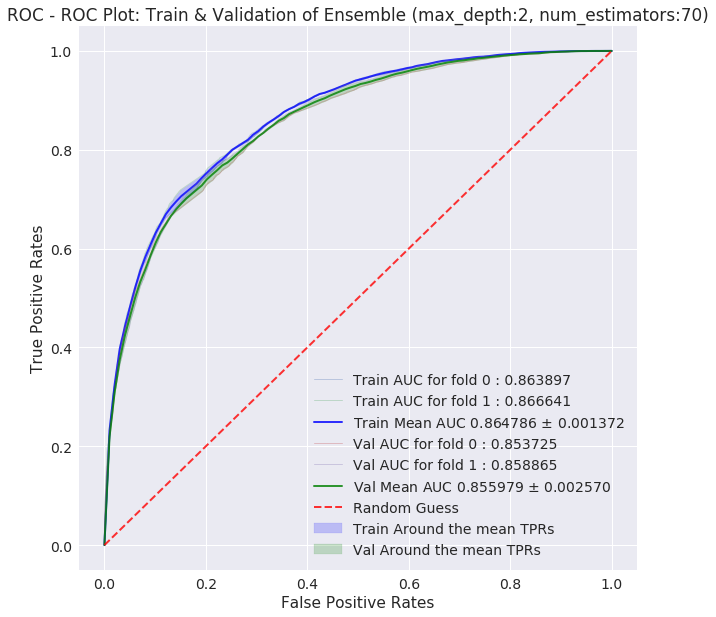

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

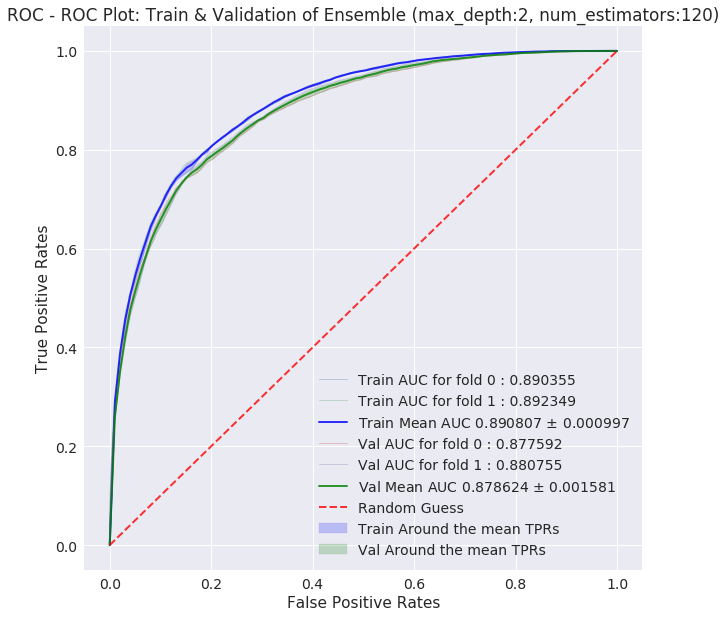

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

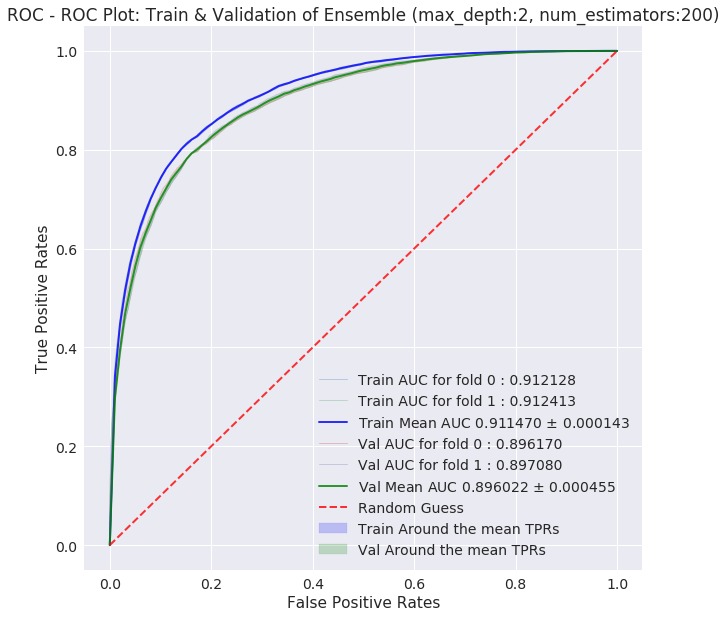

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

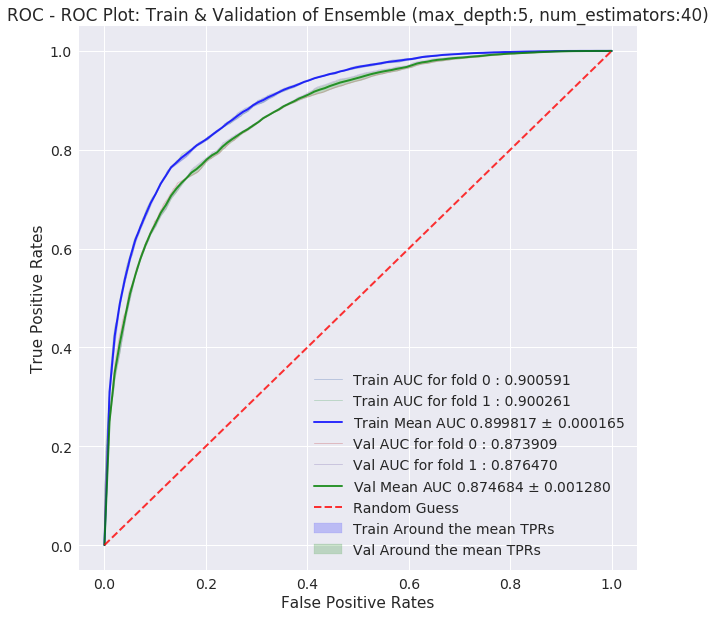

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

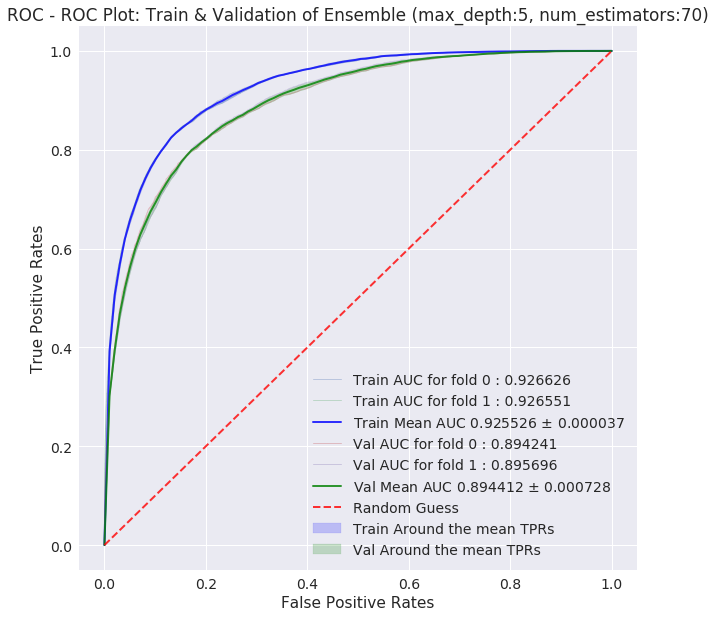

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

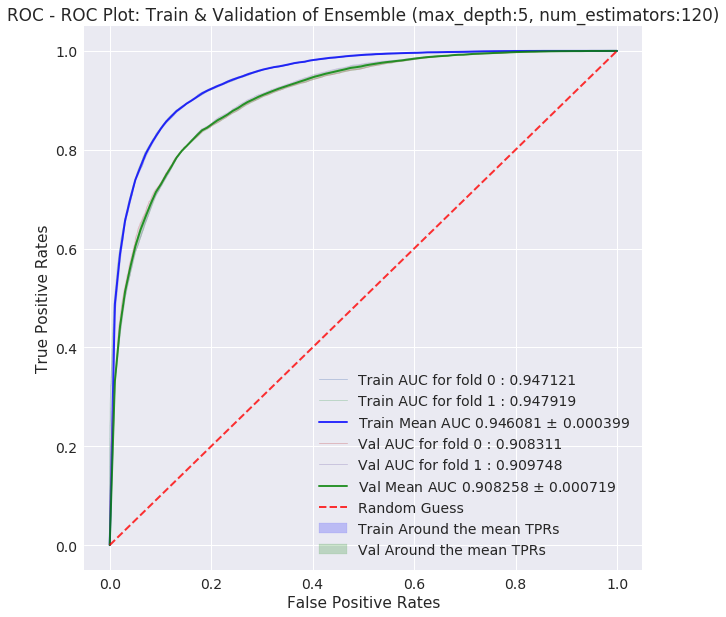

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

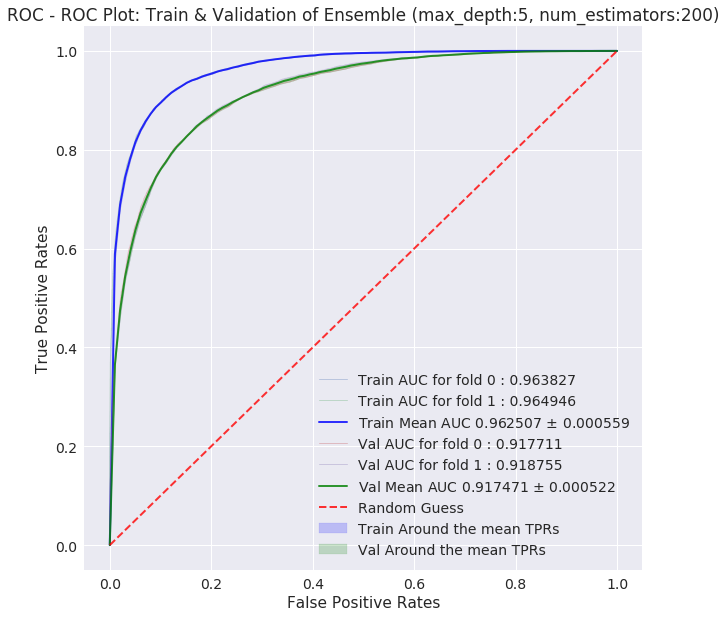

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

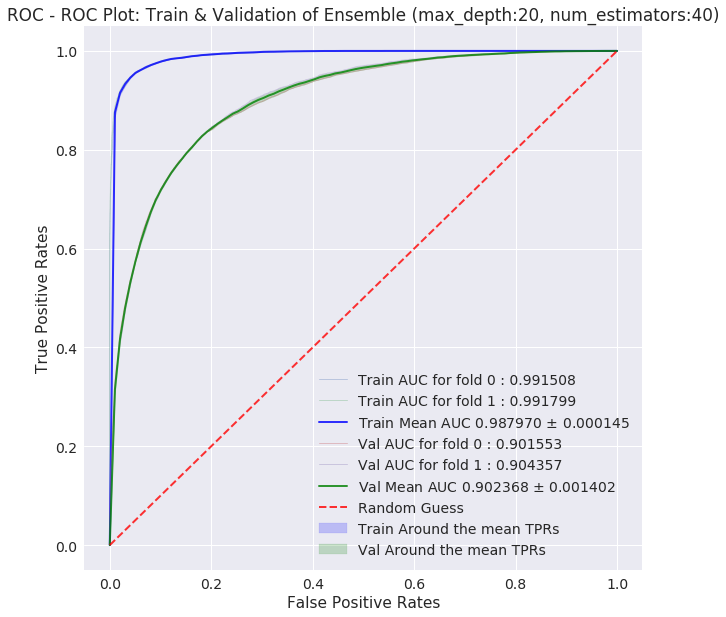

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

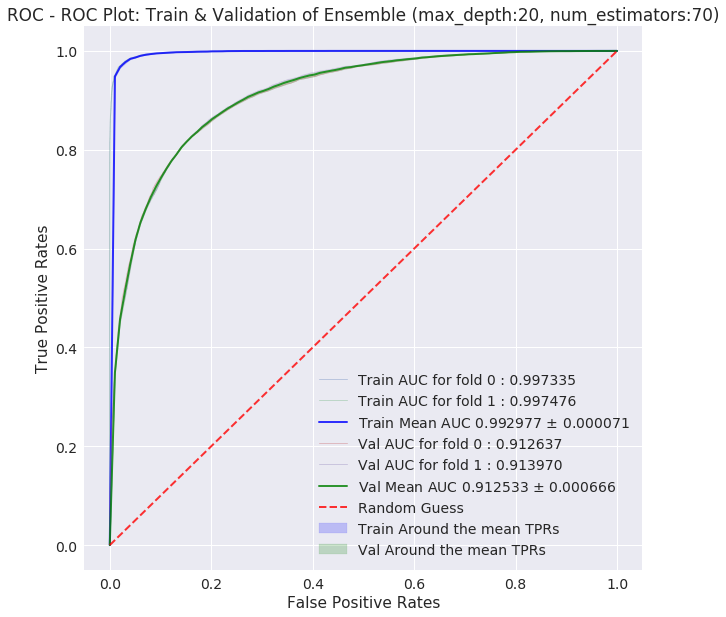

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

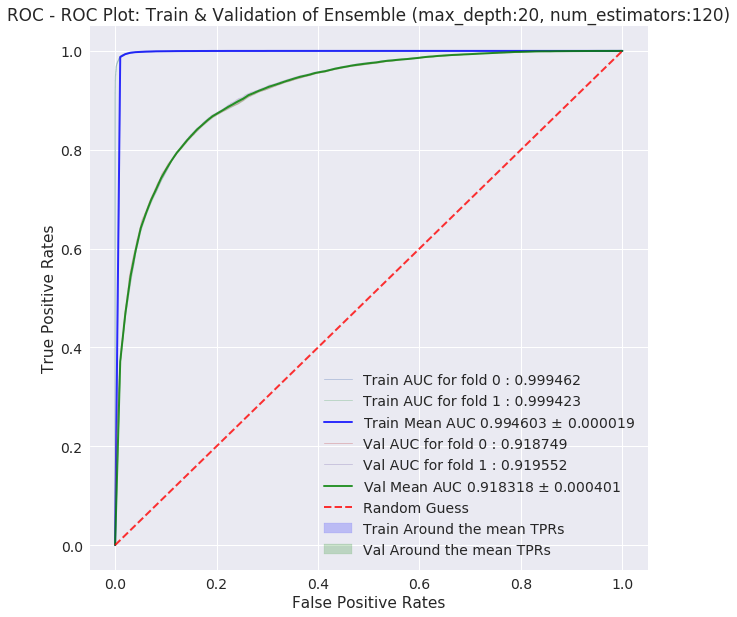

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

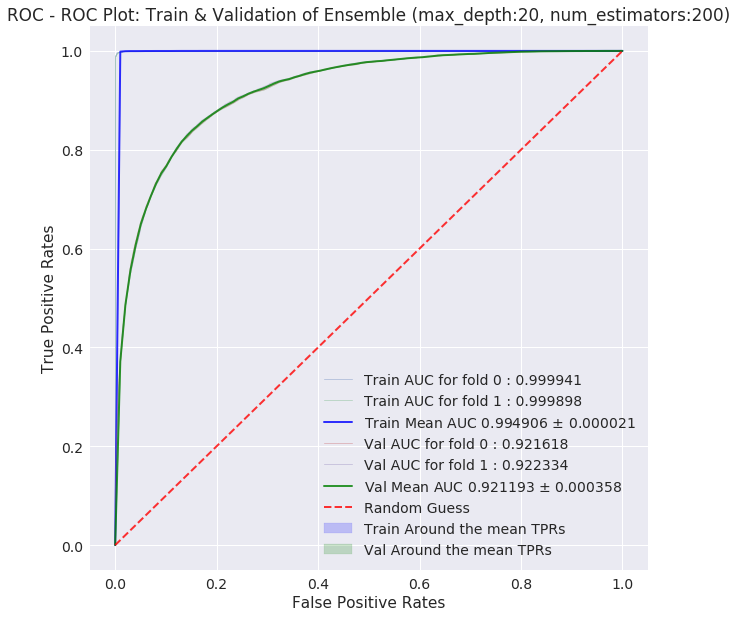

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

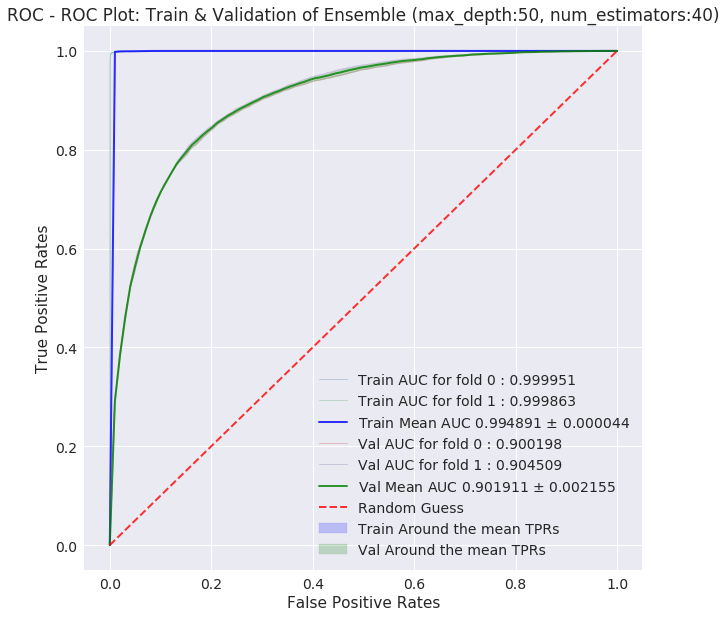

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

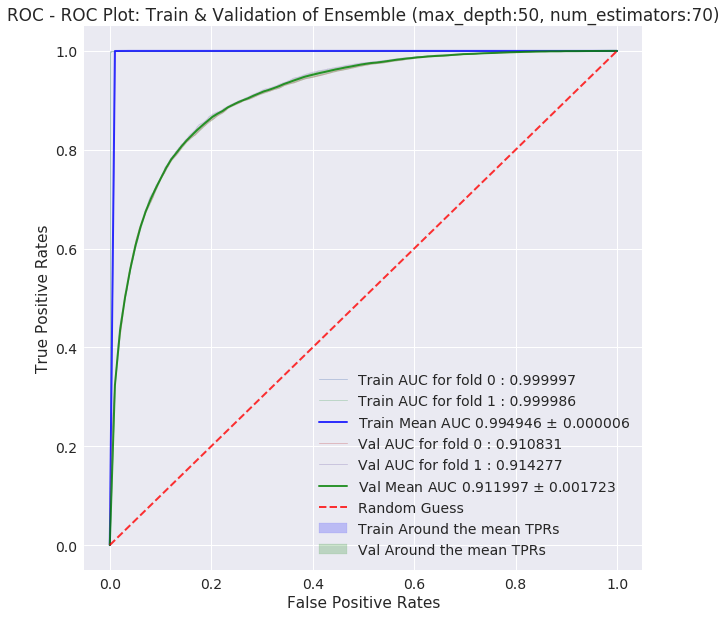

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

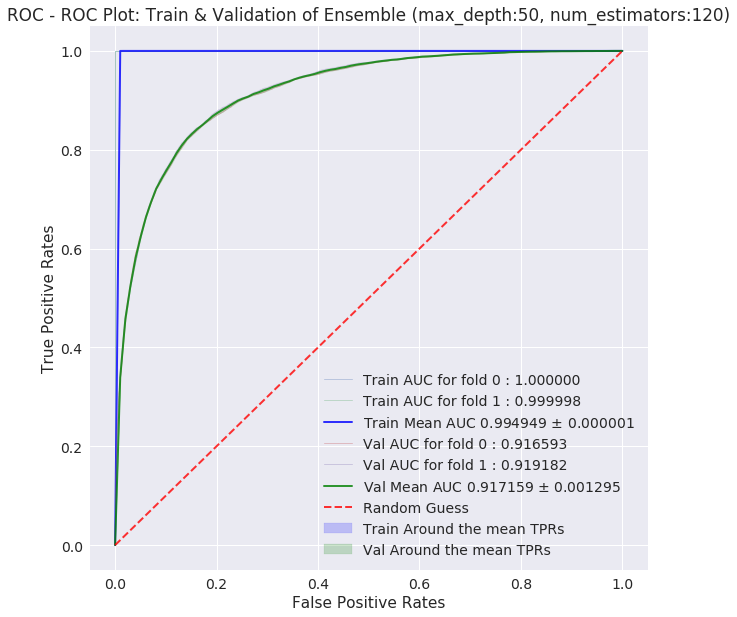

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

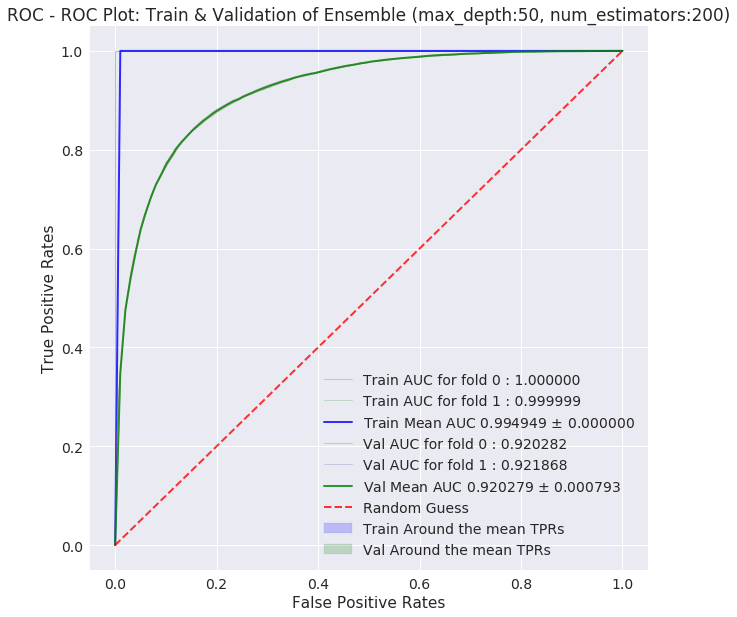

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


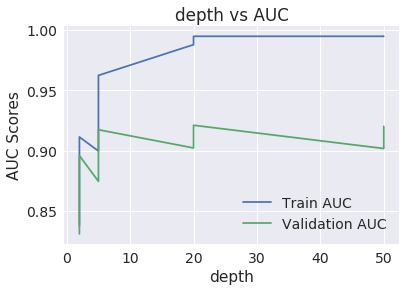

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


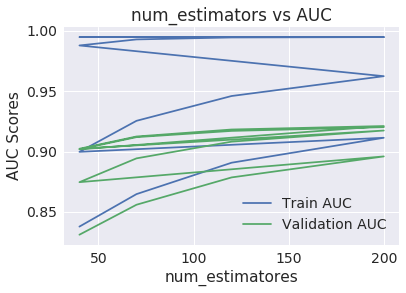

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


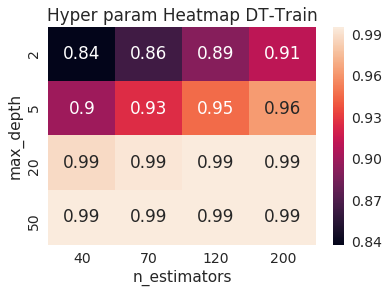

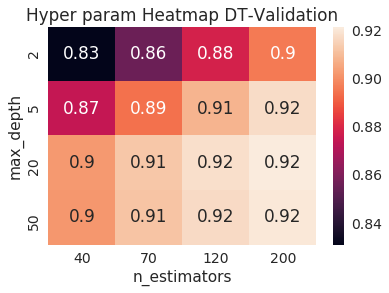

Best hyperparam value:  (20, 200)


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


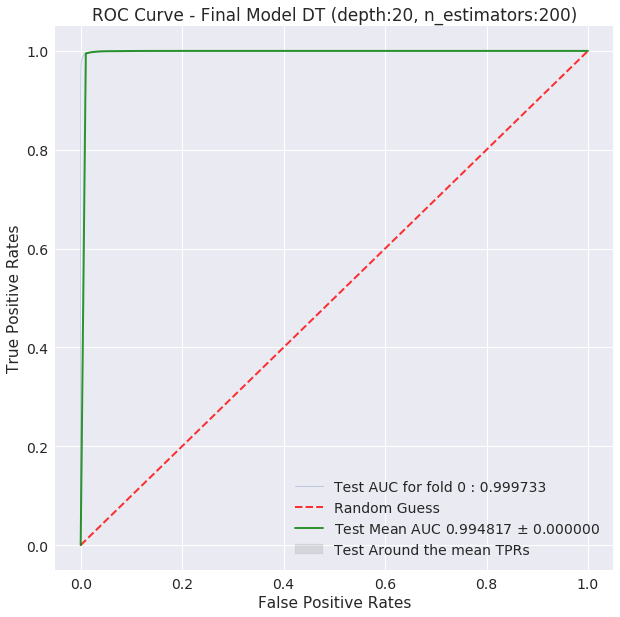

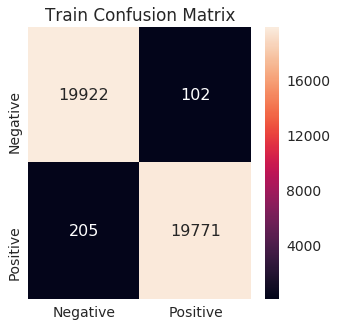

               Negative      Positive
Precision      0.989815      0.994867
Recall         0.994906      0.989738
Fscore         0.992354      0.992296
Support    20024.000000  19976.000000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


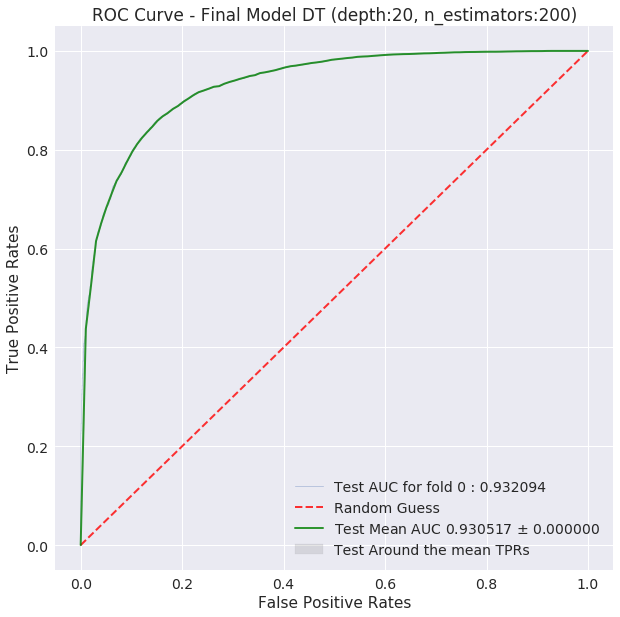

Test auc score  0.9305170223142127


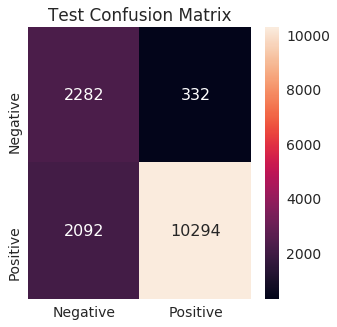

              Negative      Positive
Precision     0.521719      0.968756
Recall        0.872992      0.831100
Fscore        0.653120      0.894664
Support    2614.000000  12386.000000
Results Summary: 
 [('Hyper Param', (20, 200)), ('AUC', '0.9305'), ('f-score(-ve)', '65.3120'), ('f-score(+ve)', '89.4664')]


In [26]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_b2 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

### [B.3] Applying XGBOOST on AVG W2V,<font color='red'> SET 3</font>

In [27]:
# form two lists
depth_list = [2, 5, 20, 50] # depends on size of dataset
n_estimators_list = [40, 70, 120, 200] # depends on size of dataset

# create a configuartion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/AVG_W2V/train_avg_w2v.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/AVG_W2V/test_avg_w2v.csv',
    'train_size' : 40000,
    'test_size' : 15000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'xgb' # 'xgb' or 'rf'
}

Train df shape (40000, 52)
Class label distribution in train df:
 0    20024
1    19976
Name: Label, dtype: int64
Test df shape (15000, 52)
Class label distribution in test df:
 1    12386
0     2614
Name: Label, dtype: int64
Shape of ->  train features :40000,50, test features: 15000,50
Shape of -> train labels :40000, test labels: 15000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

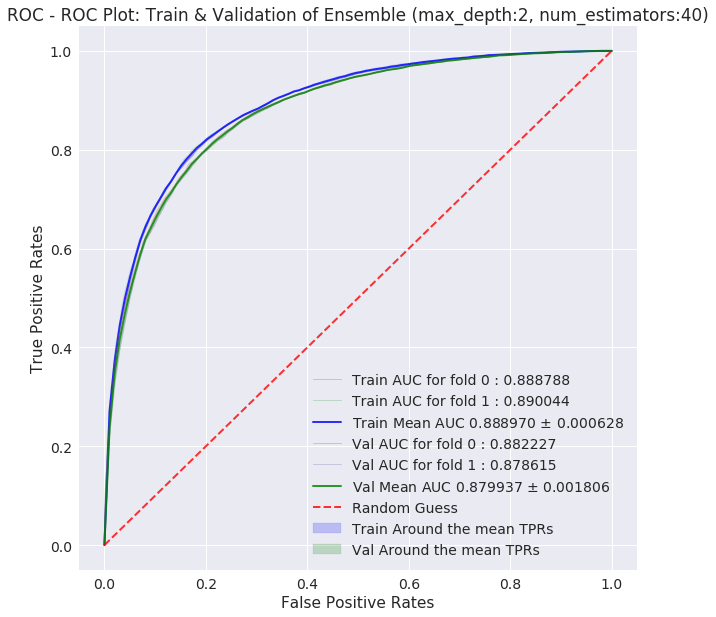

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

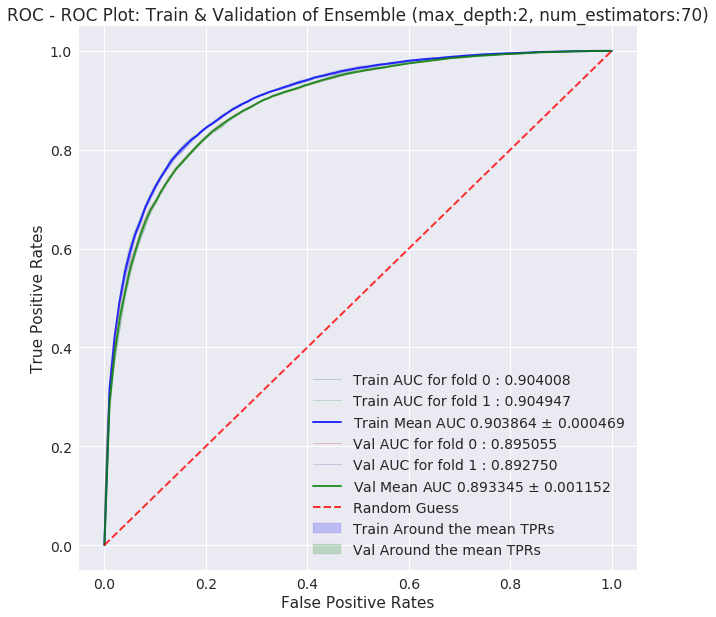

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

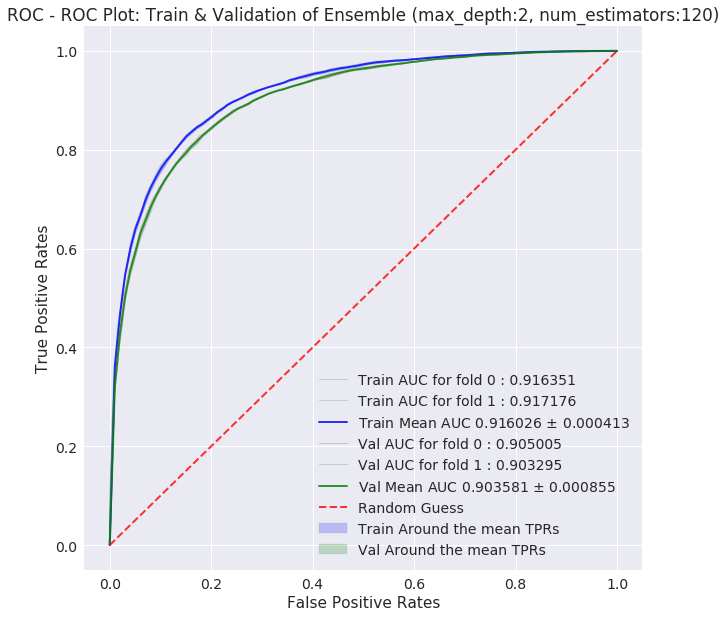

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

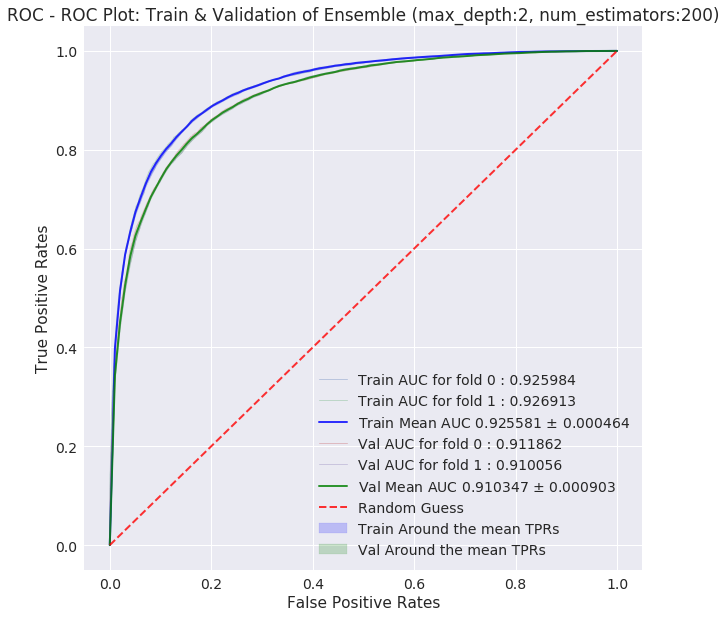

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

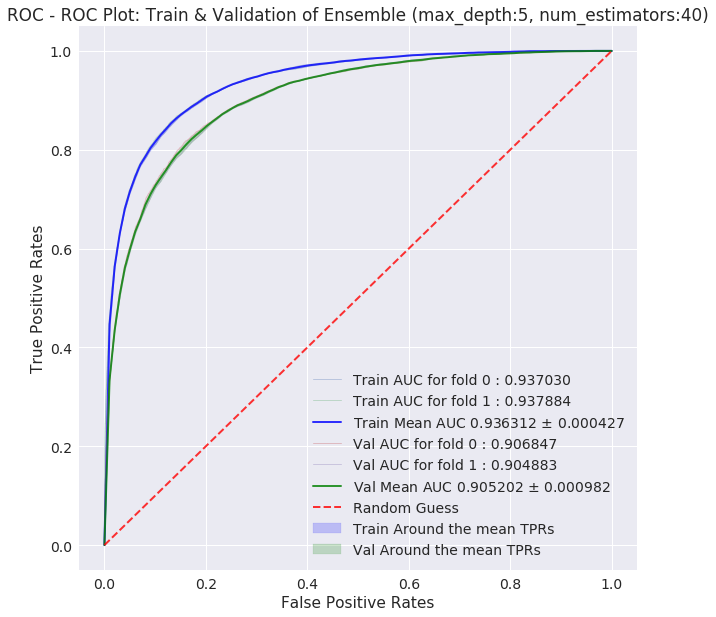

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

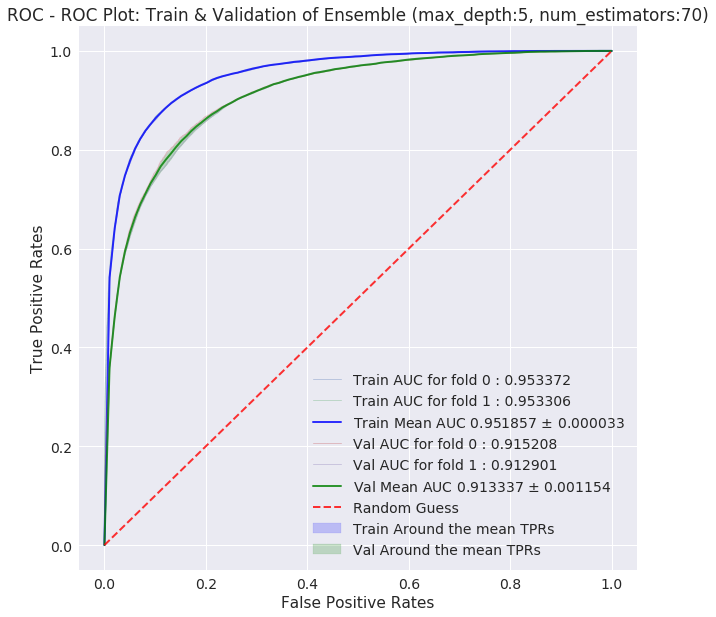

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

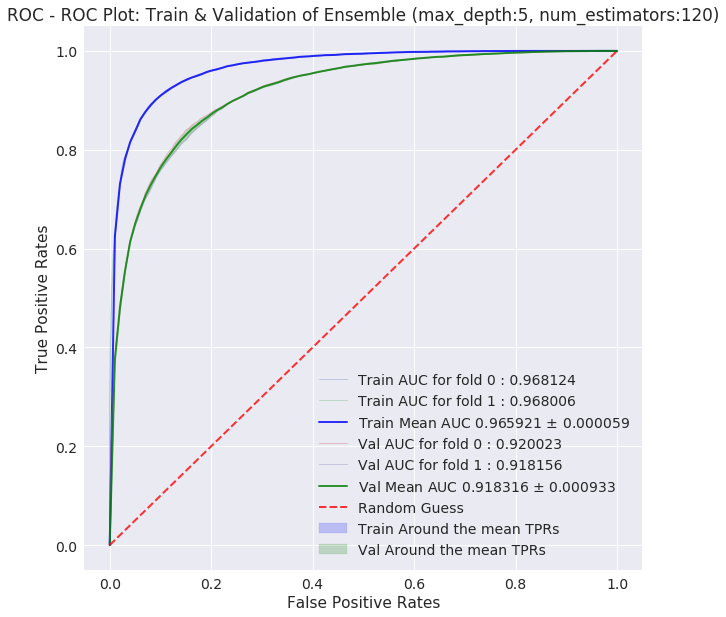

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

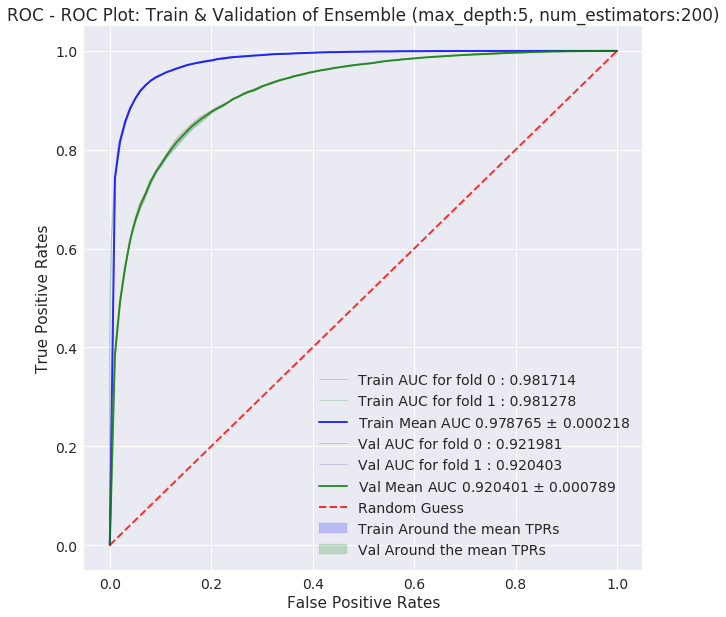

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

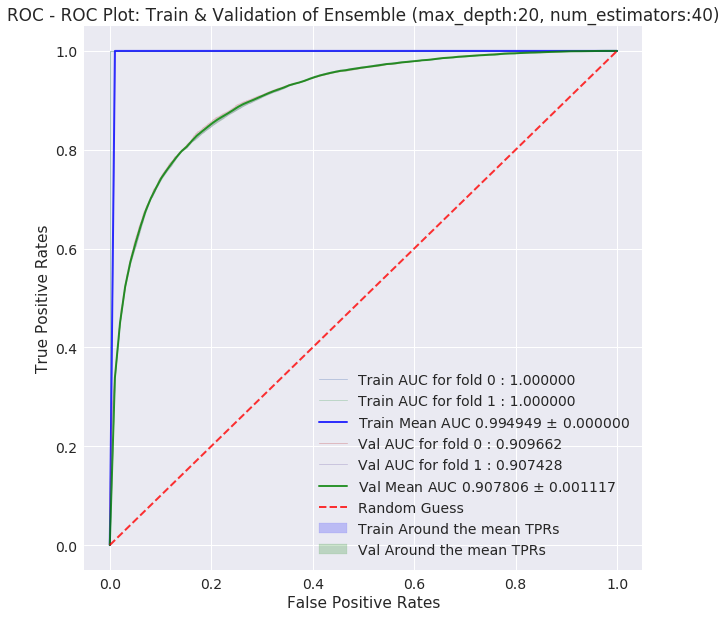

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

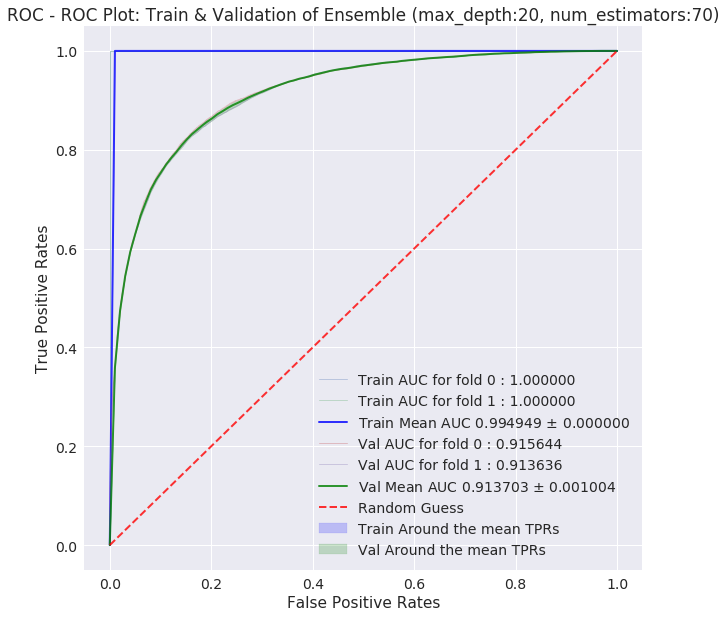

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

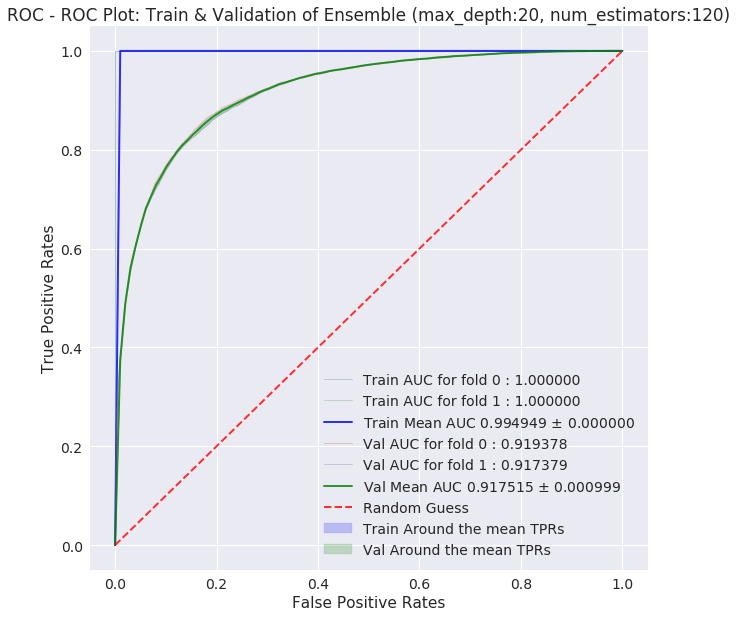

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

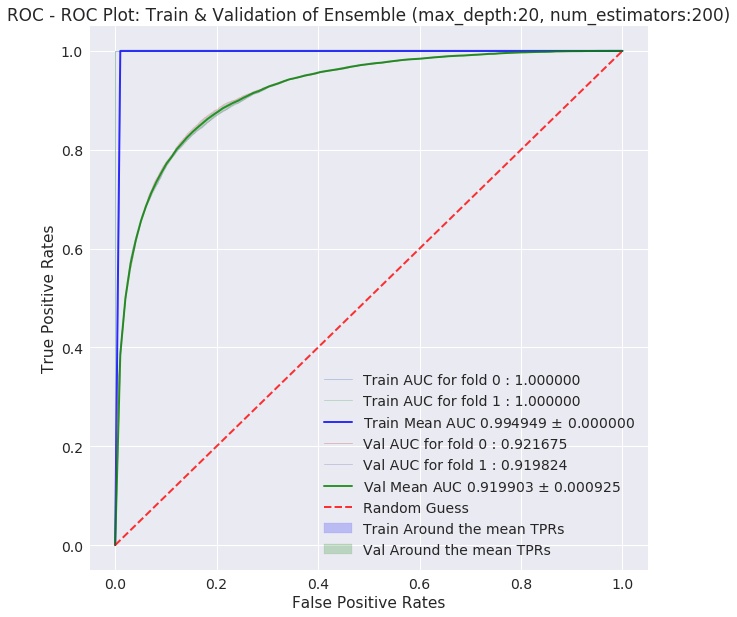

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

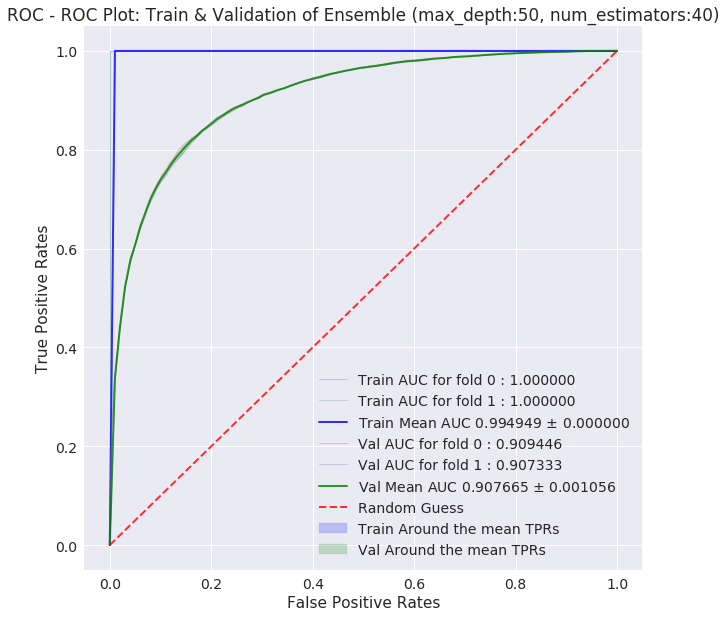

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

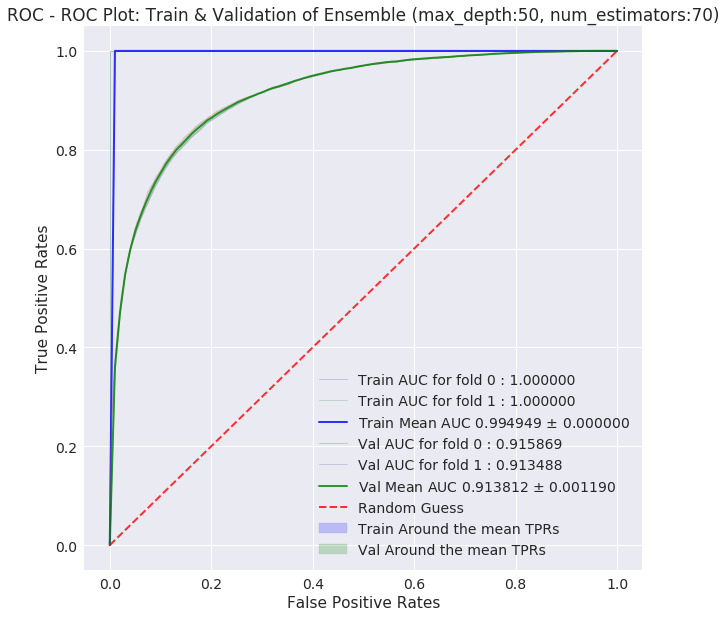

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

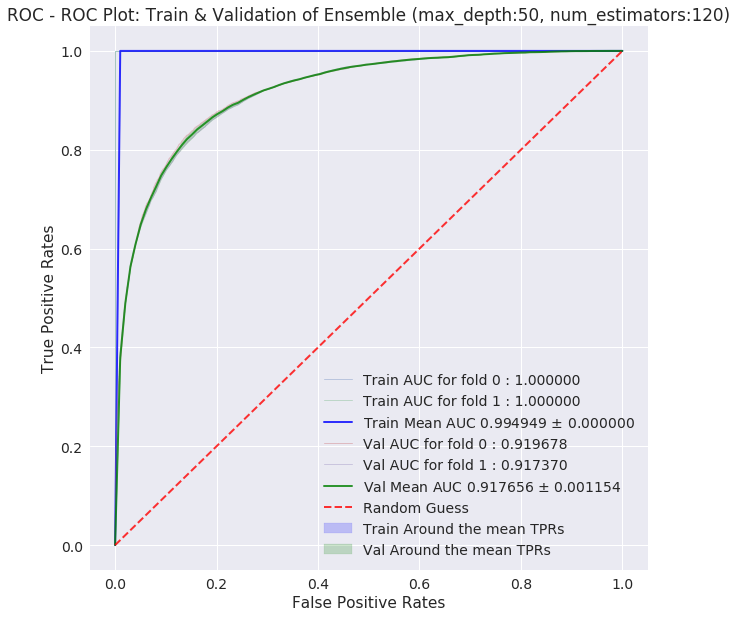

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

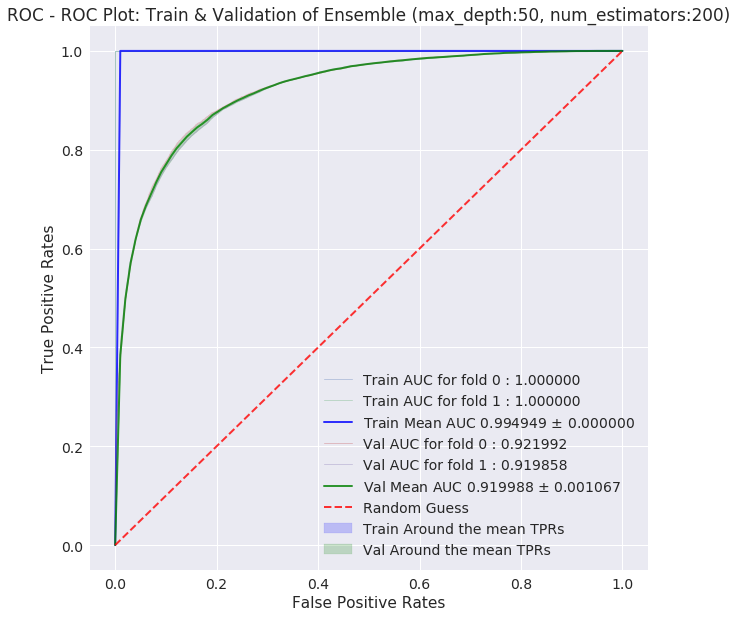

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


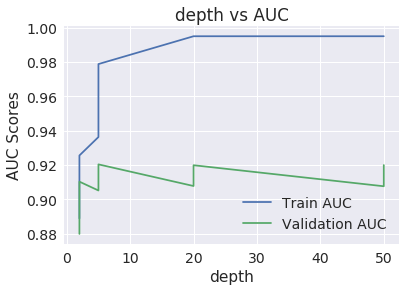

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


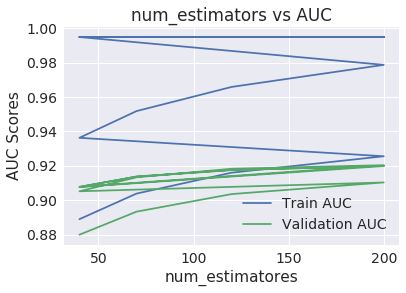

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


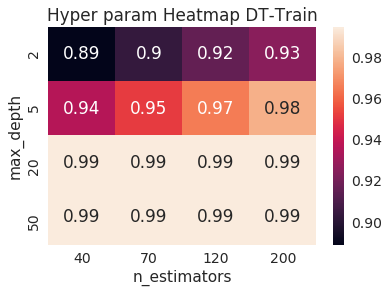

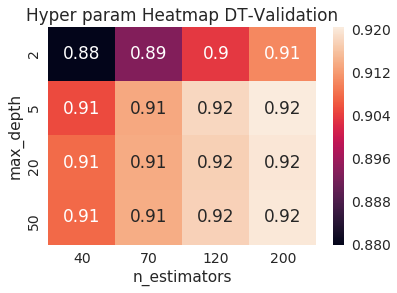

Best hyperparam value:  (5, 200)


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


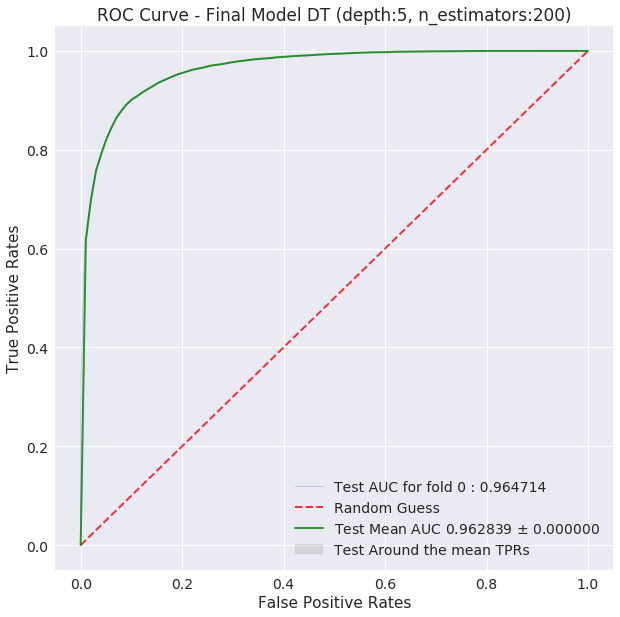

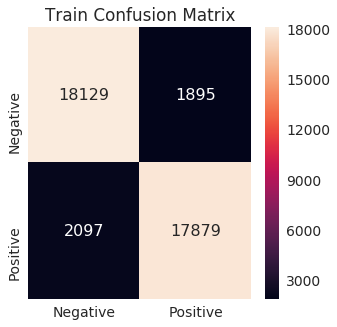

               Negative      Positive
Precision      0.896322      0.904167
Recall         0.905364      0.895024
Fscore         0.900820      0.899572
Support    20024.000000  19976.000000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


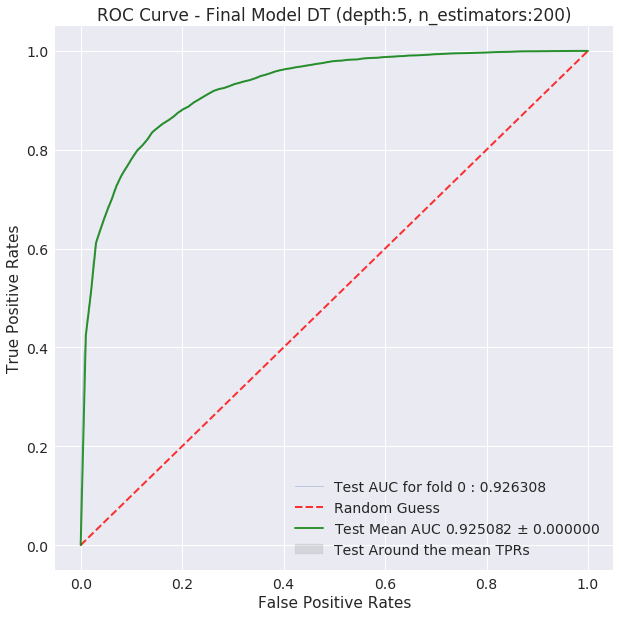

Test auc score  0.9250815926094467


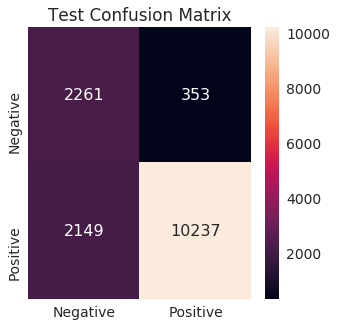

              Negative      Positive
Precision     0.512698      0.966667
Recall        0.864958      0.826498
Fscore        0.643793      0.891104
Support    2614.000000  12386.000000
Results Summary: 
 [('Hyper Param', (5, 200)), ('AUC', '0.9251'), ('f-score(-ve)', '64.3793'), ('f-score(+ve)', '89.1104')]


In [28]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_b3 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

### [B.4] Applying XGBOOST on TFIDF W2V,<font color='red'> SET 4</font>

In [29]:
# form two lists
depth_list = [2, 5, 20, 50] # depends on size of dataset
n_estimators_list = [40, 70, 120, 200] # depends on size of dataset

# create a configuarion dictionary
config_dict = {
    'train_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF_W2V/train_tf_w2v.csv',
    'test_csv_path' : '/home/amd_3/AAIC/ASM_REPO/Processed_data/AMZN_FOOD_REVIW/TFIDF_W2V/test_tf_w2v.csv',
    'train_size' : 40000,
    'test_size' : 15000,
    'hyperparam_list' : list(product(depth_list, n_estimators_list)),
    'implementation': 'xgb' # 'xgb' or 'rf'
}

Train df shape (40000, 52)
Class label distribution in train df:
 0    20024
1    19976
Name: Label, dtype: int64
Test df shape (15000, 52)
Class label distribution in test df:
 1    12386
0     2614
Name: Label, dtype: int64
Shape of ->  train features :40000,50, test features: 15000,50
Shape of -> train labels :40000, test labels: 15000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

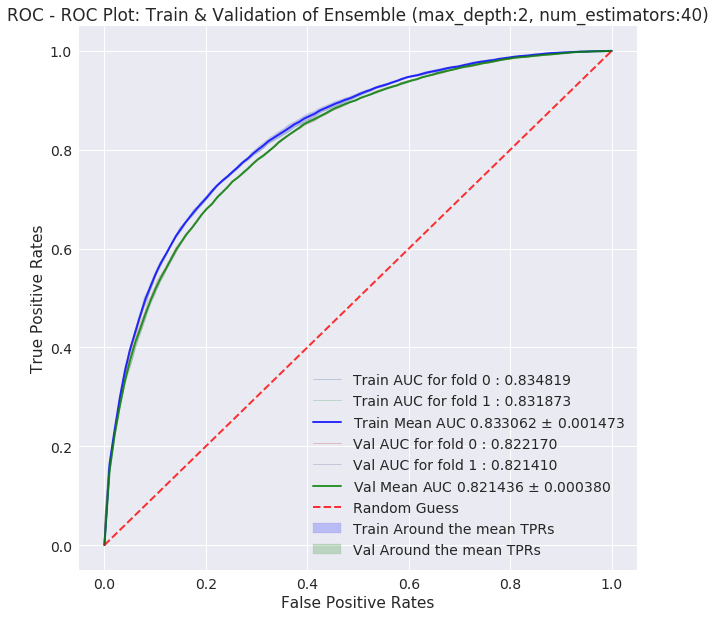

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

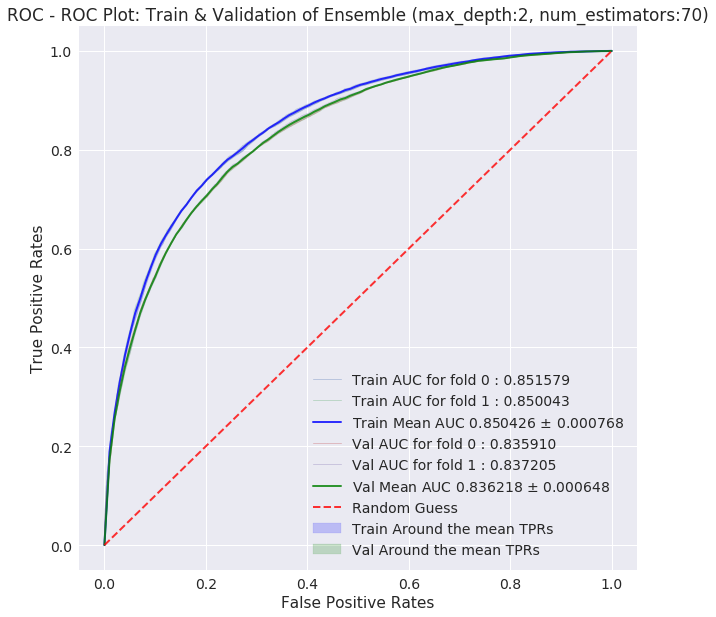

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

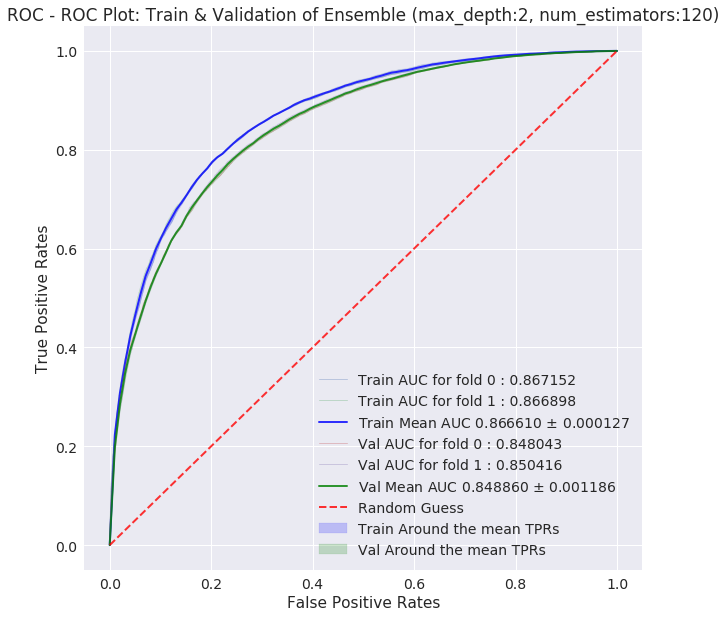

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

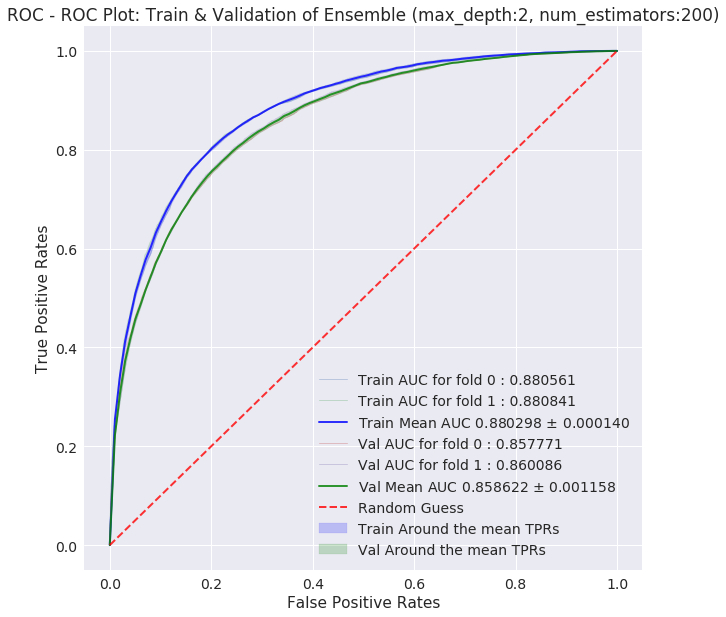

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

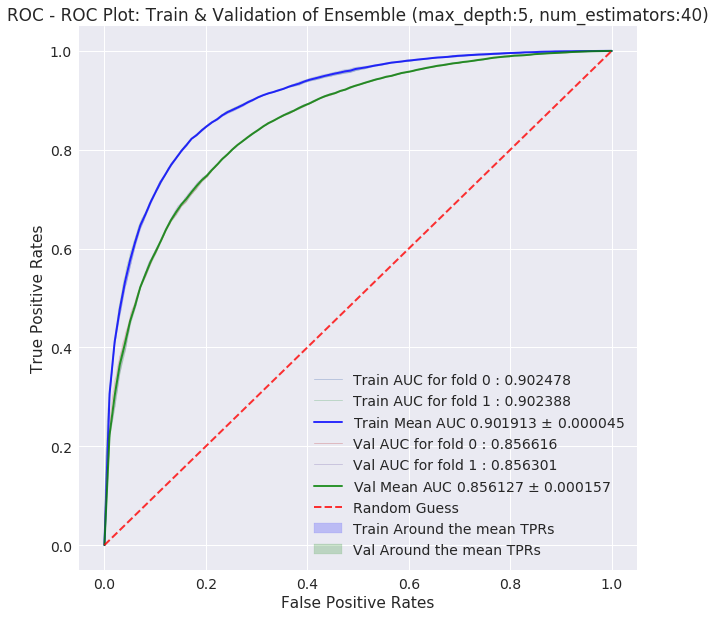

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

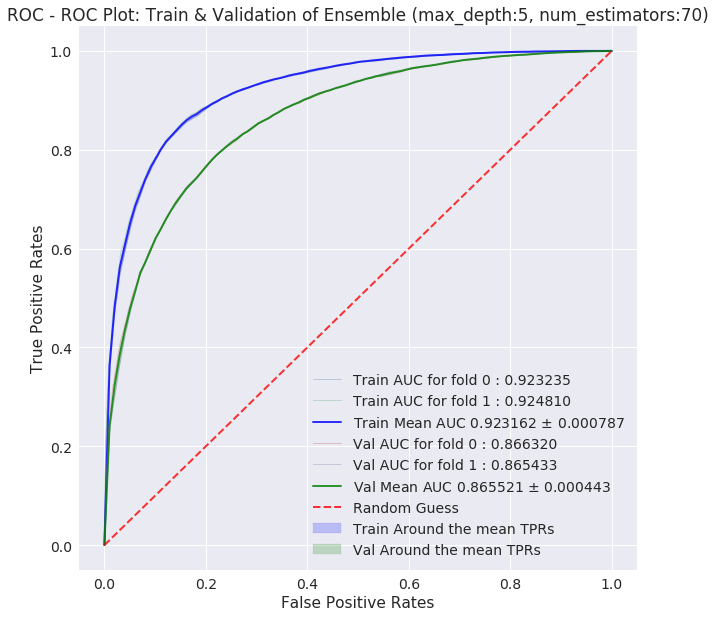

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

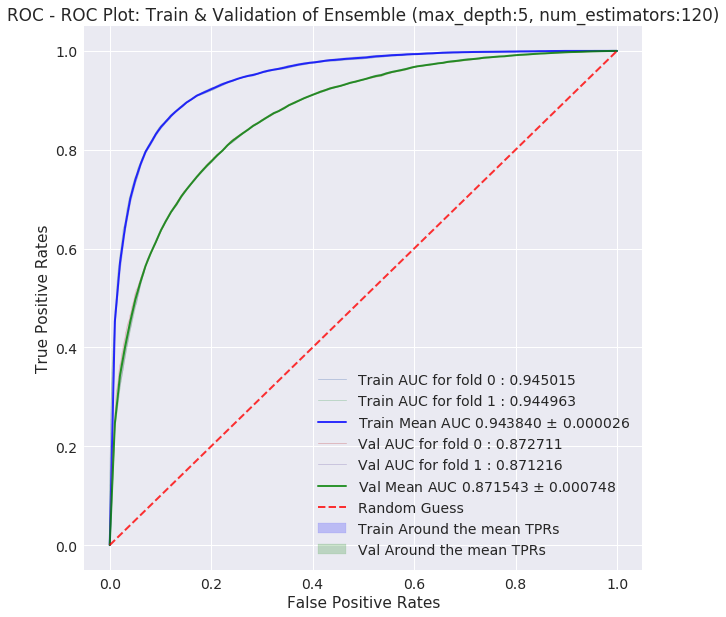

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

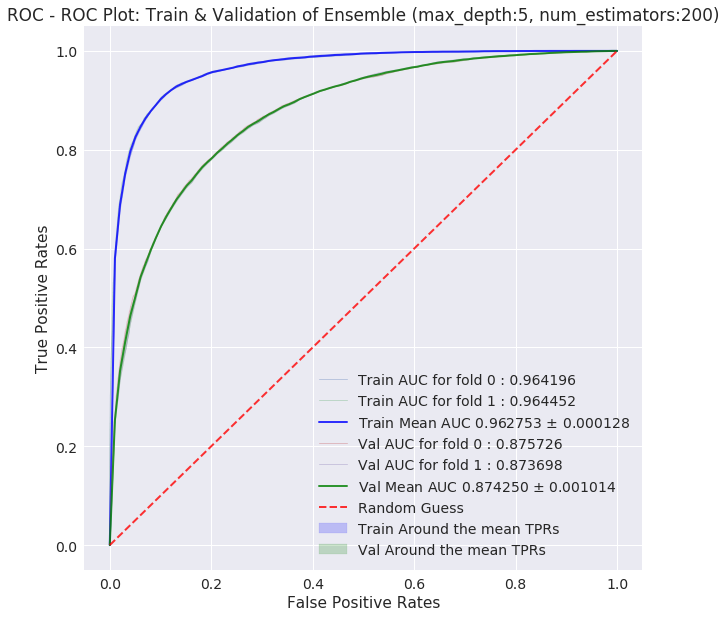

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

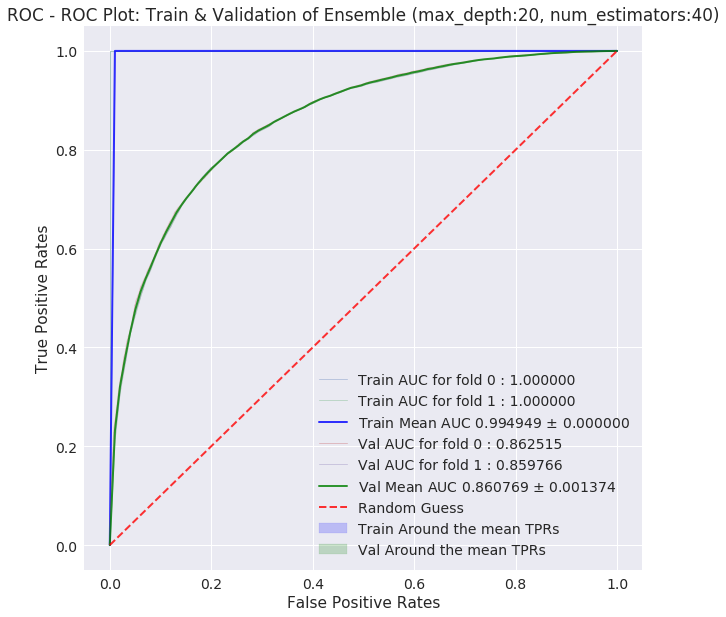

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

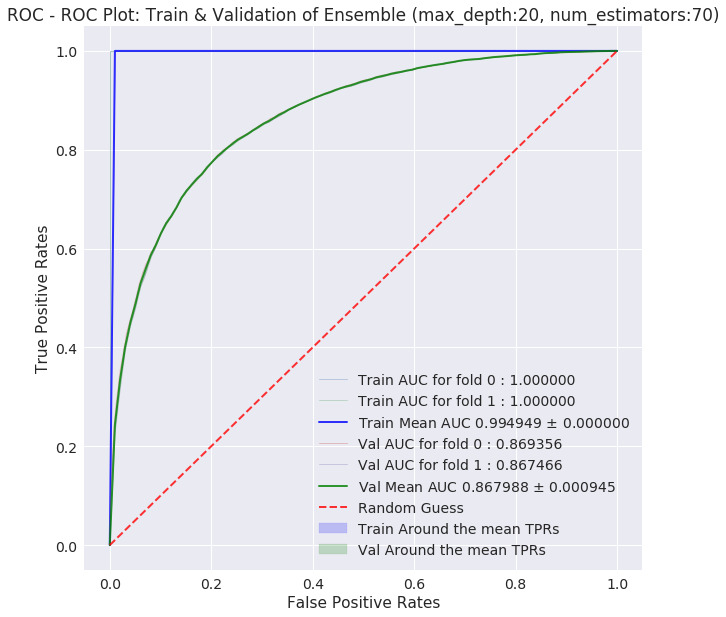

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

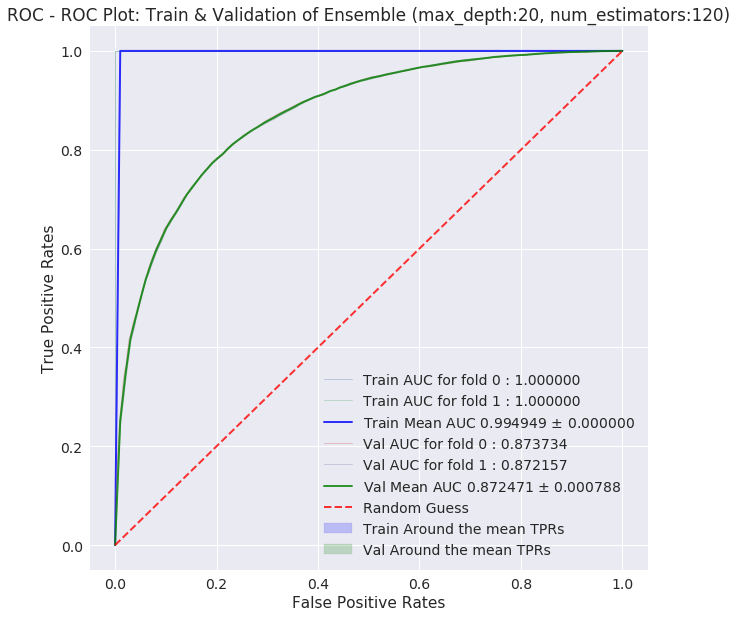

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

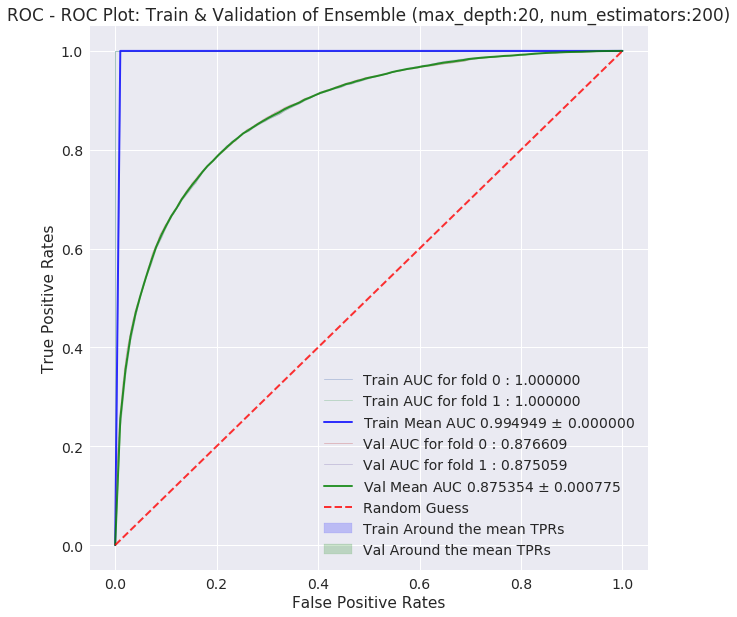

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

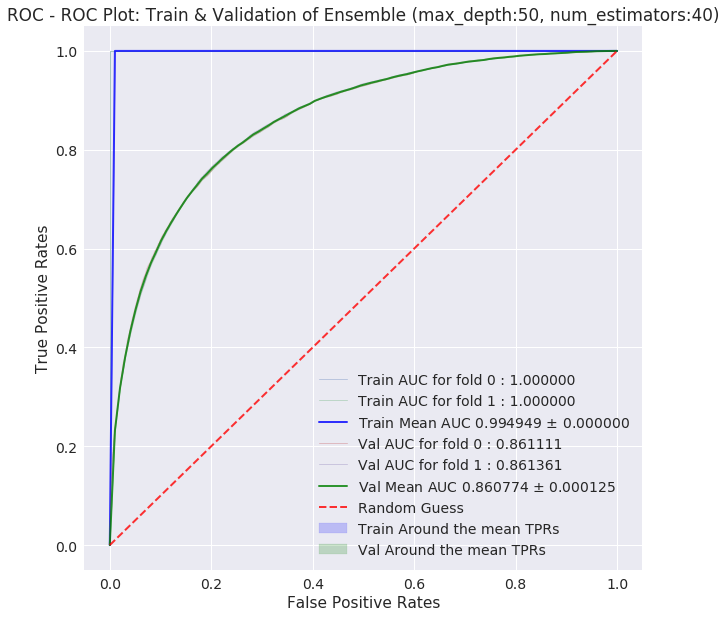

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

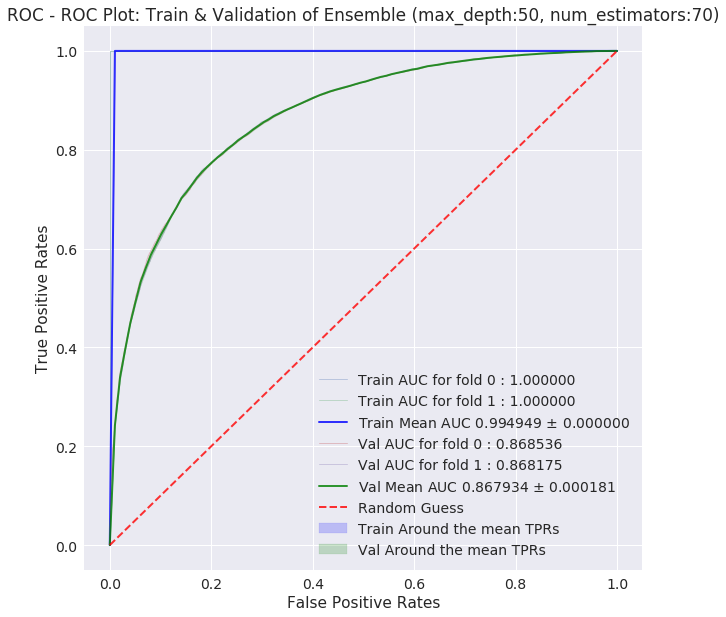

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

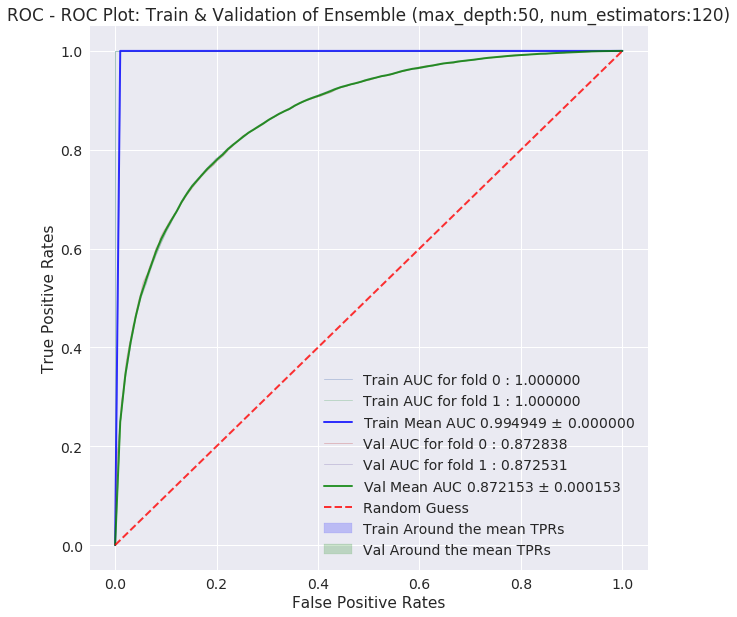

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambig

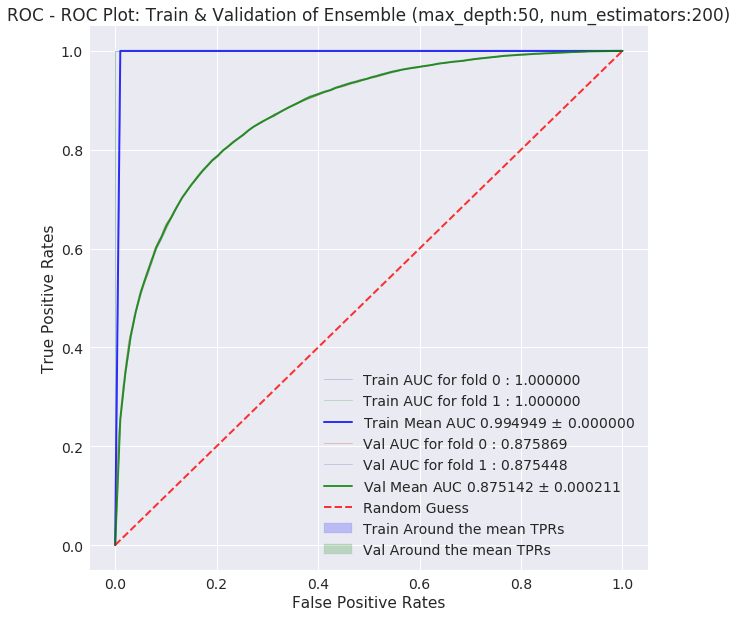

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The depth vs AUC score plot


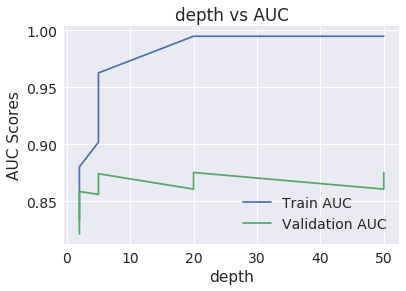

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


 The num_estimators vs AUC score plot


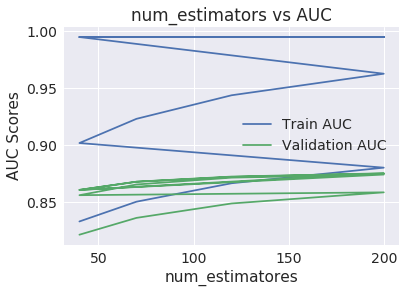

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


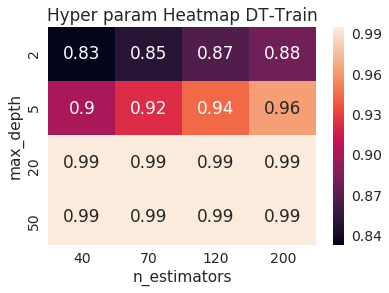

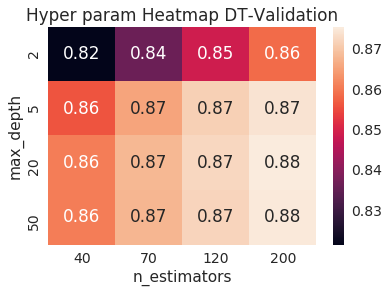

Best hyperparam value:  (20, 200)


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


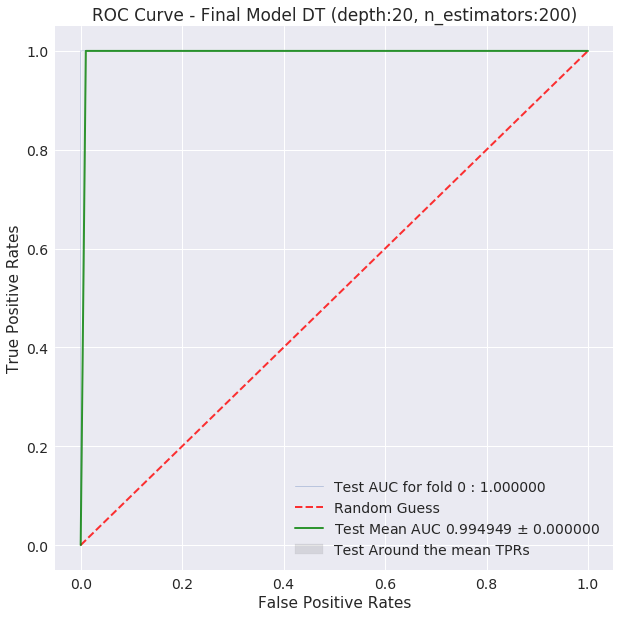

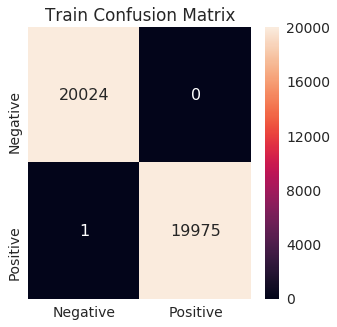

               Negative      Positive
Precision      0.999950      1.000000
Recall         1.000000      0.999950
Fscore         0.999975      0.999975
Support    20024.000000  19976.000000


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


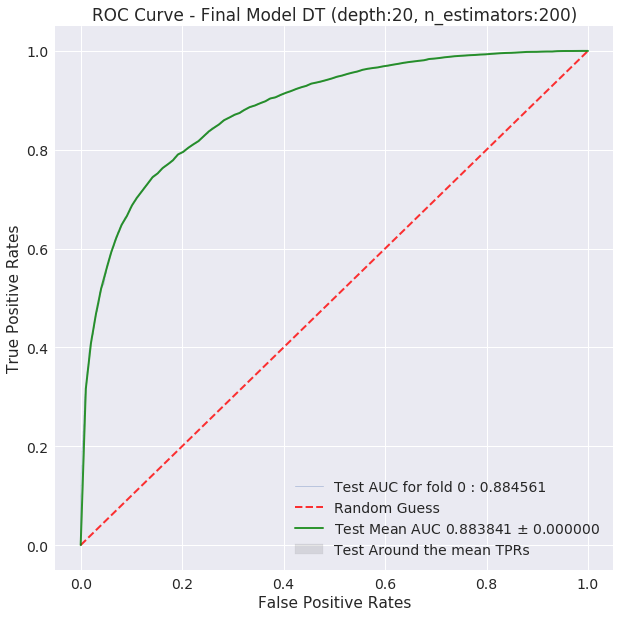

Test auc score  0.8838408303933897


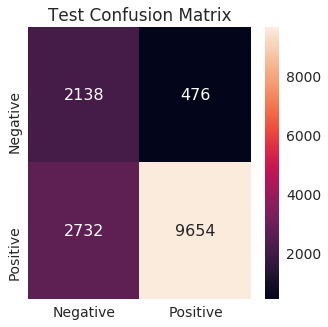

              Negative      Positive
Precision     0.439014      0.953011
Recall        0.817904      0.779428
Fscore        0.571352      0.857524
Support    2614.000000  12386.000000
Results Summary: 
 [('Hyper Param', (20, 200)), ('AUC', '0.8838'), ('f-score(-ve)', '57.1352'), ('f-score(+ve)', '85.7524')]


In [30]:
# read the train, test data and preprocess it
train_features, train_labels, test_features, test_labels = preprocess_data(config_dict,
                                                                           scaling=True,
                                                                           dim_reduction=False)

# train and validate the model
model = train_and_validate_model(config_dict, train_features, train_labels)

# test and evaluate the model
ptabe_entry_b4 = test_and_evaluate_model(config_dict, model, test_features, test_labels)

## Observation on XGB set 1, set 2, set 3, set 4

%%HTML
<ul>
<li> XGB has more number of hyper parameters to tune and is computationally expensive to search. </li>
<li> All the xgb model has AUC score above 0.88 </li>
</ul>

# Procedure Summary

<ol>
<li> Train random forest with different hyper parameter setting on all 4 datasets </li>
<li> Identify the best hyper parameter usig cross validation method </li>
<li> Build final RF model by using the best hyper param identified </li>
<li> Visualize the performace of model using ROC curve & confusion matrix </li>
<li> Represent the important features identified by the decision tree in word cloud </li>
<li> Train XGB models with different hyper parameter setting on all 4 datasets </li>
<li> Identify the best hyper parameter usig cross validation method </li>
<li> Build final XGB model by using the best hyper param identified </li>
<li> Visualize the performace of model using ROC curve & confusion matrix </li>
</ol>

# Results Summary

In [31]:
from prettytable import PrettyTable
Pret_table = PrettyTable()
Pret_table.field_names = ['Vectorizer', 'Model', '(max_depth, n_estimators)', 
                          'AUC', 'Fscore (-ve)', 'Fscore (+ve)']
Pret_table.title = 'Ensemble Results Summary'

In [32]:
# RF Results Summary
Pret_table.add_row(['BoW', 'RF'] + ptabe_entry_a1)
Pret_table.add_row(['TF-IDF', 'RF'] + ptabe_entry_a2)
Pret_table.add_row(['Avg W2V', 'RF'] + ptabe_entry_a3)
Pret_table.add_row(['TF-IDF W2V', 'RF'] + ptabe_entry_a4)

# XGBoost Results Summary
Pret_table.add_row(['BoW', 'XGB'] + ptabe_entry_b1)
Pret_table.add_row(['TF-IDF', 'XGB'] + ptabe_entry_b2)
Pret_table.add_row(['Avg W2V', 'XGB'] + ptabe_entry_b3)
Pret_table.add_row(['TF-IDF W2V', 'XGB'] + ptabe_entry_b4)

In [33]:
print(Pret_table)

+---------------------------------------------------------------------------------------+
|                                Ensemble Results Summary                               |
+------------+-------+---------------------------+--------+--------------+--------------+
| Vectorizer | Model | (max_depth, n_estimators) |  AUC   | Fscore (-ve) | Fscore (+ve) |
+------------+-------+---------------------------+--------+--------------+--------------+
|    BoW     |   RF  |         (50, 500)         | 0.9172 |   62.8417    |   88.2320    |
|   TF-IDF   |   RF  |         (50, 300)         | 0.9148 |   62.7832    |   88.2811    |
|  Avg W2V   |   RF  |         (10, 500)         | 0.9112 |   61.7723    |   87.8103    |
| TF-IDF W2V |   RF  |         (10, 500)         | 0.8611 |   54.4582    |   84.3995    |
|    BoW     |  XGB  |         (20, 200)         | 0.9324 |   65.6725    |   89.6031    |
|   TF-IDF   |  XGB  |         (20, 200)         | 0.9305 |   65.3120    |   89.4664    |
|  Avg W2V

# Conclusions

%%HTML
<ul>
<li> XGB models outperformed when compared with RF models. The f-score for +ve class as well as -ve
     class is higher when compared with RF model</li>
<li> The f-score of XGB model for -ve class is approximately 3% more than the f-score of 
     RF model for -ve class </li>
</ul>